Deliverable 1: Preprocessing the Data for a Neural Network

# Optimization Attempt 1: Dropping affliliation and orginization columns

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import pandas as pd
import tensorflow as tf

#  Import and read the charity_data.csv.
import pandas as pd 
application_df = pd.read_csv("./Resources/charity_data.csv")
application_df.head()

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages

,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [2]:
# Drop the non-beneficial ID columns, 'EIN' and 'NAME'.
application_df = application_df.drop(columns=["EIN","NAME","AFFILIATION","ORGANIZATION"])
application_df.head()

,APPLICATION_TYPE,CLASSIFICATION,USE_CASE,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,C1000,ProductDev,1,0,N,5000,1
1,T3,C2000,Preservation,1,1-9999,N,108590,1
2,T5,C3000,ProductDev,1,0,N,5000,0
3,T3,C2000,Preservation,1,10000-24999,N,6692,1
4,T3,C1000,Heathcare,1,100000-499999,N,142590,1


In [3]:
# Determine the number of unique values in each column.
application_df.nunique()

APPLICATION_TYPE            17
CLASSIFICATION              71
USE_CASE                     5
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [4]:
# Look at APPLICATION_TYPE value counts for binning
application_type_counts = application_df.APPLICATION_TYPE.value_counts()
application_type_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T25        3
T14        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

<AxesSubplot:ylabel='Density'>

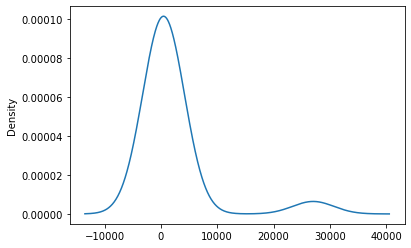

In [5]:
# Visualize the value counts of APPLICATION_TYPE
application_type_counts.plot.density()

In [6]:
# Determine which values to replace if counts are less than ...?
replace_application = list(application_type_counts[application_type_counts < 500].index)

# Replace in dataframe
for app in replace_application:
    application_df.APPLICATION_TYPE = application_df.APPLICATION_TYPE.replace(app,"Other")
    
# Check to make sure binning was successful
application_df.APPLICATION_TYPE.value_counts()

T3       27037
T4        1542
T6        1216
T5        1173
T19       1065
T8         737
T7         725
T10        528
Other      276
Name: APPLICATION_TYPE, dtype: int64

In [7]:
# Look at CLASSIFICATION value counts for binning
calssification_counts = application_df.CLASSIFICATION.value_counts()
calssification_counts

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
         ...  
C4120        1
C8210        1
C2561        1
C4500        1
C2150        1
Name: CLASSIFICATION, Length: 71, dtype: int64

<AxesSubplot:ylabel='Density'>

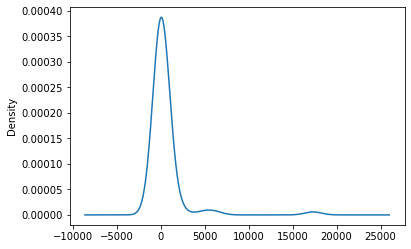

In [8]:
# Visualize the value counts of CLASSIFICATION
calssification_counts.plot.density()

In [9]:
# Determine which values to replace if counts are less than ..?
replace_class = list(calssification_counts[calssification_counts < 1800].index)

# Replace in dataframe
for cls in replace_class:
    application_df.CLASSIFICATION = application_df.CLASSIFICATION.replace(cls,"Other")
    
# Check to make sure binning was successful
application_df.CLASSIFICATION.value_counts()

C1000    17326
C2000     6074
C1200     4837
Other     2261
C3000     1918
C2100     1883
Name: CLASSIFICATION, dtype: int64

In [10]:
# Generate our categorical variable lists
application_cat = application_df.dtypes[application_df.dtypes == "object"].index.tolist()
application_cat

['APPLICATION_TYPE',
 'CLASSIFICATION',
 'USE_CASE',
 'INCOME_AMT',
 'SPECIAL_CONSIDERATIONS']

In [11]:
# Create a OneHotEncoder instance
enc = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df = pd.DataFrame(enc.fit_transform(application_df[application_cat]))

# Add the encoded variable names to the dataframe
encode_df.columns = enc.get_feature_names(application_cat)
encode_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,APPLICATION_TYPE_T7,APPLICATION_TYPE_T8,CLASSIFICATION_C1000,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [12]:
# Merge one-hot encoded features and drop the originals
application_df = application_df.merge(encode_df,left_index=True, right_index=True)
application_df = application_df.drop(application_cat,1)
application_df.head()

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


,STATUS,ASK_AMT,IS_SUCCESSFUL,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# Split our preprocessed data into our features and target arrays
y = application_df["IS_SUCCESSFUL"].values
X = application_df.drop(["IS_SUCCESSFUL"],1).values
# Split the preprocessed data into a training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

C:\Users\claud\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


In [14]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Deliverable 2: Compile, Train, and Evaluate the Model

In [15]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 40

nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu"))

# Second hidden layer
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))

# Output layer
nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Check the structure of the model
nn.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 80)                2720      
_________________________________________________________________
dense_1 (Dense)              (None, 40)                3240      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 41        
Total params: 6,001
Trainable params: 6,001
Non-trainable params: 0
_________________________________________________________________


In [16]:
# Compile the model
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [17]:
# Import checkpoint dependencies
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint path and filenames
os.makedirs("checkpoints/",exist_ok=True)
checkpoint_path = "checkpoints/weights.{epoch:02d}.hdf5"

# Create a callback that saves the model's weights every 5 epochs
# Syntax for saving every 5 epochs found at: 
#https://towardsdatascience.com/checkpointing-deep-learning-models-in-keras-a652570b8de6
cp_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=5)

In [18]:
# Train the model
fit_model = nn.fit(X_train_scaled,y_train,epochs=150,callbacks=[cp_callback])

Epoch 1/150

Epoch 00001: saving model to checkpoints/weights.01.hdf5
   32/25724 [..............................] - ETA: 1:50 - loss: 0.7576 - acc: 0.4375
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  128/25724 [..............................] - ETA: 37s - loss: 0.7361 - acc: 0.4375 
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  256/25724 [..............................] - ETA: 24s - loss: 0.7003 - acc: 0.5391
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
  384/25724 [.........................


Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3168/25724 [==>...........................] - ETA: 13s - loss: 0.6561 - acc: 0.6130
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3296/25724 [==>...........................] - ETA: 13s - loss: 0.6539 - acc: 0.6156
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 3424/25724 [==>...........................] - ETA: 13s - loss: 0.6537 - acc: 0.6168
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01


Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6432/25724 [======>.......................] - ETA: 11s - loss: 0.6497 - acc: 0.6130
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6560/25724 [======>.......................] - ETA: 10s - loss: 0.6492 - acc: 0.6136
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 6688/25724 [======>.......................] - ETA: 10s - loss: 0.6492 - acc: 0.6139
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01

 9376/25724 [=========>....................] - ETA: 9s - loss: 0.6485 - acc: 0.6112
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 9472/25724 [==========>...................] - ETA: 9s - loss: 0.6481 - acc: 0.6116
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 9568/25724 [==========>...................] - ETA: 9s - loss: 0.6478 - acc: 0.6117
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
 9664/25724 [==========>...................] - ETA: 9s - loss: 0.6483 - acc: 0.6110
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to 


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13024/25724 [==============>...............] - ETA: 6s - loss: 0.6464 - acc: 0.6118
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13184/25724 [==============>...............] - ETA: 6s - loss: 0.6469 - acc: 0.6120
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
13344/25724 [=========


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
16640/25724 [==================>...........] - ETA: 4s - loss: 0.6437 - acc: 0.6151
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
16832/25724 [==================>...........] - ETA: 4s - loss: 0.6433 - acc: 0.6154
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving m

20128/25724 [======================>.......] - ETA: 2s - loss: 0.6427 - acc: 0.6166
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.6428 - acc: 0.6163
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.6424 - acc: 0.6171
Epoch 00001: saving model to checkpoints/weights.01.hd


Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.6426 - acc: 0.6173
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6428 - acc: 0.6165
Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5

Epoch 00001: saving model to checkpoints/weights.01.hdf5
24224/25724 [=========

 1632/25724 [>.............................] - ETA: 8s - loss: 0.6364 - acc: 0.6213
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 1792/25724 [=>............................] - ETA: 8s - loss: 0.6352 - acc: 0.6222
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 1952/25724 [=>............................] - ETA: 8s - loss: 0.6330 - acc: 0.6265
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd


Epoch 00002: saving model to checkpoints/weights.02.hdf5
 5184/25724 [=====>........................] - ETA: 7s - loss: 0.6319 - acc: 0.6298
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 5344/25724 [=====>........................] - ETA: 7s - loss: 0.6319 - acc: 0.6289
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 5504/25724 [=====>........................] - ETA: 7s - loss: 0.6327 - acc: 0.6265
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd

 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6319 - acc: 0.6249
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 8704/25724 [=========>....................] - ETA: 6s - loss: 0.6316 - acc: 0.6255
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 8832/25724 [=========>....................] - ETA: 6s - loss: 0.6326 - acc: 0.6248
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
 8960/25724 [=========>....................] - ETA: 6s 

12000/25724 [============>.................] - ETA: 5s - loss: 0.6349 - acc: 0.6220
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
12160/25724 [=============>................] - ETA: 5s - loss: 0.6354 - acc: 0.6212
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
12320/25724 [=============>................] - ETA: 4s - loss: 0.6353 - acc: 0.6215
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
15552/25724 [=================>............] - ETA: 3s - loss: 0.6365 - acc: 0.6212
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
15712/25724 [=================>............] - ETA: 3s - loss: 0.6366 - acc: 0.6209
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
15872/25724 [=================>............] - ETA: 3s - loss: 0.6365 - acc: 0.6211
Epoch 00002: saving model to checkpoints/weights.02.hd

18944/25724 [=====================>........] - ETA: 2s - loss: 0.6371 - acc: 0.6195
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
19104/25724 [=====================>........] - ETA: 2s - loss: 0.6365 - acc: 0.6201
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.6366 - acc: 0.6196
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd


Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6366 - acc: 0.6206
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.6368 - acc: 0.6205
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.6370 - acc: 0.6202
Epoch 00002: saving model to checkpoints/weights.02.hdf5

Epoch 00002: saving model to checkpoints/weights.02.hd


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.6115 - acc: 0.6771
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
  352/25724 [..............................] - ETA: 9s - loss: 0.6415 - acc: 0.6193
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
  512/25724 [..............................] - ETA: 9s - loss: 0.6354 - acc: 0.6


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 3680/25724 [===>..........................] - ETA: 8s - loss: 0.6395 - acc: 0.6272
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 3840/25724 [===>..........................] - ETA: 7s - loss: 0.6402 - acc: 0.6253
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 4000/25724 [===>..........................] - ETA: 7s - loss: 0.6418 - acc: 0.6225
Epoch 00003: saving model to checkpoints/weights.03.hd

 7136/25724 [=======>......................] - ETA: 6s - loss: 0.6357 - acc: 0.6272
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 7296/25724 [=======>......................] - ETA: 6s - loss: 0.6359 - acc: 0.6269
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
 7456/25724 [=======>......................] - ETA: 6s - loss: 0.6359 - acc: 0.6275
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd

10624/25724 [===========>..................] - ETA: 5s - loss: 0.6341 - acc: 0.6276
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
10784/25724 [===========>..................] - ETA: 5s - loss: 0.6341 - acc: 0.6272
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
10944/25724 [===========>..................] - ETA: 5s - loss: 0.6339 - acc: 0.6280
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd

14112/25724 [===============>..............] - ETA: 4s - loss: 0.6363 - acc: 0.6243
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
14272/25724 [===============>..............] - ETA: 4s - loss: 0.6358 - acc: 0.6254
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
14432/25724 [===============>..............] - ETA: 4s - loss: 0.6360 - acc: 0.6253
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd

17632/25724 [===================>..........] - ETA: 2s - loss: 0.6356 - acc: 0.6234
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
17792/25724 [===================>..........] - ETA: 2s - loss: 0.6352 - acc: 0.6240
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
17952/25724 [===================>..........] - ETA: 2s - loss: 0.6352 - acc: 0.6239
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hd


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21248/25724 [=======================>......] - ETA: 1s - loss: 0.6346 - acc: 0.6247
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21408/25724 [=======================>......] - ETA: 1s - loss: 0.6346 - acc: 0.6244
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.6343 - acc: 0.6


Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.6343 - acc: 0.6254
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.6346 - acc: 0.6252
Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5

Epoch 00003: saving model to checkpoints/weights.03.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.6346 - acc: 0.6255
Epoch 00003: saving model to checkpoints/weights.03.hd

 2336/25724 [=>............................] - ETA: 9s - loss: 0.6352 - acc: 0.6194
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2464/25724 [=>............................] - ETA: 9s - loss: 0.6367 - acc: 0.6157
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2592/25724 [==>...........................] - ETA: 9s - loss: 0.6396 - acc: 0.6130
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 2720/25724 [==>...........................] - ETA: 9s 

 5760/25724 [=====>........................] - ETA: 7s - loss: 0.6332 - acc: 0.6266
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 5920/25724 [=====>........................] - ETA: 7s - loss: 0.6343 - acc: 0.6265
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 6080/25724 [======>.......................] - ETA: 7s - loss: 0.6344 - acc: 0.6258
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 9344/25724 [=========>....................] - ETA: 6s - loss: 0.6334 - acc: 0.6267
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 9504/25724 [==========>...................] - ETA: 6s - loss: 0.6333 - acc: 0.6266
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
 9664/25724 [==========>...................] - ETA: 6s - loss: 0.6336 - acc: 0.6259
Epoch 00004: saving model to checkpoints/weights.04.hd


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
12896/25724 [==============>...............] - ETA: 4s - loss: 0.6326 - acc: 0.6268
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
13056/25724 [==============>...............] - ETA: 4s - loss: 0.6324 - acc: 0.6272
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
13216/25724 [=========


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
16352/25724 [==================>...........] - ETA: 3s - loss: 0.6334 - acc: 0.6274
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
16512/25724 [==================>...........] - ETA: 3s - loss: 0.6331 - acc: 0.6275
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
16672/25724 [==================>...........] - ETA: 3s - loss: 0.6333 - acc: 0.6


Epoch 00004: saving model to checkpoints/weights.04.hdf5
19808/25724 [======================>.......] - ETA: 2s - loss: 0.6328 - acc: 0.6276
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
19968/25724 [======================>.......] - ETA: 2s - loss: 0.6333 - acc: 0.6271
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6332 - acc: 0.6271
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hd


Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
23264/25724 [==========================>...] - ETA: 0s - loss: 0.6341 - acc: 0.6276
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
23424/25724 [==========================>...] - ETA: 0s - loss: 0.6341 - acc: 0.6272
Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5

Epoch 00004: saving model to checkpoints/weights.04.hdf5
23584/25724 [==========================>...] - ETA: 0s - loss: 0.6339 - acc: 0.6275
Epoch 00004: saving model to checkpoints/weights.04.hd

  896/25724 [>.............................] - ETA: 9s - loss: 0.6398 - acc: 0.6049
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1024/25724 [>.............................] - ETA: 9s - loss: 0.6380 - acc: 0.6064
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 1184/25724 [>.............................] - ETA: 9s - loss: 0.6370 - acc: 0.6123
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd


Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 4512/25724 [====>.........................] - ETA: 7s - loss: 0.6304 - acc: 0.6241
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 4672/25724 [====>.........................] - ETA: 7s - loss: 0.6301 - acc: 0.6252
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 4832/25724 [====>.........................] - ETA: 7s - loss: 0.6307 - acc: 0.6

 7872/25724 [========>.....................] - ETA: 6s - loss: 0.6306 - acc: 0.6275
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 8032/25724 [========>.....................] - ETA: 6s - loss: 0.6313 - acc: 0.6269
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
 8192/25724 [========>.....................] - ETA: 6s - loss: 0.6315 - acc: 0.6270
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd


Epoch 00005: saving model to checkpoints/weights.05.hdf5
11392/25724 [============>.................] - ETA: 5s - loss: 0.6336 - acc: 0.6241
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
11552/25724 [============>.................] - ETA: 5s - loss: 0.6338 - acc: 0.6234
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
11680/25724 [============>.................] - ETA: 5s - loss: 0.6338 - acc: 0.6232
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd

14784/25724 [================>.............] - ETA: 4s - loss: 0.6360 - acc: 0.6203
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
14944/25724 [================>.............] - ETA: 4s - loss: 0.6358 - acc: 0.6206
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
15104/25724 [================>.............] - ETA: 3s - loss: 0.6358 - acc: 0.6209
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd

18272/25724 [====================>.........] - ETA: 2s - loss: 0.6348 - acc: 0.6204
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
18432/25724 [====================>.........] - ETA: 2s - loss: 0.6349 - acc: 0.6203
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
18592/25724 [====================>.........] - ETA: 2s - loss: 0.6350 - acc: 0.6201
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd


Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
21728/25724 [========================>.....] - ETA: 1s - loss: 0.6339 - acc: 0.6223
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.6339 - acc: 0.6223
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.6338 - acc: 0.6223
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd


Epoch 00005: saving model to checkpoints/weights.05.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.6343 - acc: 0.6221
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6343 - acc: 0.6222
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.6343 - acc: 0.6223
Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hdf5

Epoch 00005: saving model to checkpoints/weights.05.hd


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 2944/25724 [==>...........................] - ETA: 8s - loss: 0.6380 - acc: 0.6250
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 3072/25724 [==>...........................] - ETA: 8s - loss: 0.6376 - acc: 0.6227
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 3232/25724 [==>...........................] - ETA: 8s - loss: 0.6352 - acc: 0.6265
Epoch 00006: saving model to checkpoints/weights.06.hd


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6368/25724 [======>.......................] - ETA: 7s - loss: 0.6304 - acc: 0.6288
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6528/25724 [======>.......................] - ETA: 7s - loss: 0.6310 - acc: 0.6288
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 6688/25724 [======>.......................] - ETA: 7s - loss: 0.6321 - acc: 0.6275
Epoch 00006: saving model to checkpoints/weights.06.hd

 9792/25724 [==========>...................] - ETA: 5s - loss: 0.6350 - acc: 0.6249
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
 9952/25724 [==========>...................] - ETA: 5s - loss: 0.6356 - acc: 0.6240
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
10112/25724 [==========>...................] - ETA: 5s - loss: 0.6354 - acc: 0.6237
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hd

13312/25724 [==============>...............] - ETA: 4s - loss: 0.6354 - acc: 0.6225
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
13472/25724 [==============>...............] - ETA: 4s - loss: 0.6355 - acc: 0.6226
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.6357 - acc: 0.6223
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hd


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
16864/25724 [==================>...........] - ETA: 3s - loss: 0.6340 - acc: 0.6223
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
16992/25724 [==================>...........] - ETA: 3s - loss: 0.6338 - acc: 0.6225
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
17152/25724 [===================>..........] - ETA: 3s - loss: 0.6341 - acc: 0.6220
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hd


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6329 - acc: 0.6248
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20384/25724 [======================>.......] - ETA: 1s - loss: 0.6328 - acc: 0.6246
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20512/25724 [======================>.......] - ETA: 1s - loss: 0.6328 - acc: 0.6246
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
20608/25724 [=======================>......] - ETA: 1s 


Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.6330 - acc: 0.6245
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
23872/25724 [==========================>...] - ETA: 0s - loss: 0.6330 - acc: 0.6243
Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5

Epoch 00006: saving model to checkpoints/weights.06.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6330 - acc: 0.6244
Epoch 00006: saving model to checkpoints/weights.06.hd

 1344/25724 [>.............................] - ETA: 9s - loss: 0.6515 - acc: 0.6019
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1504/25724 [>.............................] - ETA: 9s - loss: 0.6508 - acc: 0.6024
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 1664/25724 [>.............................] - ETA: 9s - loss: 0.6500 - acc: 0.5998
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

 4832/25724 [====>.........................] - ETA: 7s - loss: 0.6385 - acc: 0.6223
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 4992/25724 [====>.........................] - ETA: 7s - loss: 0.6371 - acc: 0.6242
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 5120/25724 [====>.........................] - ETA: 7s - loss: 0.6368 - acc: 0.6236
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

 8256/25724 [========>.....................] - ETA: 6s - loss: 0.6355 - acc: 0.6238
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8416/25724 [========>.....................] - ETA: 6s - loss: 0.6360 - acc: 0.6229
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6355 - acc: 0.6231
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd


Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11808/25724 [============>.................] - ETA: 5s - loss: 0.6359 - acc: 0.6228
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
11936/25724 [============>.................] - ETA: 5s - loss: 0.6352 - acc: 0.6238
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
12096/25724 [=============>................] - ETA: 5s - loss: 0.6353 - acc: 0.6236
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

15200/25724 [================>.............] - ETA: 3s - loss: 0.6339 - acc: 0.6265
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
15360/25724 [================>.............] - ETA: 3s - loss: 0.6339 - acc: 0.6269
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
15520/25724 [=================>............] - ETA: 3s - loss: 0.6341 - acc: 0.6265
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

18720/25724 [====================>.........] - ETA: 2s - loss: 0.6330 - acc: 0.6278
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
18880/25724 [=====================>........] - ETA: 2s - loss: 0.6330 - acc: 0.6278
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
19040/25724 [=====================>........] - ETA: 2s - loss: 0.6325 - acc: 0.6284
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

22208/25724 [========================>.....] - ETA: 1s - loss: 0.6335 - acc: 0.6266
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.6335 - acc: 0.6268
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.6337 - acc: 0.6266
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hd

25664/25724 [============================>.] - ETA: 0s - loss: 0.6329 - acc: 0.6267
Epoch 00007: saving model to checkpoints/weights.07.hdf5

Epoch 00007: saving model to checkpoints/weights.07.hdf5
25724/25724 [==============================] - 9s 367us/sample - loss: 0.6330 - acc: 0.6265
Epoch 8/150

Epoch 00008: saving model to checkpoints/weights.08.hdf5
   32/25724 [..............................] - ETA: 9s - loss: 0.6090 - acc: 0.6875
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.6238 - acc: 0.6458
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00


Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3424/25724 [==>...........................] - ETA: 8s - loss: 0.6296 - acc: 0.6250
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3584/25724 [===>..........................] - ETA: 7s - loss: 0.6301 - acc: 0.6258
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 3744/25724 [===>..........................] - ETA: 7s - loss: 0.6295 - acc: 0.6271
Epoch 00008: saving model to checkpoints/weights.08.hd

 6816/25724 [======>.......................] - ETA: 7s - loss: 0.6345 - acc: 0.6227
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 6976/25724 [=======>......................] - ETA: 6s - loss: 0.6336 - acc: 0.6223
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
 7136/25724 [=======>......................] - ETA: 6s - loss: 0.6336 - acc: 0.6225
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd

10336/25724 [===========>..................] - ETA: 5s - loss: 0.6328 - acc: 0.6240
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
10496/25724 [===========>..................] - ETA: 5s - loss: 0.6330 - acc: 0.6239
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
10656/25724 [===========>..................] - ETA: 5s - loss: 0.6328 - acc: 0.6245
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd


Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
13952/25724 [===============>..............] - ETA: 4s - loss: 0.6339 - acc: 0.6226
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
14112/25724 [===============>..............] - ETA: 4s - loss: 0.6337 - acc: 0.6230
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
14272/25724 [===============>..............] - ETA: 4s - loss: 0.6339 - acc: 0.6229
Epoch 00008: saving model to checkpoints/weights.08.hd

17408/25724 [===================>..........] - ETA: 3s - loss: 0.6338 - acc: 0.6233
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
17568/25724 [===================>..........] - ETA: 2s - loss: 0.6338 - acc: 0.6226
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
17728/25724 [===================>..........] - ETA: 2s - loss: 0.6336 - acc: 0.6225
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd

20928/25724 [=======================>......] - ETA: 1s - loss: 0.6325 - acc: 0.6250
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
21088/25724 [=======================>......] - ETA: 1s - loss: 0.6328 - acc: 0.6244
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
21248/25724 [=======================>......] - ETA: 1s - loss: 0.6327 - acc: 0.6248
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd


Epoch 00008: saving model to checkpoints/weights.08.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6323 - acc: 0.6245
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.6321 - acc: 0.6248
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.6320 - acc: 0.6249
Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hdf5

Epoch 00008: saving model to checkpoints/weights.08.hd

 1984/25724 [=>............................] - ETA: 9s - loss: 0.6354 - acc: 0.6326
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 2144/25724 [=>............................] - ETA: 9s - loss: 0.6369 - acc: 0.6283
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 2272/25724 [=>............................] - ETA: 9s - loss: 0.6386 - acc: 0.6290
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

 5440/25724 [=====>........................] - ETA: 7s - loss: 0.6364 - acc: 0.6274
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5568/25724 [=====>........................] - ETA: 7s - loss: 0.6361 - acc: 0.6277
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 5696/25724 [=====>........................] - ETA: 7s - loss: 0.6361 - acc: 0.6264
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd


Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 8960/25724 [=========>....................] - ETA: 6s - loss: 0.6319 - acc: 0.6266
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 9088/25724 [=========>....................] - ETA: 6s - loss: 0.6319 - acc: 0.6264
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
 9248/25724 [=========>....................] - ETA: 6s - loss: 0.6318 - acc: 0.6266
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd


Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
12480/25724 [=============>................] - ETA: 4s - loss: 0.6332 - acc: 0.6246
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
12640/25724 [=============>................] - ETA: 4s - loss: 0.6327 - acc: 0.6246
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
12800/25724 [=============>................] - ETA: 4s - loss: 0.6326 - acc: 0.6

15968/25724 [=================>............] - ETA: 3s - loss: 0.6322 - acc: 0.6271
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
16128/25724 [=================>............] - ETA: 3s - loss: 0.6323 - acc: 0.6271
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
16288/25724 [=================>............] - ETA: 3s - loss: 0.6321 - acc: 0.6272
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

19456/25724 [=====================>........] - ETA: 2s - loss: 0.6331 - acc: 0.6247
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
19616/25724 [=====================>........] - ETA: 2s - loss: 0.6332 - acc: 0.6248
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
19776/25724 [======================>.......] - ETA: 2s - loss: 0.6327 - acc: 0.6254
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

22976/25724 [=========================>....] - ETA: 1s - loss: 0.6316 - acc: 0.6260
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23136/25724 [=========================>....] - ETA: 0s - loss: 0.6318 - acc: 0.6256
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5
23296/25724 [==========================>...] - ETA: 0s - loss: 0.6317 - acc: 0.6255
Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hdf5

Epoch 00009: saving model to checkpoints/weights.09.hd

  672/25724 [..............................] - ETA: 9s - loss: 0.6197 - acc: 0.6429
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  832/25724 [..............................] - ETA: 9s - loss: 0.6250 - acc: 0.6358
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
  992/25724 [>.............................] - ETA: 9s - loss: 0.6272 - acc: 0.6391
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd

 4160/25724 [===>..........................] - ETA: 7s - loss: 0.6297 - acc: 0.6236
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 4320/25724 [====>.........................] - ETA: 7s - loss: 0.6302 - acc: 0.6243
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 4480/25724 [====>.........................] - ETA: 7s - loss: 0.6304 - acc: 0.6230
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd


Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 7744/25724 [========>.....................] - ETA: 6s - loss: 0.6319 - acc: 0.6238
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 7904/25724 [========>.....................] - ETA: 6s - loss: 0.6320 - acc: 0.6244
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
 8064/25724 [========>.....................] - ETA: 6s - loss: 0.6317 - acc: 0.6


Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11264/25724 [============>.................] - ETA: 5s - loss: 0.6319 - acc: 0.6228
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11424/25724 [============>.................] - ETA: 5s - loss: 0.6319 - acc: 0.6228
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
11584/25724 [============>.................] - ETA: 5s - loss: 0.6319 - acc: 0.6

14688/25724 [================>.............] - ETA: 3s - loss: 0.6318 - acc: 0.6236
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
14848/25724 [================>.............] - ETA: 3s - loss: 0.6321 - acc: 0.6233
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
15008/25724 [================>.............] - ETA: 3s - loss: 0.6321 - acc: 0.6235
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd

18208/25724 [====================>.........] - ETA: 2s - loss: 0.6311 - acc: 0.6270
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18368/25724 [====================>.........] - ETA: 2s - loss: 0.6309 - acc: 0.6269
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
18528/25724 [====================>.........] - ETA: 2s - loss: 0.6308 - acc: 0.6270
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd

21696/25724 [========================>.....] - ETA: 1s - loss: 0.6313 - acc: 0.6261
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.6310 - acc: 0.6263
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.6308 - acc: 0.6265
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd

25184/25724 [============================>.] - ETA: 0s - loss: 0.6318 - acc: 0.6255
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.6317 - acc: 0.6257
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.6318 - acc: 0.6254
Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hdf5

Epoch 00010: saving model to checkpoints/weights.10.hd


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 2976/25724 [==>...........................] - ETA: 8s - loss: 0.6358 - acc: 0.6196
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 3104/25724 [==>...........................] - ETA: 8s - loss: 0.6348 - acc: 0.6211
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 3232/25724 [==>...........................] - ETA: 8s - loss: 0.6346 - acc: 0.6207
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6464/25724 [======>.......................] - ETA: 7s - loss: 0.6320 - acc: 0.6279
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6624/25724 [======>.......................] - ETA: 7s - loss: 0.6323 - acc: 0.6274
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 6784/25724 [======>..


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
 9952/25724 [==========>...................] - ETA: 5s - loss: 0.6322 - acc: 0.6294
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
10112/25724 [==========>...................] - ETA: 5s - loss: 0.6325 - acc: 0.6288
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
10272/25724 [==========>...................] - ETA: 5s - loss: 0.6320 - acc: 0.6293
Epoch 00011: saving model to checkpoints/weights.11.hd


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13408/25724 [==============>...............] - ETA: 4s - loss: 0.6327 - acc: 0.6287
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13568/25724 [==============>...............] - ETA: 4s - loss: 0.6329 - acc: 0.6285
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
13728/25724 [===============>..............] - ETA: 4s - loss: 0.6328 - acc: 0.6

16800/25724 [==================>...........] - ETA: 3s - loss: 0.6315 - acc: 0.6279
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
16928/25724 [==================>...........] - ETA: 3s - loss: 0.6315 - acc: 0.6279
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
17088/25724 [==================>...........] - ETA: 3s - loss: 0.6317 - acc: 0.6278
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd

20320/25724 [======================>.......] - ETA: 2s - loss: 0.6319 - acc: 0.6278
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
20480/25724 [======================>.......] - ETA: 1s - loss: 0.6321 - acc: 0.6274
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
20640/25724 [=======================>......] - ETA: 1s - loss: 0.6320 - acc: 0.6277
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd


Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.6311 - acc: 0.6284
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.6314 - acc: 0.6279
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6314 - acc: 0.6278
Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hdf5

Epoch 00011: saving model to checkpoints/weights.11.hd


Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1472/25724 [>.............................] - ETA: 8s - loss: 0.6269 - acc: 0.6243
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1600/25724 [>.............................] - ETA: 8s - loss: 0.6285 - acc: 0.6269
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 1728/25724 [=>............................] - ETA: 8s - loss: 0.6305 - acc: 0.6279
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

 4864/25724 [====>.........................] - ETA: 7s - loss: 0.6338 - acc: 0.6248
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 5024/25724 [====>.........................] - ETA: 7s - loss: 0.6340 - acc: 0.6248
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 5184/25724 [=====>........................] - ETA: 7s - loss: 0.6340 - acc: 0.6250
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd


Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 8352/25724 [========>.....................] - ETA: 6s - loss: 0.6340 - acc: 0.6278
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 8512/25724 [========>.....................] - ETA: 6s - loss: 0.6337 - acc: 0.6281
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
 8672/25724 [=========>....................] - ETA: 6s - loss: 0.6342 - acc: 0.6272
Epoch 00012: saving model to checkpoints/weights.12.hd


Epoch 00012: saving model to checkpoints/weights.12.hdf5
11872/25724 [============>.................] - ETA: 5s - loss: 0.6351 - acc: 0.6258
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
12032/25724 [=============>................] - ETA: 5s - loss: 0.6350 - acc: 0.6265
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
12192/25724 [=============>................] - ETA: 5s - loss: 0.6350 - acc: 0.6266
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

15328/25724 [================>.............] - ETA: 3s - loss: 0.6338 - acc: 0.6255
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
15488/25724 [=================>............] - ETA: 3s - loss: 0.6345 - acc: 0.6248
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
15648/25724 [=================>............] - ETA: 3s - loss: 0.6342 - acc: 0.6251
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd


Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
18912/25724 [=====================>........] - ETA: 2s - loss: 0.6336 - acc: 0.6254
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
19072/25724 [=====================>........] - ETA: 2s - loss: 0.6334 - acc: 0.6257
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.6336 - acc: 0.6

22336/25724 [=========================>....] - ETA: 1s - loss: 0.6323 - acc: 0.6274
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.6322 - acc: 0.6275
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.6323 - acc: 0.6272
Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hdf5

Epoch 00012: saving model to checkpoints/weights.12.hd

   32/25724 [..............................] - ETA: 10s - loss: 0.5377 - acc: 0.7500
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
  192/25724 [..............................] - ETA: 8s - loss: 0.5894 - acc: 0.6979 
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
  352/25724 [..............................] - ETA: 8s - loss: 0.5868 - acc: 0.7045
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 3616/25724 [===>..........................] - ETA: 7s - loss: 0.6374 - acc: 0.6253
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 3776/25724 [===>..........................] - ETA: 7s - loss: 0.6360 - acc: 0.6266
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 3936/25724 [===>..........................] - ETA: 7s - loss: 0.6359 - acc: 0.6


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7136/25724 [=======>......................] - ETA: 6s - loss: 0.6333 - acc: 0.6232
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7296/25724 [=======>......................] - ETA: 6s - loss: 0.6329 - acc: 0.6238
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
 7456/25724 [=======>......................] - ETA: 6s - loss: 0.6324 - acc: 0.6234
Epoch 00013: saving model to checkpoints/weights.13.hd


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
10656/25724 [===========>..................] - ETA: 5s - loss: 0.6316 - acc: 0.6230
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
10784/25724 [===========>..................] - ETA: 5s - loss: 0.6315 - acc: 0.6233
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
10944/25724 [===========>..................] - ETA: 5s - loss: 0.6309 - acc: 0.6244
Epoch 00013: saving model to checkpoints/weights.13.hd

14080/25724 [===============>..............] - ETA: 4s - loss: 0.6290 - acc: 0.6294
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
14240/25724 [===============>..............] - ETA: 4s - loss: 0.6291 - acc: 0.6292
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
14400/25724 [===============>..............] - ETA: 4s - loss: 0.6294 - acc: 0.6292
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd

17632/25724 [===================>..........] - ETA: 2s - loss: 0.6316 - acc: 0.6247
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
17792/25724 [===================>..........] - ETA: 2s - loss: 0.6318 - acc: 0.6248
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
17984/25724 [===================>..........] - ETA: 2s - loss: 0.6317 - acc: 0.6250
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd


Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21280/25724 [=======================>......] - ETA: 1s - loss: 0.6319 - acc: 0.6248
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.6318 - acc: 0.6245
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
21600/25724 [========================>.....] - ETA: 1s - loss: 0.6318 - acc: 0.6244
Epoch 00013: saving model to checkpoints/weights.13.hd

24768/25724 [===========================>..] - ETA: 0s - loss: 0.6313 - acc: 0.6250
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.6315 - acc: 0.6246
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6314 - acc: 0.6248
Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hdf5

Epoch 00013: saving model to checkpoints/weights.13.hd

 2592/25724 [==>...........................] - ETA: 7s - loss: 0.6214 - acc: 0.6370
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 2752/25724 [==>...........................] - ETA: 7s - loss: 0.6213 - acc: 0.6344
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 2944/25724 [==>...........................] - ETA: 7s - loss: 0.6213 - acc: 0.6342
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd

 6144/25724 [======>.......................] - ETA: 6s - loss: 0.6306 - acc: 0.6278
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6304/25724 [======>.......................] - ETA: 6s - loss: 0.6306 - acc: 0.6286
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 6464/25724 [======>.......................] - ETA: 6s - loss: 0.6320 - acc: 0.6278
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 9760/25724 [==========>...................] - ETA: 5s - loss: 0.6320 - acc: 0.6277
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
 9920/25724 [==========>...................] - ETA: 5s - loss: 0.6315 - acc: 0.6285
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
10048/25724 [==========>...................] - ETA: 5s - loss: 0.6325 - acc: 0.6272
Epoch 00014: saving model to checkpoints/weights.14.hd

13152/25724 [==============>...............] - ETA: 4s - loss: 0.6300 - acc: 0.6306
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
13280/25724 [==============>...............] - ETA: 4s - loss: 0.6303 - acc: 0.6305
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
13408/25724 [==============>...............] - ETA: 4s - loss: 0.6306 - acc: 0.6303
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hd


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
16768/25724 [==================>...........] - ETA: 3s - loss: 0.6298 - acc: 0.6291
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
16928/25724 [==================>...........] - ETA: 3s - loss: 0.6300 - acc: 0.6289
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
17088/25724 [==================>...........] - ETA: 2s - loss: 0.6299 - acc: 0.6


Epoch 00014: saving model to checkpoints/weights.14.hdf5
20288/25724 [======================>.......] - ETA: 1s - loss: 0.6311 - acc: 0.6273
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20480/25724 [======================>.......] - ETA: 1s - loss: 0.6315 - acc: 0.6273
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
20640/25724 [=======================>......] - ETA: 1s - loss: 0.6316 - acc: 0.6270
Epoch 00014: saving model to checkpoints/weights.14.hd


Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6309 - acc: 0.6274
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5
24224/25724 [===========================>..] - ETA: 0s - loss: 0.6312 - acc: 0.6272
Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving model to checkpoints/weights.14.hdf5

Epoch 00014: saving m


Epoch 00015: saving model to checkpoints/weights.15.hdf5
 1760/25724 [=>............................] - ETA: 7s - loss: 0.6223 - acc: 0.6324
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 1920/25724 [=>............................] - ETA: 7s - loss: 0.6202 - acc: 0.6380
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 2112/25724 [=>............................] - ETA: 7s - loss: 0.6161 - acc: 0.6420
Epoch 00015: saving model to checkpoints/weights.15.hd


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5376/25724 [=====>........................] - ETA: 6s - loss: 0.6267 - acc: 0.6278
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5568/25724 [=====>........................] - ETA: 6s - loss: 0.6277 - acc: 0.6261
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 5728/25724 [=====>........................] - ETA: 6s - loss: 0.6290 - acc: 0.6


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 8928/25724 [=========>....................] - ETA: 5s - loss: 0.6322 - acc: 0.6226
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 9088/25724 [=========>....................] - ETA: 5s - loss: 0.6322 - acc: 0.6238
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
 9248/25724 [=========>....................] - ETA: 5s - loss: 0.6327 - acc: 0.6228
Epoch 00015: saving model to checkpoints/weights.15.hd

12384/25724 [=============>................] - ETA: 4s - loss: 0.6276 - acc: 0.6295
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
12512/25724 [=============>................] - ETA: 4s - loss: 0.6280 - acc: 0.6284
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
12640/25724 [=============>................] - ETA: 4s - loss: 0.6276 - acc: 0.6290
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
12768/25724 [=============>................] - ETA: 4s 


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
15968/25724 [=================>............] - ETA: 3s - loss: 0.6271 - acc: 0.6315
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
16128/25724 [=================>............] - ETA: 3s - loss: 0.6271 - acc: 0.6315
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
16288/25724 [=================>............] - ETA: 3s - loss: 0.6273 - acc: 0.6315
Epoch 00015: saving model to checkpoints/weights.15.hd

19456/25724 [=====================>........] - ETA: 2s - loss: 0.6287 - acc: 0.6296
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
19584/25724 [=====================>........] - ETA: 2s - loss: 0.6287 - acc: 0.6296
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
19744/25724 [======================>.......] - ETA: 2s - loss: 0.6286 - acc: 0.6296
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hd


Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
22848/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6293
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
22976/25724 [=========================>....] - ETA: 0s - loss: 0.6293 - acc: 0.6296
Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5

Epoch 00015: saving model to checkpoints/weights.15.hdf5
23136/25724 [=========================>....] - ETA: 0s - loss: 0.6293 - acc: 0.6295
Epoch 00015: saving model to checkpoints/weights.15.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
  576/25724 [..............................] - ETA: 9s - loss: 0.6157 - acc: 0.6649 
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
  736/25724 [..............................] - ETA: 9s - loss: 0.6253 - acc: 0.6549
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
  896/25724 [>.............................] - ETA: 9s - loss: 0.6333 - acc: 0.


Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4096/25724 [===>..........................] - ETA: 7s - loss: 0.6292 - acc: 0.6270
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4256/25724 [===>..........................] - ETA: 7s - loss: 0.6298 - acc: 0.6250
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 4448/25724 [====>.........................] - ETA: 7s - loss: 0.6300 - acc: 0.6246
Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7712/25724 [=======>......................] - ETA: 5s - loss: 0.6322 - acc: 0.6234
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 7872/25724 [========>.....................] - ETA: 5s - loss: 0.6327 - acc: 0.6230
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
 8064/25724 [========>.....................] - ETA: 5s - loss: 0.6342 - acc: 0.6210
Epoch 00016: saving model to checkpoints/weights.16.hd

11264/25724 [============>.................] - ETA: 4s - loss: 0.6310 - acc: 0.6260
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11424/25724 [============>.................] - ETA: 4s - loss: 0.6308 - acc: 0.6264
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
11584/25724 [============>.................] - ETA: 4s - loss: 0.6304 - acc: 0.6272
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
14880/25724 [================>.............] - ETA: 3s - loss: 0.6310 - acc: 0.6265
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
15040/25724 [================>.............] - ETA: 3s - loss: 0.6310 - acc: 0.6265
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
15200/25724 [================>.............] - ETA: 3s - loss: 0.6307 - acc: 0.6263
Epoch 00016: saving model to checkpoints/weights.16.hd

18368/25724 [====================>.........] - ETA: 2s - loss: 0.6309 - acc: 0.6258
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
18528/25724 [====================>.........] - ETA: 2s - loss: 0.6308 - acc: 0.6260
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
18688/25724 [====================>.........] - ETA: 2s - loss: 0.6312 - acc: 0.6255
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
21984/25724 [========================>.....] - ETA: 1s - loss: 0.6304 - acc: 0.6278
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.6301 - acc: 0.6282
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6304 - acc: 0.6281
Epoch 00016: saving model to checkpoints/weights.16.hd


Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.6308 - acc: 0.6283
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25664/25724 [============================>.] - ETA: 0s - loss: 0.6308 - acc: 0.6283
Epoch 00016: saving model to checkpoints/weights.16.hdf5

Epoch 00016: saving model to checkpoints/weights.16.hdf5
25724/25724 [==============================] - 9s 333us/sample - loss: 0.6308 - acc: 0.6282
Epoch 17/150

Epoch 00017: saving model to checkpoints/weights.17.hdf5
   32/25724 [..............................] - ETA: 9s - loss: 0.5852 - acc: 0.6875
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 0

 3264/25724 [==>...........................] - ETA: 6s - loss: 0.6238 - acc: 0.6461
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 3424/25724 [==>...........................] - ETA: 6s - loss: 0.6218 - acc: 0.6475
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 3584/25724 [===>..........................] - ETA: 6s - loss: 0.6226 - acc: 0.6468
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

 6848/25724 [======>.......................] - ETA: 5s - loss: 0.6321 - acc: 0.6345
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7040/25724 [=======>......................] - ETA: 5s - loss: 0.6319 - acc: 0.6349
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
 7200/25724 [=======>......................] - ETA: 5s - loss: 0.6321 - acc: 0.6342
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

10368/25724 [===========>..................] - ETA: 5s - loss: 0.6291 - acc: 0.6371
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
10560/25724 [===========>..................] - ETA: 5s - loss: 0.6297 - acc: 0.6363
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
10720/25724 [===========>..................] - ETA: 4s - loss: 0.6296 - acc: 0.6362
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

13920/25724 [===============>..............] - ETA: 3s - loss: 0.6291 - acc: 0.6356
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
14080/25724 [===============>..............] - ETA: 3s - loss: 0.6291 - acc: 0.6355
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
14240/25724 [===============>..............] - ETA: 3s - loss: 0.6295 - acc: 0.6353
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

17440/25724 [===================>..........] - ETA: 2s - loss: 0.6310 - acc: 0.6306
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
17600/25724 [===================>..........] - ETA: 2s - loss: 0.6313 - acc: 0.6303
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
17760/25724 [===================>..........] - ETA: 2s - loss: 0.6315 - acc: 0.6300
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

20992/25724 [=======================>......] - ETA: 1s - loss: 0.6312 - acc: 0.6301
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21184/25724 [=======================>......] - ETA: 1s - loss: 0.6310 - acc: 0.6303
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
21344/25724 [=======================>......] - ETA: 1s - loss: 0.6309 - acc: 0.6301
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd

24512/25724 [===========================>..] - ETA: 0s - loss: 0.6305 - acc: 0.6293
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.6305 - acc: 0.6290
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6303 - acc: 0.6291
Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hdf5

Epoch 00017: saving model to checkpoints/weights.17.hd


Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 2336/25724 [=>............................] - ETA: 7s - loss: 0.6354 - acc: 0.6259
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 2528/25724 [=>............................] - ETA: 7s - loss: 0.6390 - acc: 0.6214
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving m


Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 5984/25724 [=====>........................] - ETA: 6s - loss: 0.6320 - acc: 0.6253
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6176/25724 [======>.......................] - ETA: 6s - loss: 0.6323 - acc: 0.6255
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 6336/25724 [======>..

 9504/25724 [==========>...................] - ETA: 5s - loss: 0.6289 - acc: 0.6305
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9664/25724 [==========>...................] - ETA: 5s - loss: 0.6291 - acc: 0.6302
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
 9824/25724 [==========>...................] - ETA: 5s - loss: 0.6289 - acc: 0.6299
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hd


Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
13120/25724 [==============>...............] - ETA: 4s - loss: 0.6304 - acc: 0.6284
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
13280/25724 [==============>...............] - ETA: 4s - loss: 0.6308 - acc: 0.6276
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
13472/25724 [==============>...............] - ETA: 3s - loss: 0.6317 - acc: 0.6

16640/25724 [==================>...........] - ETA: 2s - loss: 0.6321 - acc: 0.6261
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
16800/25724 [==================>...........] - ETA: 2s - loss: 0.6320 - acc: 0.6270
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
16960/25724 [==================>...........] - ETA: 2s - loss: 0.6317 - acc: 0.6271
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hd

20160/25724 [======================>.......] - ETA: 1s - loss: 0.6318 - acc: 0.6268
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
20320/25724 [======================>.......] - ETA: 1s - loss: 0.6320 - acc: 0.6265
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
20448/25724 [======================>.......] - ETA: 1s - loss: 0.6318 - acc: 0.6268
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hd

23680/25724 [==========================>...] - ETA: 0s - loss: 0.6311 - acc: 0.6263
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.6309 - acc: 0.6266
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6308 - acc: 0.6268
Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hdf5

Epoch 00018: saving model to checkpoints/weights.18.hd


Epoch 00019: saving model to checkpoints/weights.19.hdf5
 1440/25724 [>.............................] - ETA: 8s - loss: 0.6384 - acc: 0.6306
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 1568/25724 [>.............................] - ETA: 8s - loss: 0.6364 - acc: 0.6333
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 1696/25724 [>.............................] - ETA: 9s - loss: 0.6372 - acc: 0.6315
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd


Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 4992/25724 [====>.........................] - ETA: 7s - loss: 0.6337 - acc: 0.6306
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 5152/25724 [=====>........................] - ETA: 7s - loss: 0.6328 - acc: 0.6310
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 5312/25724 [=====>........................] - ETA: 7s - loss: 0.6321 - acc: 0.6325
Epoch 00019: saving model to checkpoints/weights.19.hd

 8448/25724 [========>.....................] - ETA: 6s - loss: 0.6333 - acc: 0.6280
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8608/25724 [=========>....................] - ETA: 5s - loss: 0.6336 - acc: 0.6266
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
 8800/25724 [=========>....................] - ETA: 5s - loss: 0.6331 - acc: 0.6278
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd

12032/25724 [=============>................] - ETA: 4s - loss: 0.6298 - acc: 0.6296
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
12192/25724 [=============>................] - ETA: 4s - loss: 0.6301 - acc: 0.6289
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
12352/25724 [=============>................] - ETA: 4s - loss: 0.6308 - acc: 0.6274
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd


Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
15712/25724 [=================>............] - ETA: 3s - loss: 0.6324 - acc: 0.6249
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
15872/25724 [=================>............] - ETA: 3s - loss: 0.6320 - acc: 0.6249
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
16032/25724 [=================>............] - ETA: 3s - loss: 0.6319 - acc: 0.6246
Epoch 00019: saving model to checkpoints/weights.19.hd

19136/25724 [=====================>........] - ETA: 2s - loss: 0.6331 - acc: 0.6229
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
19296/25724 [=====================>........] - ETA: 2s - loss: 0.6328 - acc: 0.6233
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
19456/25724 [=====================>........] - ETA: 2s - loss: 0.6326 - acc: 0.6235
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd

22624/25724 [=========================>....] - ETA: 1s - loss: 0.6315 - acc: 0.6252
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22784/25724 [=========================>....] - ETA: 0s - loss: 0.6313 - acc: 0.6254
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5
22944/25724 [=========================>....] - ETA: 0s - loss: 0.6310 - acc: 0.6257
Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hdf5

Epoch 00019: saving model to checkpoints/weights.19.hd

  384/25724 [..............................] - ETA: 7s - loss: 0.6220 - acc: 0.6146
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  544/25724 [..............................] - ETA: 7s - loss: 0.6222 - acc: 0.6140
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
  704/25724 [..............................] - ETA: 7s - loss: 0.6183 - acc: 0.6236
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd


Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4032/25724 [===>..........................] - ETA: 6s - loss: 0.6259 - acc: 0.6307
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4192/25724 [===>..........................] - ETA: 6s - loss: 0.6263 - acc: 0.6283
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 4384/25724 [====>.........................] - ETA: 6s - loss: 0.6264 - acc: 0.6284
Epoch 00020: saving model to checkpoints/weights.20.hd

 7616/25724 [=======>......................] - ETA: 5s - loss: 0.6293 - acc: 0.6308
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7808/25724 [========>.....................] - ETA: 5s - loss: 0.6293 - acc: 0.6313
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
 7968/25724 [========>.....................] - ETA: 5s - loss: 0.6292 - acc: 0.6311
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd

11200/25724 [============>.................] - ETA: 4s - loss: 0.6317 - acc: 0.6260
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
11360/25724 [============>.................] - ETA: 4s - loss: 0.6316 - acc: 0.6263
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
11552/25724 [============>.................] - ETA: 4s - loss: 0.6315 - acc: 0.6260
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd


Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
14816/25724 [================>.............] - ETA: 3s - loss: 0.6303 - acc: 0.6302
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
14976/25724 [================>.............] - ETA: 3s - loss: 0.6304 - acc: 0.6302
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
15136/25724 [================>.............] - ETA: 3s - loss: 0.6302 - acc: 0.6


Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18368/25724 [====================>.........] - ETA: 2s - loss: 0.6306 - acc: 0.6279
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18528/25724 [====================>.........] - ETA: 2s - loss: 0.6307 - acc: 0.6275
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
18656/25724 [====================>.........] - ETA: 2s - loss: 0.6311 - acc: 0.6274
Epoch 00020: saving model to checkpoints/weights.20.hd

21824/25724 [========================>.....] - ETA: 1s - loss: 0.6306 - acc: 0.6288
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
21984/25724 [========================>.....] - ETA: 1s - loss: 0.6308 - acc: 0.6283
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6312 - acc: 0.6279
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hd

25376/25724 [============================>.] - ETA: 0s - loss: 0.6314 - acc: 0.6263
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6311 - acc: 0.6266
Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5

Epoch 00020: saving model to checkpoints/weights.20.hdf5
25724/25724 [==============================] - 8s 323us/sample - loss: 0.6311 - acc: 0.6270
Epoch 21/150

Epoch 00021: saving model to checkpoints/weights.21.hdf5
   32/25724 [....................


Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3168/25724 [==>...........................] - ETA: 7s - loss: 0.6211 - acc: 0.6417
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3328/25724 [==>...........................] - ETA: 7s - loss: 0.6222 - acc: 0.6409
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 3488/25724 [===>..........................] - ETA: 7s - loss: 0.6204 - acc: 0.6425
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hd


Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 6752/25724 [======>.......................] - ETA: 6s - loss: 0.6231 - acc: 0.6346
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 6912/25724 [=======>......................] - ETA: 6s - loss: 0.6227 - acc: 0.6343
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
 7072/25724 [=======>......................] - ETA: 6s - loss: 0.6224 - acc: 0.6


Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
10336/25724 [===========>..................] - ETA: 5s - loss: 0.6271 - acc: 0.6287
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
10464/25724 [===========>..................] - ETA: 5s - loss: 0.6270 - acc: 0.6282
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
10624/25724 [===========>..................] - ETA: 5s - loss: 0.6269 - acc: 0.6

13792/25724 [===============>..............] - ETA: 4s - loss: 0.6286 - acc: 0.6276
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
13984/25724 [===============>..............] - ETA: 3s - loss: 0.6280 - acc: 0.6284
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
14144/25724 [===============>..............] - ETA: 3s - loss: 0.6282 - acc: 0.6281
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hd

17376/25724 [===================>..........] - ETA: 2s - loss: 0.6283 - acc: 0.6286
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
17536/25724 [===================>..........] - ETA: 2s - loss: 0.6282 - acc: 0.6289
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
17696/25724 [===================>..........] - ETA: 2s - loss: 0.6284 - acc: 0.6286
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hd


Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
21056/25724 [=======================>......] - ETA: 1s - loss: 0.6292 - acc: 0.6284
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
21216/25724 [=======================>......] - ETA: 1s - loss: 0.6294 - acc: 0.6283
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving m


Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.6298 - acc: 0.6276
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.6299 - acc: 0.6277
Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5

Epoch 00021: saving model to checkpoints/weights.21.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6301 - acc: 0.6


Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2208/25724 [=>............................] - ETA: 8s - loss: 0.6153 - acc: 0.6549
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2368/25724 [=>............................] - ETA: 8s - loss: 0.6153 - acc: 0.6546
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 2528/25724 [=>............................] - ETA: 8s - loss: 0.6154 - acc: 0.6531
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

 5760/25724 [=====>........................] - ETA: 7s - loss: 0.6254 - acc: 0.6349
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 5920/25724 [=====>........................] - ETA: 7s - loss: 0.6246 - acc: 0.6350
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 6048/25724 [======>.......................] - ETA: 7s - loss: 0.6253 - acc: 0.6334
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd


Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9248/25724 [=========>....................] - ETA: 6s - loss: 0.6248 - acc: 0.6326
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9376/25724 [=========>....................] - ETA: 6s - loss: 0.6255 - acc: 0.6319
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
 9504/25724 [==========>...................] - ETA: 6s - loss: 0.6257 - acc: 0.6311
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

12704/25724 [=============>................] - ETA: 4s - loss: 0.6251 - acc: 0.6312
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
12864/25724 [==============>...............] - ETA: 4s - loss: 0.6254 - acc: 0.6315
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
13024/25724 [==============>...............] - ETA: 4s - loss: 0.6258 - acc: 0.6307
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

16288/25724 [=================>............] - ETA: 3s - loss: 0.6288 - acc: 0.6267
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
16448/25724 [==================>...........] - ETA: 3s - loss: 0.6293 - acc: 0.6263
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
16608/25724 [==================>...........] - ETA: 3s - loss: 0.6294 - acc: 0.6263
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

19776/25724 [======================>.......] - ETA: 2s - loss: 0.6299 - acc: 0.6259
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
19904/25724 [======================>.......] - ETA: 2s - loss: 0.6299 - acc: 0.6254
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
20064/25724 [======================>.......] - ETA: 2s - loss: 0.6298 - acc: 0.6254
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd

23392/25724 [==========================>...] - ETA: 0s - loss: 0.6302 - acc: 0.6252
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
23552/25724 [==========================>...] - ETA: 0s - loss: 0.6305 - acc: 0.6247
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hdf5
23744/25724 [==========================>...] - ETA: 0s - loss: 0.6303 - acc: 0.6250
Epoch 00022: saving model to checkpoints/weights.22.hdf5

Epoch 00022: saving model to checkpoints/weights.22.hd


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 1216/25724 [>.............................] - ETA: 7s - loss: 0.6199 - acc: 0.6299
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 1376/25724 [>.............................] - ETA: 7s - loss: 0.6229 - acc: 0.6235
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 1536/25724 [>.............................] - ETA: 7s - loss: 0.6238 - acc: 0.6


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 4864/25724 [====>.........................] - ETA: 6s - loss: 0.6317 - acc: 0.6240
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 5024/25724 [====>.........................] - ETA: 6s - loss: 0.6314 - acc: 0.6254
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving m

 8320/25724 [========>.....................] - ETA: 5s - loss: 0.6311 - acc: 0.6264
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 8480/25724 [========>.....................] - ETA: 5s - loss: 0.6310 - acc: 0.6265
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
 8640/25724 [=========>....................] - ETA: 5s - loss: 0.6307 - acc: 0.6269
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hd


Epoch 00023: saving model to checkpoints/weights.23.hdf5
11872/25724 [============>.................] - ETA: 4s - loss: 0.6304 - acc: 0.6291
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
12032/25724 [=============>................] - ETA: 4s - loss: 0.6301 - acc: 0.6297
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
12224/25724 [=============>................] - ETA: 4s - loss: 0.6300 - acc: 0.6299
Epoch 00023: saving model to checkpoints/weights.23.hd


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
15488/25724 [=================>............] - ETA: 3s - loss: 0.6302 - acc: 0.6296
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
15648/25724 [=================>............] - ETA: 3s - loss: 0.6302 - acc: 0.6297
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
15808/25724 [=================>............] - ETA: 3s - loss: 0.6299 - acc: 0.6


Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
19072/25724 [=====================>........] - ETA: 2s - loss: 0.6286 - acc: 0.6293
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.6287 - acc: 0.6293
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
19392/25724 [=====================>........] - ETA: 2s - loss: 0.6290 - acc: 0.6


Epoch 00023: saving model to checkpoints/weights.23.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.6290 - acc: 0.6291
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
22720/25724 [=========================>....] - ETA: 0s - loss: 0.6289 - acc: 0.6289
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hdf5
22880/25724 [=========================>....] - ETA: 0s - loss: 0.6288 - acc: 0.6292
Epoch 00023: saving model to checkpoints/weights.23.hdf5

Epoch 00023: saving model to checkpoints/weights.23.hd


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  352/25724 [..............................] - ETA: 8s - loss: 0.5991 - acc: 0.6335
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  512/25724 [..............................] - ETA: 8s - loss: 0.6246 - acc: 0.6113
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
  672/25724 [..............................] - ETA: 8s - loss: 0.6315 - acc: 0.6101
Epoch 00024: saving model to checkpoints/weights.24.hd

 3840/25724 [===>..........................] - ETA: 7s - loss: 0.6261 - acc: 0.6313
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 4000/25724 [===>..........................] - ETA: 7s - loss: 0.6264 - acc: 0.6290
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 4192/25724 [===>..........................] - ETA: 7s - loss: 0.6270 - acc: 0.6295
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7488/25724 [=======>......................] - ETA: 6s - loss: 0.6239 - acc: 0.6347
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7680/25724 [=======>......................] - ETA: 6s - loss: 0.6240 - acc: 0.6346
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
 7840/25724 [========>


Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
11040/25724 [===========>..................] - ETA: 4s - loss: 0.6260 - acc: 0.6332
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
11232/25724 [============>.................] - ETA: 4s - loss: 0.6258 - acc: 0.6327
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving m

14528/25724 [===============>..............] - ETA: 3s - loss: 0.6269 - acc: 0.6314
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
14688/25724 [================>.............] - ETA: 3s - loss: 0.6267 - acc: 0.6313
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
14848/25724 [================>.............] - ETA: 3s - loss: 0.6268 - acc: 0.6309
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd

18048/25724 [====================>.........] - ETA: 2s - loss: 0.6282 - acc: 0.6292
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18208/25724 [====================>.........] - ETA: 2s - loss: 0.6285 - acc: 0.6290
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
18368/25724 [====================>.........] - ETA: 2s - loss: 0.6283 - acc: 0.6289
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd

21568/25724 [========================>.....] - ETA: 1s - loss: 0.6293 - acc: 0.6283
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.6292 - acc: 0.6283
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.6297 - acc: 0.6280
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd

25152/25724 [============================>.] - ETA: 0s - loss: 0.6299 - acc: 0.6274
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6300 - acc: 0.6273
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.6300 - acc: 0.6273
Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hdf5

Epoch 00024: saving model to checkpoints/weights.24.hd

 2912/25724 [==>...........................] - ETA: 7s - loss: 0.6274 - acc: 0.6346
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 3040/25724 [==>...........................] - ETA: 7s - loss: 0.6298 - acc: 0.6322
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 3168/25724 [==>...........................] - ETA: 7s - loss: 0.6280 - acc: 0.6335
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hd


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 6464/25724 [======>.......................] - ETA: 6s - loss: 0.6285 - acc: 0.6313
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 6624/25724 [======>.......................] - ETA: 6s - loss: 0.6278 - acc: 0.6304
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
 6784/25724 [======>.......................] - ETA: 6s - loss: 0.6262 - acc: 0.6324
Epoch 00025: saving model to checkpoints/weights.25.hd


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10016/25724 [==========>...................] - ETA: 5s - loss: 0.6286 - acc: 0.6281
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10208/25724 [==========>...................] - ETA: 5s - loss: 0.6287 - acc: 0.6281
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
10368/25724 [===========>..................] - ETA: 5s - loss: 0.6282 - acc: 0.6


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
13632/25724 [==============>...............] - ETA: 4s - loss: 0.6272 - acc: 0.6303
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
13824/25724 [===============>..............] - ETA: 3s - loss: 0.6279 - acc: 0.6298
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving m


Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17184/25724 [===================>..........] - ETA: 2s - loss: 0.6301 - acc: 0.6261
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
17344/25724 [===================>..........] - ETA: 2s - loss: 0.6305 - acc: 0.6259
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving m


Epoch 00025: saving model to checkpoints/weights.25.hdf5
20736/25724 [=======================>......] - ETA: 1s - loss: 0.6297 - acc: 0.6263
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
20928/25724 [=======================>......] - ETA: 1s - loss: 0.6297 - acc: 0.6264
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
21088/25724 [=======================>......] - ETA: 1s - loss: 0.6301 - acc: 0.6263
Epoch 00025: saving model to checkpoints/weights.25.hd

24256/25724 [===========================>..] - ETA: 0s - loss: 0.6304 - acc: 0.6257
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6305 - acc: 0.6256
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6305 - acc: 0.6256
Epoch 00025: saving model to checkpoints/weights.25.hdf5

Epoch 00025: saving model to checkpoints/weights.25.hd

 1984/25724 [=>............................] - ETA: 8s - loss: 0.6337 - acc: 0.6240
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 2144/25724 [=>............................] - ETA: 8s - loss: 0.6333 - acc: 0.6227
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 2304/25724 [=>............................] - ETA: 8s - loss: 0.6345 - acc: 0.6185
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5600/25724 [=====>........................] - ETA: 7s - loss: 0.6256 - acc: 0.6245
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 5792/25724 [=====>........................] - ETA: 6s - loss: 0.6248 - acc: 0.6255
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving m


Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 9088/25724 [=========>....................] - ETA: 5s - loss: 0.6280 - acc: 0.6271
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 9248/25724 [=========>....................] - ETA: 5s - loss: 0.6285 - acc: 0.6267
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
 9408/25724 [=========>....................] - ETA: 5s - loss: 0.6278 - acc: 0.6273
Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
12672/25724 [=============>................] - ETA: 4s - loss: 0.6290 - acc: 0.6265
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
12832/25724 [=============>................] - ETA: 4s - loss: 0.6290 - acc: 0.6267
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
13024/25724 [=========

16160/25724 [=================>............] - ETA: 3s - loss: 0.6312 - acc: 0.6229
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
16320/25724 [==================>...........] - ETA: 3s - loss: 0.6315 - acc: 0.6224
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
16480/25724 [==================>...........] - ETA: 3s - loss: 0.6319 - acc: 0.6222
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19808/25724 [======================>.......] - ETA: 1s - loss: 0.6299 - acc: 0.6245
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
19968/25724 [======================>.......] - ETA: 1s - loss: 0.6298 - acc: 0.6244
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
20128/25724 [======================>.......] - ETA: 1s - loss: 0.6303 - acc: 0.6

23232/25724 [==========================>...] - ETA: 0s - loss: 0.6306 - acc: 0.6236
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
23392/25724 [==========================>...] - ETA: 0s - loss: 0.6306 - acc: 0.6240
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hdf5
23584/25724 [==========================>...] - ETA: 0s - loss: 0.6307 - acc: 0.6242
Epoch 00026: saving model to checkpoints/weights.26.hdf5

Epoch 00026: saving model to checkpoints/weights.26.hd


Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 1024/25724 [>.............................] - ETA: 9s - loss: 0.6290 - acc: 0.6240
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 1184/25724 [>.............................] - ETA: 8s - loss: 0.6304 - acc: 0.6250
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 1344/25724 [>.............................] - ETA: 8s - loss: 0.6321 - acc: 0.6

 4512/25724 [====>.........................] - ETA: 7s - loss: 0.6314 - acc: 0.6243
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4640/25724 [====>.........................] - ETA: 7s - loss: 0.6317 - acc: 0.6261
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 4800/25724 [====>.........................] - ETA: 7s - loss: 0.6321 - acc: 0.6269
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hd


Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 8160/25724 [========>.....................] - ETA: 6s - loss: 0.6271 - acc: 0.6271
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 8320/25724 [========>.....................] - ETA: 5s - loss: 0.6274 - acc: 0.6262
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
 8480/25724 [========>.....................] - ETA: 5s - loss: 0.6268 - acc: 0.6

11648/25724 [============>.................] - ETA: 4s - loss: 0.6278 - acc: 0.6255
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
11840/25724 [============>.................] - ETA: 4s - loss: 0.6279 - acc: 0.6256
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
12000/25724 [============>.................] - ETA: 4s - loss: 0.6279 - acc: 0.6258
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hd


Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
15232/25724 [================>.............] - ETA: 3s - loss: 0.6271 - acc: 0.6280
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
15392/25724 [================>.............] - ETA: 3s - loss: 0.6274 - acc: 0.6277
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
15552/25724 [=================>............] - ETA: 3s - loss: 0.6271 - acc: 0.6283
Epoch 00027: saving model to checkpoints/weights.27.hd

18688/25724 [====================>.........] - ETA: 2s - loss: 0.6281 - acc: 0.6256
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6284 - acc: 0.6252
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6279 - acc: 0.6261
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hd


Epoch 00027: saving model to checkpoints/weights.27.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.6306 - acc: 0.6233
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6307 - acc: 0.6230
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.6310 - acc: 0.6224
Epoch 00027: saving model to checkpoints/weights.27.hdf5

Epoch 00027: saving model to checkpoints/weights.27.hd

   32/25724 [..............................] - ETA: 9s - loss: 0.5460 - acc: 0.6562
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  224/25724 [..............................] - ETA: 8s - loss: 0.5938 - acc: 0.6473
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
  416/25724 [..............................] - ETA: 7s - loss: 0.6157 - acc: 0.6370
Epoch 00028: saving model to checkpoints/weights.28.hd


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 3744/25724 [===>..........................] - ETA: 6s - loss: 0.6281 - acc: 0.6295
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 3904/25724 [===>..........................] - ETA: 6s - loss: 0.6273 - acc: 0.6288
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 4032/25724 [===>..........................] - ETA: 6s - loss: 0.6270 - acc: 0.6290
Epoch 00028: saving model to checkpoints/weights.28.hd


Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7264/25724 [=======>......................] - ETA: 6s - loss: 0.6281 - acc: 0.6244
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7424/25724 [=======>......................] - ETA: 5s - loss: 0.6271 - acc: 0.6250
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
 7584/25724 [=======>......................] - ETA: 5s - loss: 0.6284 - acc: 0.6246
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hd

10752/25724 [===========>..................] - ETA: 4s - loss: 0.6284 - acc: 0.6252
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
10912/25724 [===========>..................] - ETA: 4s - loss: 0.6288 - acc: 0.6248
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
11072/25724 [===========>..................] - ETA: 4s - loss: 0.6285 - acc: 0.6248
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hd


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14400/25724 [===============>..............] - ETA: 3s - loss: 0.6277 - acc: 0.6283
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14560/25724 [===============>..............] - ETA: 3s - loss: 0.6276 - acc: 0.6285
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
14752/25724 [=========


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
18016/25724 [====================>.........] - ETA: 2s - loss: 0.6295 - acc: 0.6263
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
18176/25724 [====================>.........] - ETA: 2s - loss: 0.6296 - acc: 0.6263
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving m


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.6291 - acc: 0.6273
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.6289 - acc: 0.6275
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.6291 - acc: 0.6


Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.6300 - acc: 0.6273
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.6299 - acc: 0.6274
Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5

Epoch 00028: saving model to checkpoints/weights.28.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.6298 - acc: 0.6277
Epoch 00028: saving model to checkpoints/weights.28.hd

 2656/25724 [==>...........................] - ETA: 8s - loss: 0.6264 - acc: 0.6412
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2816/25724 [==>...........................] - ETA: 8s - loss: 0.6269 - acc: 0.6385
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 2944/25724 [==>...........................] - ETA: 8s - loss: 0.6263 - acc: 0.6403
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hd


Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6240/25724 [======>.......................] - ETA: 6s - loss: 0.6282 - acc: 0.6306
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6400/25724 [======>.......................] - ETA: 6s - loss: 0.6282 - acc: 0.6302
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 6560/25724 [======>.......................] - ETA: 6s - loss: 0.6273 - acc: 0.6313
Epoch 00029: saving model to checkpoints/weights.29.hd

 9696/25724 [==========>...................] - ETA: 5s - loss: 0.6273 - acc: 0.6315
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
 9856/25724 [==========>...................] - ETA: 5s - loss: 0.6267 - acc: 0.6321
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
10016/25724 [==========>...................] - ETA: 5s - loss: 0.6274 - acc: 0.6305
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hd


Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13280/25724 [==============>...............] - ETA: 4s - loss: 0.6271 - acc: 0.6305
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13440/25724 [==============>...............] - ETA: 4s - loss: 0.6274 - acc: 0.6304
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.6269 - acc: 0.6


Epoch 00029: saving model to checkpoints/weights.29.hdf5
16736/25724 [==================>...........] - ETA: 3s - loss: 0.6277 - acc: 0.6315
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
16896/25724 [==================>...........] - ETA: 3s - loss: 0.6273 - acc: 0.6323
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
17056/25724 [==================>...........] - ETA: 3s - loss: 0.6275 - acc: 0.6322
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hd


Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
20320/25724 [======================>.......] - ETA: 1s - loss: 0.6288 - acc: 0.6301
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
20448/25724 [======================>.......] - ETA: 1s - loss: 0.6287 - acc: 0.6304
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
20608/25724 [=======================>......] - ETA: 1s - loss: 0.6287 - acc: 0.6306
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hd

23808/25724 [==========================>...] - ETA: 0s - loss: 0.6293 - acc: 0.6290
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.6291 - acc: 0.6293
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6296
Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hdf5

Epoch 00029: saving model to checkpoints/weights.29.hd


Epoch 00030: saving model to checkpoints/weights.30.hdf5
 1568/25724 [>.............................] - ETA: 8s - loss: 0.6193 - acc: 0.6537
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 1728/25724 [=>............................] - ETA: 8s - loss: 0.6179 - acc: 0.6528
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 1888/25724 [=>............................] - ETA: 8s - loss: 0.6216 - acc: 0.6504
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hd

 5024/25724 [====>.........................] - ETA: 7s - loss: 0.6198 - acc: 0.6423
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5152/25724 [=====>........................] - ETA: 7s - loss: 0.6189 - acc: 0.6434
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 5312/25724 [=====>........................] - ETA: 7s - loss: 0.6182 - acc: 0.6429
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hd


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6222 - acc: 0.6388
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8736/25724 [=========>....................] - ETA: 5s - loss: 0.6223 - acc: 0.6390
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
 8896/25724 [=========>....................] - ETA: 5s - loss: 0.6222 - acc: 0.6383
Epoch 00030: saving model to checkpoints/weights.30.hd


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12096/25724 [=============>................] - ETA: 4s - loss: 0.6263 - acc: 0.6330
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12256/25724 [=============>................] - ETA: 4s - loss: 0.6266 - acc: 0.6323
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
12416/25724 [=============>................] - ETA: 4s - loss: 0.6269 - acc: 0.6319
Epoch 00030: saving model to checkpoints/weights.30.hd


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
15680/25724 [=================>............] - ETA: 3s - loss: 0.6285 - acc: 0.6284
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
15840/25724 [=================>............] - ETA: 3s - loss: 0.6283 - acc: 0.6287
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
16000/25724 [=========


Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.6281 - acc: 0.6291
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
19392/25724 [=====================>........] - ETA: 2s - loss: 0.6281 - acc: 0.6291
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
19552/25724 [=====================>........] - ETA: 2s - loss: 0.6280 - acc: 0.6

22720/25724 [=========================>....] - ETA: 1s - loss: 0.6283 - acc: 0.6285
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
22880/25724 [=========================>....] - ETA: 0s - loss: 0.6284 - acc: 0.6284
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5
23040/25724 [=========================>....] - ETA: 0s - loss: 0.6285 - acc: 0.6283
Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hdf5

Epoch 00030: saving model to checkpoints/weights.30.hd

  384/25724 [..............................] - ETA: 12s - loss: 0.6301 - acc: 0.6302
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
  512/25724 [..............................] - ETA: 12s - loss: 0.6256 - acc: 0.6191
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
  672/25724 [..............................] - ETA: 11s - loss: 0.6233 - acc: 0.6265
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31

 3840/25724 [===>..........................] - ETA: 8s - loss: 0.6230 - acc: 0.6380
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 4000/25724 [===>..........................] - ETA: 8s - loss: 0.6225 - acc: 0.6385
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 4160/25724 [===>..........................] - ETA: 8s - loss: 0.6228 - acc: 0.6361
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hd


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 7488/25724 [=======>......................] - ETA: 6s - loss: 0.6223 - acc: 0.6333
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 7648/25724 [=======>......................] - ETA: 6s - loss: 0.6229 - acc: 0.6310
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
 7808/25724 [========>.....................] - ETA: 6s - loss: 0.6230 - acc: 0.6


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11008/25724 [===========>..................] - ETA: 5s - loss: 0.6247 - acc: 0.6307
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11168/25724 [============>.................] - ETA: 5s - loss: 0.6248 - acc: 0.6305
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
11360/25724 [============>.................] - ETA: 5s - loss: 0.6248 - acc: 0.6


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
14560/25724 [===============>..............] - ETA: 3s - loss: 0.6273 - acc: 0.6313
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
14720/25724 [================>.............] - ETA: 3s - loss: 0.6275 - acc: 0.6314
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
14880/25724 [================>.............] - ETA: 3s - loss: 0.6277 - acc: 0.6

17984/25724 [===================>..........] - ETA: 2s - loss: 0.6275 - acc: 0.6307
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
18112/25724 [====================>.........] - ETA: 2s - loss: 0.6277 - acc: 0.6306
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
18240/25724 [====================>.........] - ETA: 2s - loss: 0.6278 - acc: 0.6305
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hd


Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21568/25724 [========================>.....] - ETA: 1s - loss: 0.6292 - acc: 0.6294
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.6290 - acc: 0.6296
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.6291 - acc: 0.6292
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hd

25056/25724 [============================>.] - ETA: 0s - loss: 0.6283 - acc: 0.6290
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.6288 - acc: 0.6283
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.6291 - acc: 0.6282
Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hdf5

Epoch 00031: saving model to checkpoints/weights.31.hd


Epoch 00032: saving model to checkpoints/weights.32.hdf5
 2848/25724 [==>...........................] - ETA: 7s - loss: 0.6140 - acc: 0.6415
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 3008/25724 [==>...........................] - ETA: 7s - loss: 0.6148 - acc: 0.6406
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 3200/25724 [==>...........................] - ETA: 7s - loss: 0.6142 - acc: 0.6419
Epoch 00032: saving model to checkpoints/weights.32.hd


Epoch 00032: saving model to checkpoints/weights.32.hdf5
 6400/25724 [======>.......................] - ETA: 6s - loss: 0.6250 - acc: 0.6341
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 6560/25724 [======>.......................] - ETA: 6s - loss: 0.6253 - acc: 0.6328
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
 6720/25724 [======>.......................] - ETA: 6s - loss: 0.6248 - acc: 0.6332
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hd

 9888/25724 [==========>...................] - ETA: 5s - loss: 0.6277 - acc: 0.6313
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
10048/25724 [==========>...................] - ETA: 5s - loss: 0.6276 - acc: 0.6312
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
10240/25724 [==========>...................] - ETA: 5s - loss: 0.6281 - acc: 0.6301
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hd


Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
13536/25724 [==============>...............] - ETA: 4s - loss: 0.6308 - acc: 0.6283
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
13728/25724 [===============>..............] - ETA: 3s - loss: 0.6311 - acc: 0.6278
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
13888/25724 [===============>..............] - ETA: 3s - loss: 0.6310 - acc: 0.6

17024/25724 [==================>...........] - ETA: 2s - loss: 0.6306 - acc: 0.6289
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
17152/25724 [===================>..........] - ETA: 2s - loss: 0.6307 - acc: 0.6287
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
17312/25724 [===================>..........] - ETA: 2s - loss: 0.6302 - acc: 0.6294
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hd


Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20608/25724 [=======================>......] - ETA: 1s - loss: 0.6303 - acc: 0.6283
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20768/25724 [=======================>......] - ETA: 1s - loss: 0.6303 - acc: 0.6286
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
20928/25724 [=======================>......] - ETA: 1s - loss: 0.6302 - acc: 0.6285
Epoch 00032: saving model to checkpoints/weights.32.hd

24064/25724 [===========================>..] - ETA: 0s - loss: 0.6304 - acc: 0.6279
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.6302 - acc: 0.6280
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5
24352/25724 [===========================>..] - ETA: 0s - loss: 0.6300 - acc: 0.6281
Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hdf5

Epoch 00032: saving model to checkpoints/weights.32.hd

 1856/25724 [=>............................] - ETA: 8s - loss: 0.6362 - acc: 0.6282
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 2048/25724 [=>............................] - ETA: 7s - loss: 0.6342 - acc: 0.6304
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 2208/25724 [=>............................] - ETA: 7s - loss: 0.6351 - acc: 0.6300
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hd

 5376/25724 [=====>........................] - ETA: 6s - loss: 0.6355 - acc: 0.6237
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 5536/25724 [=====>........................] - ETA: 6s - loss: 0.6359 - acc: 0.6234
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 5728/25724 [=====>........................] - ETA: 6s - loss: 0.6363 - acc: 0.6220
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hd


Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 9056/25724 [=========>....................] - ETA: 5s - loss: 0.6279 - acc: 0.6260
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 9216/25724 [=========>....................] - ETA: 5s - loss: 0.6281 - acc: 0.6257
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
 9376/25724 [=========>....................] - ETA: 5s - loss: 0.6278 - acc: 0.6263
Epoch 00033: saving model to checkpoints/weights.33.hd

12608/25724 [=============>................] - ETA: 4s - loss: 0.6277 - acc: 0.6260
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
12800/25724 [=============>................] - ETA: 4s - loss: 0.6278 - acc: 0.6259
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
12992/25724 [==============>...............] - ETA: 4s - loss: 0.6273 - acc: 0.6273
Epoch 00033: saving model to checkpoints/weights.33.hd


Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16256/25724 [=================>............] - ETA: 3s - loss: 0.6280 - acc: 0.6270
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16416/25724 [==================>...........] - ETA: 3s - loss: 0.6278 - acc: 0.6271
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
16576/25724 [==================>...........] - ETA: 2s - loss: 0.6278 - acc: 0.6


Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
19808/25724 [======================>.......] - ETA: 1s - loss: 0.6284 - acc: 0.6269
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
19936/25724 [======================>.......] - ETA: 1s - loss: 0.6286 - acc: 0.6270
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
20064/25724 [======================>.......] - ETA: 1s - loss: 0.6287 - acc: 0.6270
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hd


Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23360/25724 [==========================>...] - ETA: 0s - loss: 0.6295 - acc: 0.6265
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23520/25724 [==========================>...] - ETA: 0s - loss: 0.6295 - acc: 0.6267
Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5

Epoch 00033: saving model to checkpoints/weights.33.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.6294 - acc: 0.6

 1056/25724 [>.............................] - ETA: 7s - loss: 0.6328 - acc: 0.6203
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 1216/25724 [>.............................] - ETA: 7s - loss: 0.6295 - acc: 0.6184
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 1408/25724 [>.............................] - ETA: 7s - loss: 0.6260 - acc: 0.6222
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hd


Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4608/25724 [====>.........................] - ETA: 7s - loss: 0.6276 - acc: 0.6322
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4768/25724 [====>.........................] - ETA: 7s - loss: 0.6288 - acc: 0.6315
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 4960/25724 [====>.........................] - ETA: 6s - loss: 0.6284 - acc: 0.6337
Epoch 00034: saving model to checkpoints/weights.34.hd

 8256/25724 [========>.....................] - ETA: 5s - loss: 0.6279 - acc: 0.6286
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 8416/25724 [========>.....................] - ETA: 5s - loss: 0.6277 - acc: 0.6284
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
 8576/25724 [=========>....................] - ETA: 5s - loss: 0.6277 - acc: 0.6290
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hd

11808/25724 [============>.................] - ETA: 4s - loss: 0.6280 - acc: 0.6310
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
11968/25724 [============>.................] - ETA: 4s - loss: 0.6276 - acc: 0.6314
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
12128/25724 [=============>................] - ETA: 4s - loss: 0.6274 - acc: 0.6317
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hd


Epoch 00034: saving model to checkpoints/weights.34.hdf5
15392/25724 [================>.............] - ETA: 3s - loss: 0.6272 - acc: 0.6316
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
15552/25724 [=================>............] - ETA: 3s - loss: 0.6278 - acc: 0.6307
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
15680/25724 [=================>............] - ETA: 3s - loss: 0.6280 - acc: 0.6306
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hd


Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
18944/25724 [=====================>........] - ETA: 2s - loss: 0.6281 - acc: 0.6284
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
19104/25724 [=====================>........] - ETA: 2s - loss: 0.6281 - acc: 0.6285
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
19232/25724 [=====================>........] - ETA: 2s - loss: 0.6280 - acc: 0.6288
Epoch 00034: saving model to checkpoints/weights.34.hd

22368/25724 [=========================>....] - ETA: 1s - loss: 0.6297 - acc: 0.6266
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.6297 - acc: 0.6265
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6268
Epoch 00034: saving model to checkpoints/weights.34.hdf5

Epoch 00034: saving model to checkpoints/weights.34.hd


Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
  224/25724 [..............................] - ETA: 7s - loss: 0.6236 - acc: 0.6250
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
  416/25724 [..............................] - ETA: 7s - loss: 0.6210 - acc: 0.6298
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
  576/25724 [..............................] - ETA: 7s - loss: 0.6349 - acc: 0.6

 3712/25724 [===>..........................] - ETA: 7s - loss: 0.6208 - acc: 0.6479
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 3872/25724 [===>..........................] - ETA: 7s - loss: 0.6225 - acc: 0.6467
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 4032/25724 [===>..........................] - ETA: 7s - loss: 0.6219 - acc: 0.6461
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd


Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7264/25724 [=======>......................] - ETA: 6s - loss: 0.6227 - acc: 0.6403
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7392/25724 [=======>......................] - ETA: 6s - loss: 0.6238 - acc: 0.6389
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
 7552/25724 [=======>......................] - ETA: 6s - loss: 0.6241 - acc: 0.6390
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd


Epoch 00035: saving model to checkpoints/weights.35.hdf5
10752/25724 [===========>..................] - ETA: 5s - loss: 0.6280 - acc: 0.6322
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
10912/25724 [===========>..................] - ETA: 5s - loss: 0.6278 - acc: 0.6326
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
11008/25724 [===========>..................] - ETA: 5s - loss: 0.6277 - acc: 0.6331
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd

14144/25724 [===============>..............] - ETA: 4s - loss: 0.6279 - acc: 0.6309
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
14304/25724 [===============>..............] - ETA: 4s - loss: 0.6280 - acc: 0.6304
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
14464/25724 [===============>..............] - ETA: 3s - loss: 0.6279 - acc: 0.6305
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd

17632/25724 [===================>..........] - ETA: 2s - loss: 0.6287 - acc: 0.6294
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
17792/25724 [===================>..........] - ETA: 2s - loss: 0.6284 - acc: 0.6294
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
17952/25724 [===================>..........] - ETA: 2s - loss: 0.6283 - acc: 0.6296
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd

21152/25724 [=======================>......] - ETA: 1s - loss: 0.6306 - acc: 0.6269
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
21312/25724 [=======================>......] - ETA: 1s - loss: 0.6304 - acc: 0.6273
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
21472/25724 [========================>.....] - ETA: 1s - loss: 0.6303 - acc: 0.6271
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hd


Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.6301 - acc: 0.6263
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6300 - acc: 0.6264
Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5

Epoch 00035: saving model to checkpoints/weights.35.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6298 - acc: 0.6


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2592/25724 [==>...........................] - ETA: 7s - loss: 0.6205 - acc: 0.6443
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2752/25724 [==>...........................] - ETA: 7s - loss: 0.6229 - acc: 0.6410
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 2912/25724 [==>...........................] - ETA: 7s - loss: 0.6193 - acc: 0.6

 6144/25724 [======>.......................] - ETA: 6s - loss: 0.6248 - acc: 0.6362
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 6272/25724 [======>.......................] - ETA: 6s - loss: 0.6242 - acc: 0.6360
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 6400/25724 [======>.......................] - ETA: 6s - loss: 0.6238 - acc: 0.6372
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 6528/25724 [======>.......................] - ETA: 6s 


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 9568/25724 [==========>...................] - ETA: 5s - loss: 0.6247 - acc: 0.6325
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 9696/25724 [==========>...................] - ETA: 5s - loss: 0.6253 - acc: 0.6319
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
 9856/25724 [==========>...................] - ETA: 5s - loss: 0.6253 - acc: 0.6327
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hd

12896/25724 [==============>...............] - ETA: 4s - loss: 0.6282 - acc: 0.6292
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13024/25724 [==============>...............] - ETA: 4s - loss: 0.6282 - acc: 0.6293
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13152/25724 [==============>...............] - ETA: 4s - loss: 0.6283 - acc: 0.6293
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
13280/25724 [==============>...............] - ETA: 4s 

16256/25724 [=================>............] - ETA: 3s - loss: 0.6270 - acc: 0.6293
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16384/25724 [==================>...........] - ETA: 3s - loss: 0.6271 - acc: 0.6289
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16480/25724 [==================>...........] - ETA: 3s - loss: 0.6270 - acc: 0.6290
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
16576/25724 [==================>...........] - ETA: 3s - loss: 0.6271 - acc: 0.6289
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to 


Epoch 00036: saving model to checkpoints/weights.36.hdf5
19584/25724 [=====================>........] - ETA: 2s - loss: 0.6282 - acc: 0.6272
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.6282 - acc: 0.6271
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
19840/25724 [======================>.......] - ETA: 2s - loss: 0.6282 - acc: 0.6273
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hd


Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6261
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
23104/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6262
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.6293 - acc: 0.6263
Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hdf5

Epoch 00036: saving model to checkpoints/weights.36.hd


Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
  544/25724 [..............................] - ETA: 10s - loss: 0.6431 - acc: 0.6085
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
  672/25724 [..............................] - ETA: 10s - loss: 0.6471 - acc: 0.5952
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
  800/25724 [..............................] - ETA: 10s - loss: 0.6396 - acc: 0.6075
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37

 3808/25724 [===>..........................] - ETA: 9s - loss: 0.6326 - acc: 0.6360
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 3936/25724 [===>..........................] - ETA: 9s - loss: 0.6317 - acc: 0.6364
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 4064/25724 [===>..........................] - ETA: 9s - loss: 0.6317 - acc: 0.6341
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 4192/25724 [===>..........................] - ETA: 9s 


Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.6314 - acc: 0.6278
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7264/25724 [=======>......................] - ETA: 8s - loss: 0.6311 - acc: 0.6269
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
 7392/25724 [=======>......................] - ETA: 8s - loss: 0.6306 - acc: 0.6272
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hd

10496/25724 [===========>..................] - ETA: 6s - loss: 0.6306 - acc: 0.6250
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
10624/25724 [===========>..................] - ETA: 6s - loss: 0.6311 - acc: 0.6246
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
10752/25724 [===========>..................] - ETA: 6s - loss: 0.6307 - acc: 0.6252
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
10880/25724 [===========>..................] - ETA: 6s 

13856/25724 [===============>..............] - ETA: 5s - loss: 0.6315 - acc: 0.6263
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
13984/25724 [===============>..............] - ETA: 5s - loss: 0.6316 - acc: 0.6264
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14112/25724 [===============>..............] - ETA: 5s - loss: 0.6317 - acc: 0.6258
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
14240/25724 [===============>..............] - ETA: 4s 

17216/25724 [===================>..........] - ETA: 3s - loss: 0.6318 - acc: 0.6259
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
17344/25724 [===================>..........] - ETA: 3s - loss: 0.6317 - acc: 0.6254
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
17472/25724 [===================>..........] - ETA: 3s - loss: 0.6320 - acc: 0.6254
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
17600/25724 [===================>..........] - ETA: 3s 


Epoch 00037: saving model to checkpoints/weights.37.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.6305 - acc: 0.6276
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.6307 - acc: 0.6275
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
20832/25724 [=======================>......] - ETA: 2s - loss: 0.6306 - acc: 0.6275
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hd

23936/25724 [==========================>...] - ETA: 0s - loss: 0.6293 - acc: 0.6271
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24064/25724 [===========================>..] - ETA: 0s - loss: 0.6293 - acc: 0.6272
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.6294 - acc: 0.6274
Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5

Epoch 00037: saving model to checkpoints/weights.37.hdf5
24320/25724 [===========================>..] - ETA: 0s 


Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1568/25724 [>.............................] - ETA: 10s - loss: 0.6369 - acc: 0.6250
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1696/25724 [>.............................] - ETA: 10s - loss: 0.6328 - acc: 0.6274
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 1856/25724 [=>............................] - ETA: 9s - loss: 0.6324 - acc: 0.6298 
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 4960/25724 [====>.........................] - ETA: 8s - loss: 0.6301 - acc: 0.6325
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5120/25724 [====>.........................] - ETA: 8s - loss: 0.6288 - acc: 0.6348
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 5248/25724 [=====>........................] - ETA: 8s - loss: 0.6301 - acc: 0.6338
Epoch 00038: saving model to checkpoints/weights.38.hd

 8288/25724 [========>.....................] - ETA: 7s - loss: 0.6288 - acc: 0.6347
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 8448/25724 [========>.....................] - ETA: 7s - loss: 0.6288 - acc: 0.6344
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
 8576/25724 [=========>....................] - ETA: 7s - loss: 0.6292 - acc: 0.6333
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd

11648/25724 [============>.................] - ETA: 5s - loss: 0.6309 - acc: 0.6294
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11808/25724 [============>.................] - ETA: 5s - loss: 0.6309 - acc: 0.6292
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
11936/25724 [============>.................] - ETA: 5s - loss: 0.6304 - acc: 0.6296
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
15104/25724 [================>.............] - ETA: 4s - loss: 0.6301 - acc: 0.6310
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
15232/25724 [================>.............] - ETA: 4s - loss: 0.6300 - acc: 0.6306
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
15360/25724 [================>.............] - ETA: 4s - loss: 0.6299 - acc: 0.6307
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.6302 - acc: 0.6312
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
18560/25724 [====================>.........] - ETA: 2s - loss: 0.6300 - acc: 0.6314
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
18688/25724 [====================>.........] - ETA: 2s - loss: 0.6304 - acc: 0.6309
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21824/25724 [========================>.....] - ETA: 1s - loss: 0.6298 - acc: 0.6321
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6298 - acc: 0.6321
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.6298 - acc: 0.6321
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd


Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.6292 - acc: 0.6317
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.6292 - acc: 0.6316
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.6292 - acc: 0.6317
Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hdf5

Epoch 00038: saving model to checkpoints/weights.38.hd


Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2688/25724 [==>...........................] - ETA: 10s - loss: 0.6385 - acc: 0.6276
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2816/25724 [==>...........................] - ETA: 9s - loss: 0.6366 - acc: 0.6300 
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 2944/25724 [==>...........................] - ETA: 9s - loss: 0.6353 - acc: 0.6315
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.


Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 6080/25724 [======>.......................] - ETA: 8s - loss: 0.6291 - acc: 0.6288
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 6208/25724 [======>.......................] - ETA: 8s - loss: 0.6282 - acc: 0.6300
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 6336/25724 [======>.......................] - ETA: 8s - loss: 0.6275 - acc: 0.6305
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hd

 9440/25724 [==========>...................] - ETA: 6s - loss: 0.6284 - acc: 0.6303
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 9568/25724 [==========>...................] - ETA: 6s - loss: 0.6286 - acc: 0.6301
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
 9728/25724 [==========>...................] - ETA: 6s - loss: 0.6286 - acc: 0.6289
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hd

12864/25724 [==============>...............] - ETA: 5s - loss: 0.6285 - acc: 0.6304
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
12992/25724 [==============>...............] - ETA: 5s - loss: 0.6282 - acc: 0.6307
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
13120/25724 [==============>...............] - ETA: 5s - loss: 0.6280 - acc: 0.6309
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hd

16256/25724 [=================>............] - ETA: 3s - loss: 0.6291 - acc: 0.6291
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16384/25724 [==================>...........] - ETA: 3s - loss: 0.6289 - acc: 0.6294
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16512/25724 [==================>...........] - ETA: 3s - loss: 0.6287 - acc: 0.6292
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
16640/25724 [==================>...........] - ETA: 3s 

19552/25724 [=====================>........] - ETA: 2s - loss: 0.6296 - acc: 0.6265
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19680/25724 [=====================>........] - ETA: 2s - loss: 0.6293 - acc: 0.6265
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19808/25724 [======================>.......] - ETA: 2s - loss: 0.6293 - acc: 0.6263
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
19936/25724 [======================>.......] - ETA: 2s 

22880/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6263
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23008/25724 [=========================>....] - ETA: 1s - loss: 0.6295 - acc: 0.6263
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.6297 - acc: 0.6257
Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5

Epoch 00039: saving model to checkpoints/weights.39.hdf5
23264/25724 [==========================>...] - ETA: 1s 


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  544/25724 [..............................] - ETA: 10s - loss: 0.6209 - acc: 0.6489
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  672/25724 [..............................] - ETA: 10s - loss: 0.6262 - acc: 0.6354
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
  832/25724 [..............................] - ETA: 10s - loss: 0.6145 - acc: 0.6514
Epoch 00040: saving model to checkpoints/weights.40

 3936/25724 [===>..........................] - ETA: 8s - loss: 0.6287 - acc: 0.6326
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4096/25724 [===>..........................] - ETA: 8s - loss: 0.6294 - acc: 0.6318
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 4256/25724 [===>..........................] - ETA: 8s - loss: 0.6291 - acc: 0.6318
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hd

 7392/25724 [=======>......................] - ETA: 7s - loss: 0.6257 - acc: 0.6345
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7520/25724 [=======>......................] - ETA: 7s - loss: 0.6252 - acc: 0.6340
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7648/25724 [=======>......................] - ETA: 6s - loss: 0.6255 - acc: 0.6332
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
 7776/25724 [========>.....................] - ETA: 6s 


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10848/25724 [===========>..................] - ETA: 5s - loss: 0.6262 - acc: 0.6334
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
10976/25724 [===========>..................] - ETA: 5s - loss: 0.6262 - acc: 0.6328
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
11104/25724 [===========>..................] - ETA: 5s - loss: 0.6266 - acc: 0.6316
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hd


Epoch 00040: saving model to checkpoints/weights.40.hdf5
14208/25724 [===============>..............] - ETA: 4s - loss: 0.6278 - acc: 0.6274
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
14336/25724 [===============>..............] - ETA: 4s - loss: 0.6276 - acc: 0.6274
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
14464/25724 [===============>..............] - ETA: 4s - loss: 0.6274 - acc: 0.6275
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hd

17536/25724 [===================>..........] - ETA: 3s - loss: 0.6282 - acc: 0.6270
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
17664/25724 [===================>..........] - ETA: 3s - loss: 0.6284 - acc: 0.6266
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
17792/25724 [===================>..........] - ETA: 3s - loss: 0.6286 - acc: 0.6269
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
17888/25724 [===================>..........] - ETA: 3s - loss: 0.6288 - acc: 0.6265
Epoch 00040: saving model to 

20768/25724 [=======================>......] - ETA: 2s - loss: 0.6292 - acc: 0.6274
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
20896/25724 [=======================>......] - ETA: 2s - loss: 0.6291 - acc: 0.6275
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
20992/25724 [=======================>......] - ETA: 1s - loss: 0.6289 - acc: 0.6279
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
21120/25724 [=======================>......] - ETA: 1s - loss: 0.6287 - acc: 0.6279
Epoch 00040: saving model to 


Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6284
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6288 - acc: 0.6285
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hdf5
24448/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6283
Epoch 00040: saving model to checkpoints/weights.40.hdf5

Epoch 00040: saving model to checkpoints/weights.40.hd


Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1792/25724 [=>............................] - ETA: 9s - loss: 0.6350 - acc: 0.6278
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 1952/25724 [=>............................] - ETA: 9s - loss: 0.6329 - acc: 0.6276
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 2112/25724 [=>............................] - ETA: 9s - loss: 0.6293 - acc: 0.6302
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hd

 5184/25724 [=====>........................] - ETA: 7s - loss: 0.6254 - acc: 0.6333
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 5344/25724 [=====>........................] - ETA: 7s - loss: 0.6265 - acc: 0.6308
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 5504/25724 [=====>........................] - ETA: 7s - loss: 0.6268 - acc: 0.6312
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hd


Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 8736/25724 [=========>....................] - ETA: 6s - loss: 0.6273 - acc: 0.6306
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 8896/25724 [=========>....................] - ETA: 6s - loss: 0.6273 - acc: 0.6306
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
 9056/25724 [=========>....................] - ETA: 6s - loss: 0.6271 - acc: 0.6313
Epoch 00041: saving model to checkpoints/weights.41.hd


Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12192/25724 [=============>................] - ETA: 5s - loss: 0.6265 - acc: 0.6335
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12352/25724 [=============>................] - ETA: 5s - loss: 0.6262 - acc: 0.6338
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
12512/25724 [=============>................] - ETA: 5s - loss: 0.6259 - acc: 0.6

15552/25724 [=================>............] - ETA: 3s - loss: 0.6271 - acc: 0.6333
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15680/25724 [=================>............] - ETA: 3s - loss: 0.6274 - acc: 0.6333
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15808/25724 [=================>............] - ETA: 3s - loss: 0.6274 - acc: 0.6331
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
15936/25724 [=================>............] - ETA: 3s 


Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6292 - acc: 0.6299
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
19136/25724 [=====================>........] - ETA: 2s - loss: 0.6291 - acc: 0.6304
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
19264/25724 [=====================>........] - ETA: 2s - loss: 0.6293 - acc: 0.6300
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hd


Epoch 00041: saving model to checkpoints/weights.41.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6298 - acc: 0.6275
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6297 - acc: 0.6277
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.6296 - acc: 0.6279
Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
22688/25724 [=========================>....] - ETA: 1s 


Epoch 00041: saving model to checkpoints/weights.41.hdf5

Epoch 00041: saving model to checkpoints/weights.41.hdf5
25724/25724 [==============================] - 10s 405us/sample - loss: 0.6290 - acc: 0.6284
Epoch 42/150

Epoch 00042: saving model to checkpoints/weights.42.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.5831 - acc: 0.7500
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
  192/25724 [..............................] - ETA: 10s - loss: 0.6575 - acc: 0.6198
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
  320/25724 [.................

 3360/25724 [==>...........................] - ETA: 8s - loss: 0.6234 - acc: 0.6354
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 3488/25724 [===>..........................] - ETA: 8s - loss: 0.6245 - acc: 0.6330
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 3616/25724 [===>..........................] - ETA: 8s - loss: 0.6250 - acc: 0.6338
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 3744/25724 [===>..........................] - ETA: 8s 


Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 6816/25724 [======>.......................] - ETA: 7s - loss: 0.6267 - acc: 0.6328
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 6944/25724 [=======>......................] - ETA: 7s - loss: 0.6268 - acc: 0.6323
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
 7104/25724 [=======>......................] - ETA: 7s - loss: 0.6266 - acc: 0.6322
Epoch 00042: saving model to checkpoints/weights.42.hd

10208/25724 [==========>...................] - ETA: 6s - loss: 0.6280 - acc: 0.6300
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.6280 - acc: 0.6300
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10464/25724 [===========>..................] - ETA: 6s - loss: 0.6280 - acc: 0.6307
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
10592/25724 [===========>..................] - ETA: 6s 


Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.6267 - acc: 0.6297
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
13728/25724 [===============>..............] - ETA: 4s - loss: 0.6266 - acc: 0.6303
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
13856/25724 [===============>..............] - ETA: 4s - loss: 0.6266 - acc: 0.6301
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hd


Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.6281 - acc: 0.6280
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.6282 - acc: 0.6280
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
17344/25724 [===================>..........] - ETA: 3s - loss: 0.6281 - acc: 0.6

20352/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6289
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.6279 - acc: 0.6289
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.6279 - acc: 0.6288
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hd

23712/25724 [==========================>...] - ETA: 0s - loss: 0.6291 - acc: 0.6276
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
23872/25724 [==========================>...] - ETA: 0s - loss: 0.6291 - acc: 0.6275
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6289 - acc: 0.6280
Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hdf5

Epoch 00042: saving model to checkpoints/weights.42.hd


Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1472/25724 [>.............................] - ETA: 8s - loss: 0.6183 - acc: 0.6515
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1632/25724 [>.............................] - ETA: 8s - loss: 0.6163 - acc: 0.6477
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 1792/25724 [=>............................] - ETA: 8s - loss: 0.6201 - acc: 0.6384
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd


Epoch 00043: saving model to checkpoints/weights.43.hdf5
 4896/25724 [====>.........................] - ETA: 8s - loss: 0.6300 - acc: 0.6293
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 5056/25724 [====>.........................] - ETA: 8s - loss: 0.6302 - acc: 0.6294
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 5184/25724 [=====>........................] - ETA: 8s - loss: 0.6300 - acc: 0.6277
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd

 8288/25724 [========>.....................] - ETA: 6s - loss: 0.6304 - acc: 0.6256
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 8416/25724 [========>.....................] - ETA: 6s - loss: 0.6301 - acc: 0.6261
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6295 - acc: 0.6264
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd


Epoch 00043: saving model to checkpoints/weights.43.hdf5
11744/25724 [============>.................] - ETA: 5s - loss: 0.6303 - acc: 0.6261
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
11840/25724 [============>.................] - ETA: 5s - loss: 0.6302 - acc: 0.6258
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
11968/25724 [============>.................] - ETA: 5s - loss: 0.6306 - acc: 0.6256
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
12096/25724 [=============>................] - ETA: 5s 

15104/25724 [================>.............] - ETA: 4s - loss: 0.6296 - acc: 0.6267
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
15264/25724 [================>.............] - ETA: 4s - loss: 0.6294 - acc: 0.6268
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
15424/25724 [================>.............] - ETA: 4s - loss: 0.6295 - acc: 0.6266
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd

18528/25724 [====================>.........] - ETA: 2s - loss: 0.6297 - acc: 0.6278
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
18688/25724 [====================>.........] - ETA: 2s - loss: 0.6297 - acc: 0.6282
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6299 - acc: 0.6279
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd

21952/25724 [========================>.....] - ETA: 1s - loss: 0.6295 - acc: 0.6272
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
22112/25724 [========================>.....] - ETA: 1s - loss: 0.6294 - acc: 0.6276
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.6295 - acc: 0.6275
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hd


Epoch 00043: saving model to checkpoints/weights.43.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.6291 - acc: 0.6277
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6289 - acc: 0.6279
Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5

Epoch 00043: saving model to checkpoints/weights.43.hdf5
25724/25724 [==============================] - 10s 392us/sample - loss: 0.6286 - acc: 0.6282
Epoch 44/150

Epoch 00044: saving model to checkpoints/weights.44.hdf5
   32/25724 [..............................] - ETA: 9s - loss: 0.6418 - acc: 0.5625
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 

 3168/25724 [==>...........................] - ETA: 8s - loss: 0.6289 - acc: 0.6316
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 3328/25724 [==>...........................] - ETA: 8s - loss: 0.6285 - acc: 0.6340
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 3456/25724 [===>..........................] - ETA: 8s - loss: 0.6279 - acc: 0.6328
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd


Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 6720/25724 [======>.......................] - ETA: 6s - loss: 0.6277 - acc: 0.6315
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 6880/25724 [=======>......................] - ETA: 6s - loss: 0.6277 - acc: 0.6314
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
 7040/25724 [=======>......................] - ETA: 6s - loss: 0.6285 - acc: 0.6315
Epoch 00044: saving model to checkpoints/weights.44.hd


Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10208/25724 [==========>...................] - ETA: 5s - loss: 0.6290 - acc: 0.6275
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10336/25724 [===========>..................] - ETA: 5s - loss: 0.6291 - acc: 0.6271
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
10464/25724 [===========>..................] - ETA: 5s - loss: 0.6287 - acc: 0.6276
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd

13600/25724 [==============>...............] - ETA: 4s - loss: 0.6279 - acc: 0.6285
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13760/25724 [===============>..............] - ETA: 4s - loss: 0.6282 - acc: 0.6285
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
13920/25724 [===============>..............] - ETA: 4s - loss: 0.6277 - acc: 0.6293
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd

17088/25724 [==================>...........] - ETA: 3s - loss: 0.6276 - acc: 0.6312
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
17248/25724 [===================>..........] - ETA: 3s - loss: 0.6273 - acc: 0.6319
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
17376/25724 [===================>..........] - ETA: 3s - loss: 0.6272 - acc: 0.6320
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd

20576/25724 [======================>.......] - ETA: 1s - loss: 0.6287 - acc: 0.6314
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
20736/25724 [=======================>......] - ETA: 1s - loss: 0.6287 - acc: 0.6314
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
20896/25724 [=======================>......] - ETA: 1s - loss: 0.6285 - acc: 0.6317
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd

23968/25724 [==========================>...] - ETA: 0s - loss: 0.6287 - acc: 0.6316
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24096/25724 [===========================>..] - ETA: 0s - loss: 0.6288 - acc: 0.6313
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5
24256/25724 [===========================>..] - ETA: 0s - loss: 0.6291 - acc: 0.6312
Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hdf5

Epoch 00044: saving model to checkpoints/weights.44.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1728/25724 [=>............................] - ETA: 9s - loss: 0.6179 - acc: 0.6458
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1856/25724 [=>............................] - ETA: 9s - loss: 0.6190 - acc: 0.6439
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 1984/25724 [=>............................] - ETA: 9s - loss: 0.6152 - acc: 0.6462
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 5088/25724 [====>.........................] - ETA: 8s - loss: 0.6168 - acc: 0.6411
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 5216/25724 [=====>........................] - ETA: 8s - loss: 0.6168 - acc: 0.6411
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 5344/25724 [=====>........................] - ETA: 8s - loss: 0.6167 - acc: 0.6415
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 8416/25724 [========>.....................] - ETA: 7s - loss: 0.6207 - acc: 0.6391
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 8544/25724 [========>.....................] - ETA: 7s - loss: 0.6208 - acc: 0.6385
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
 8672/25724 [=========>....................] - ETA: 7s - loss: 0.6208 - acc: 0.6379
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5
11776/25724 [============>.................] - ETA: 5s - loss: 0.6254 - acc: 0.6315
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
11904/25724 [============>.................] - ETA: 5s - loss: 0.6251 - acc: 0.6321
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
12032/25724 [=============>................] - ETA: 5s - loss: 0.6254 - acc: 0.6319
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15232/25724 [================>.............] - ETA: 4s - loss: 0.6275 - acc: 0.6281
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15360/25724 [================>.............] - ETA: 4s - loss: 0.6275 - acc: 0.6281
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
15520/25724 [=================>............] - ETA: 4s - loss: 0.6274 - acc: 0.6277
Epoch 00045: saving model to checkpoints/weights.45.hd

18592/25724 [====================>.........] - ETA: 2s - loss: 0.6274 - acc: 0.6283
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
18752/25724 [====================>.........] - ETA: 2s - loss: 0.6276 - acc: 0.6278
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
18880/25724 [=====================>........] - ETA: 2s - loss: 0.6278 - acc: 0.6275
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hd


Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6286 - acc: 0.6278
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6286 - acc: 0.6276
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.6287 - acc: 0.6

25600/25724 [============================>.] - ETA: 0s - loss: 0.6293 - acc: 0.6268
Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5

Epoch 00045: saving model to checkpoints/weights.45.hdf5
25724/25724 [==============================] - 10s 403us/sample - loss: 0.6292 - acc: 0.6270
Epoch 46/150

Epoch 00046: saving model to checkpoints/weights.46.hdf5
   32/25724 [..............................] - ETA: 9s - loss: 0.6065 - acc: 0.6562
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
  192/25724 [..............................] - ETA: 8s - loss: 0.6304 - acc: 0.6458
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 

 3264/25724 [==>...........................] - ETA: 9s - loss: 0.6301 - acc: 0.6149
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.6306 - acc: 0.6147
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3520/25724 [===>..........................] - ETA: 9s - loss: 0.6301 - acc: 0.6168
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 3648/25724 [===>..........................] - ETA: 9s 


Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6688/25724 [======>.......................] - ETA: 7s - loss: 0.6271 - acc: 0.6266
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6816/25724 [======>.......................] - ETA: 7s - loss: 0.6280 - acc: 0.6250
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
 6944/25724 [=======>......................] - ETA: 7s - loss: 0.6281 - acc: 0.6243
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hd

10080/25724 [==========>...................] - ETA: 6s - loss: 0.6256 - acc: 0.6281
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
10208/25724 [==========>...................] - ETA: 6s - loss: 0.6258 - acc: 0.6274
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.6265 - acc: 0.6266
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
10464/25724 [===========>..................] - ETA: 6s 

13472/25724 [==============>...............] - ETA: 5s - loss: 0.6275 - acc: 0.6260
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13632/25724 [==============>...............] - ETA: 4s - loss: 0.6272 - acc: 0.6263
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
13792/25724 [===============>..............] - ETA: 4s - loss: 0.6274 - acc: 0.6263
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hd

16928/25724 [==================>...........] - ETA: 3s - loss: 0.6277 - acc: 0.6271
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
17088/25724 [==================>...........] - ETA: 3s - loss: 0.6279 - acc: 0.6273
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
17216/25724 [===================>..........] - ETA: 3s - loss: 0.6282 - acc: 0.6270
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hd


Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
20480/25724 [======================>.......] - ETA: 2s - loss: 0.6304 - acc: 0.6250
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.6301 - acc: 0.6251
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.6303 - acc: 0.6248
Epoch 00046: saving model to checkpoints/weights.46.hd

23840/25724 [==========================>...] - ETA: 0s - loss: 0.6296 - acc: 0.6268
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.6295 - acc: 0.6268
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.6295 - acc: 0.6272
Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hdf5

Epoch 00046: saving model to checkpoints/weights.46.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 1536/25724 [>.............................] - ETA: 9s - loss: 0.6198 - acc: 0.6445
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 1696/25724 [>.............................] - ETA: 9s - loss: 0.6192 - acc: 0.6450
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 1856/25724 [=>............................] - ETA: 9s - loss: 0.6213 - acc: 0.6412
Epoch 00047: saving model to checkpoints/weights.47.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 4960/25724 [====>.........................] - ETA: 8s - loss: 0.6213 - acc: 0.6377
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5056/25724 [====>.........................] - ETA: 8s - loss: 0.6216 - acc: 0.6377
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 5184/25724 [=====>........................] - ETA: 8s - loss: 0.6230 - acc: 0.6368
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hd

 8320/25724 [========>.....................] - ETA: 6s - loss: 0.6241 - acc: 0.6345
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8448/25724 [========>.....................] - ETA: 6s - loss: 0.6247 - acc: 0.6335
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6248 - acc: 0.6340
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
11872/25724 [============>.................] - ETA: 5s - loss: 0.6273 - acc: 0.6336
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
12000/25724 [============>.................] - ETA: 5s - loss: 0.6272 - acc: 0.6333
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
12160/25724 [=============>................] - ETA: 5s - loss: 0.6269 - acc: 0.6


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15328/25724 [================>.............] - ETA: 4s - loss: 0.6288 - acc: 0.6278
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15488/25724 [=================>............] - ETA: 3s - loss: 0.6290 - acc: 0.6276
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
15616/25724 [=================>............] - ETA: 3s - loss: 0.6290 - acc: 0.6274
Epoch 00047: saving model to checkpoints/weights.47.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18720/25724 [====================>.........] - ETA: 2s - loss: 0.6283 - acc: 0.6279
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6283 - acc: 0.6277
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
18976/25724 [=====================>........] - ETA: 2s - loss: 0.6283 - acc: 0.6272
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6272
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6274
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6277
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hd


Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6289 - acc: 0.6275
Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5

Epoch 00047: saving model to checkpoints/weights.47.hdf5
25724/25724 [==============================] - 10s 394us/sample - loss: 0.6288 - acc: 0.6278
Epoch 48/150

Epoch 00048: saving model to checkpoints/weights.48.hdf5
   32/25724 [..............................] - ETA: 9s - loss: 0.6550 - acc: 0.5938
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
  192/25724 [...................


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 3232/25724 [==>...........................] - ETA: 9s - loss: 0.6290 - acc: 0.6210
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 3392/25724 [==>...........................] - ETA: 9s - loss: 0.6273 - acc: 0.6247
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 3520/25724 [===>..........................] - ETA: 9s - loss: 0.6279 - acc: 0.6244
Epoch 00048: saving model to checkpoints/weights.48.hd


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 6720/25724 [======>.......................] - ETA: 7s - loss: 0.6305 - acc: 0.6268
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 6880/25724 [=======>......................] - ETA: 7s - loss: 0.6297 - acc: 0.6272
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
 7008/25724 [=======>......................] - ETA: 7s - loss: 0.6297 - acc: 0.6270
Epoch 00048: saving model to checkpoints/weights.48.hd


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10144/25724 [==========>...................] - ETA: 6s - loss: 0.6266 - acc: 0.6303
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10304/25724 [===========>..................] - ETA: 6s - loss: 0.6263 - acc: 0.6300
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
10464/25724 [===========>..................] - ETA: 6s - loss: 0.6260 - acc: 0.6


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.6272 - acc: 0.6287
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
13728/25724 [===============>..............] - ETA: 4s - loss: 0.6270 - acc: 0.6290
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
13856/25724 [===============>..............] - ETA: 4s - loss: 0.6267 - acc: 0.6293
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hd

17024/25724 [==================>...........] - ETA: 3s - loss: 0.6264 - acc: 0.6291
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.6265 - acc: 0.6285
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
17344/25724 [===================>..........] - ETA: 3s - loss: 0.6267 - acc: 0.6285
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hd

20480/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6284
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
20640/25724 [=======================>......] - ETA: 1s - loss: 0.6282 - acc: 0.6285
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
20800/25724 [=======================>......] - ETA: 1s - loss: 0.6282 - acc: 0.6284
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hd


Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6281 - acc: 0.6270
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6281 - acc: 0.6271
Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5

Epoch 00048: saving model to checkpoints/weights.48.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6281 - acc: 0.6269
Epoch 00048: saving model to checkpoints/weights.48.hd

 1568/25724 [>.............................] - ETA: 10s - loss: 0.6232 - acc: 0.6448
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 1696/25724 [>.............................] - ETA: 10s - loss: 0.6216 - acc: 0.6450
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 1824/25724 [=>............................] - ETA: 9s - loss: 0.6229 - acc: 0.6436 
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 1952/25724 [=>............................] - ETA: 


Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5024/25724 [====>.........................] - ETA: 8s - loss: 0.6247 - acc: 0.6340
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5152/25724 [=====>........................] - ETA: 8s - loss: 0.6244 - acc: 0.6349
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 5280/25724 [=====>........................] - ETA: 8s - loss: 0.6249 - acc: 0.6337
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

 8352/25724 [========>.....................] - ETA: 7s - loss: 0.6294 - acc: 0.6256
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8512/25724 [========>.....................] - ETA: 7s - loss: 0.6295 - acc: 0.6258
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
 8640/25724 [=========>....................] - ETA: 7s - loss: 0.6296 - acc: 0.6252
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

11776/25724 [============>.................] - ETA: 5s - loss: 0.6301 - acc: 0.6272
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
11936/25724 [============>.................] - ETA: 5s - loss: 0.6298 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
12096/25724 [=============>................] - ETA: 5s - loss: 0.6298 - acc: 0.6277
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

15232/25724 [================>.............] - ETA: 4s - loss: 0.6294 - acc: 0.6280
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
15360/25724 [================>.............] - ETA: 4s - loss: 0.6298 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
15488/25724 [=================>............] - ETA: 4s - loss: 0.6297 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd


Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
18720/25724 [====================>.........] - ETA: 2s - loss: 0.6291 - acc: 0.6281
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6292 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6291 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

22080/25724 [========================>.....] - ETA: 1s - loss: 0.6290 - acc: 0.6278
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6290 - acc: 0.6279
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.6290 - acc: 0.6280
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hd

25568/25724 [============================>.] - ETA: 0s - loss: 0.6287 - acc: 0.6290
Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5

Epoch 00049: saving model to checkpoints/weights.49.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6287 - acc: 0.6287
Epoch 00049: saving model to checkpoints/weights.49.hdf5
25724/25724 [==============================] - 10s 398us/sample - loss: 0.6286 - acc: 0.6288
Epoch 50/150

Epoch 00050: saving model to checkpoints/weights.50.hdf5
   32/25724 [..............................] - ETA: 14s - loss: 0.6197 - acc: 0.6250
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
  160/25724 [..............................] - ETA: 11s - loss: 

 3168/25724 [==>...........................] - ETA: 8s - loss: 0.6287 - acc: 0.6181
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 3296/25724 [==>...........................] - ETA: 8s - loss: 0.6261 - acc: 0.6220
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 3424/25724 [==>...........................] - ETA: 8s - loss: 0.6255 - acc: 0.6227
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 3520/25724 [===>..........................] - ETA: 8s - loss: 0.6260 - acc: 0.6219
Epoch 00050: saving model to 

 6464/25724 [======>.......................] - ETA: 8s - loss: 0.6290 - acc: 0.6199
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 6624/25724 [======>.......................] - ETA: 8s - loss: 0.6290 - acc: 0.6203
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 6752/25724 [======>.......................] - ETA: 8s - loss: 0.6289 - acc: 0.6206
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hd


Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
 9888/25724 [==========>...................] - ETA: 6s - loss: 0.6283 - acc: 0.6230
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
10016/25724 [==========>...................] - ETA: 6s - loss: 0.6281 - acc: 0.6229
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
10144/25724 [==========>...................] - ETA: 6s - loss: 0.6275 - acc: 0.6234
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hd

13184/25724 [==============>...............] - ETA: 5s - loss: 0.6281 - acc: 0.6242
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
13344/25724 [==============>...............] - ETA: 5s - loss: 0.6279 - acc: 0.6244
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
13472/25724 [==============>...............] - ETA: 5s - loss: 0.6277 - acc: 0.6246
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hd

16576/25724 [==================>...........] - ETA: 3s - loss: 0.6272 - acc: 0.6267
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
16704/25724 [==================>...........] - ETA: 3s - loss: 0.6273 - acc: 0.6266
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
16832/25724 [==================>...........] - ETA: 3s - loss: 0.6270 - acc: 0.6268
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
16960/25724 [==================>...........] - ETA: 3s 


Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20096/25724 [======================>.......] - ETA: 2s - loss: 0.6261 - acc: 0.6284
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6265 - acc: 0.6280
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.6264 - acc: 0.6

23520/25724 [==========================>...] - ETA: 0s - loss: 0.6282 - acc: 0.6273
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23680/25724 [==========================>...] - ETA: 0s - loss: 0.6283 - acc: 0.6269
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.6285 - acc: 0.6268
Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hdf5

Epoch 00050: saving model to checkpoints/weights.50.hd

 1184/25724 [>.............................] - ETA: 9s - loss: 0.6236 - acc: 0.6427
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 1344/25724 [>.............................] - ETA: 9s - loss: 0.6233 - acc: 0.6421
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 1472/25724 [>.............................] - ETA: 9s - loss: 0.6242 - acc: 0.6399
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd


Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4704/25724 [====>.........................] - ETA: 8s - loss: 0.6293 - acc: 0.6365
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 4864/25724 [====>.........................] - ETA: 8s - loss: 0.6286 - acc: 0.6386
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 5024/25724 [====>.........................] - ETA: 8s - loss: 0.6307 - acc: 0.6365
Epoch 00051: saving model to checkpoints/weights.51.hd

 8064/25724 [========>.....................] - ETA: 6s - loss: 0.6280 - acc: 0.6354
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8224/25724 [========>.....................] - ETA: 6s - loss: 0.6295 - acc: 0.6340
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
 8384/25724 [========>.....................] - ETA: 6s - loss: 0.6302 - acc: 0.6325
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd

11456/25724 [============>.................] - ETA: 5s - loss: 0.6291 - acc: 0.6284
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
11616/25724 [============>.................] - ETA: 5s - loss: 0.6292 - acc: 0.6288
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
11776/25724 [============>.................] - ETA: 5s - loss: 0.6299 - acc: 0.6290
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd

14880/25724 [================>.............] - ETA: 4s - loss: 0.6279 - acc: 0.6296
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
15040/25724 [================>.............] - ETA: 4s - loss: 0.6280 - acc: 0.6294
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
15200/25724 [================>.............] - ETA: 4s - loss: 0.6281 - acc: 0.6294
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd

18368/25724 [====================>.........] - ETA: 2s - loss: 0.6275 - acc: 0.6312
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
18496/25724 [====================>.........] - ETA: 2s - loss: 0.6276 - acc: 0.6310
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
18656/25724 [====================>.........] - ETA: 2s - loss: 0.6280 - acc: 0.6307
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd


Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6295
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.6284 - acc: 0.6295
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6285 - acc: 0.6291
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd


Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6285 - acc: 0.6286
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.6285 - acc: 0.6285
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6286 - acc: 0.6284
Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hdf5

Epoch 00051: saving model to checkpoints/weights.51.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 2912/25724 [==>...........................] - ETA: 9s - loss: 0.6296 - acc: 0.6356
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 3040/25724 [==>...........................] - ETA: 9s - loss: 0.6288 - acc: 0.6349
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 3168/25724 [==>...........................] - ETA: 9s - loss: 0.6297 - acc: 0.6332
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6304/25724 [======>.......................] - ETA: 7s - loss: 0.6249 - acc: 0.6320
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6432/25724 [======>.......................] - ETA: 7s - loss: 0.6251 - acc: 0.6318
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 6560/25724 [======>.......................] - ETA: 7s - loss: 0.6252 - acc: 0.6328
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9664/25724 [==========>...................] - ETA: 6s - loss: 0.6298 - acc: 0.6276
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9824/25724 [==========>...................] - ETA: 6s - loss: 0.6301 - acc: 0.6267
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
 9952/25724 [==========>...................] - ETA: 6s - loss: 0.6307 - acc: 0.6259
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
13152/25724 [==============>...............] - ETA: 5s - loss: 0.6282 - acc: 0.6294
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
13280/25724 [==============>...............] - ETA: 4s - loss: 0.6279 - acc: 0.6297
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
13408/25724 [==============>...............] - ETA: 4s - loss: 0.6278 - acc: 0.6300
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5
16512/25724 [==================>...........] - ETA: 3s - loss: 0.6291 - acc: 0.6288
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16672/25724 [==================>...........] - ETA: 3s - loss: 0.6292 - acc: 0.6286
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16768/25724 [==================>...........] - ETA: 3s - loss: 0.6294 - acc: 0.6286
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
16864/25724 [==================>...........] - ETA: 3s 


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
19872/25724 [======================>.......] - ETA: 2s - loss: 0.6286 - acc: 0.6280
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
20000/25724 [======================>.......] - ETA: 2s - loss: 0.6286 - acc: 0.6280
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6284 - acc: 0.6281
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd


Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.6282 - acc: 0.6278
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
23360/25724 [==========================>...] - ETA: 0s - loss: 0.6283 - acc: 0.6277
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hdf5
23488/25724 [==========================>...] - ETA: 0s - loss: 0.6285 - acc: 0.6276
Epoch 00052: saving model to checkpoints/weights.52.hdf5

Epoch 00052: saving model to checkpoints/weights.52.hd

  768/25724 [..............................] - ETA: 11s - loss: 0.6137 - acc: 0.6484
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
  896/25724 [>.............................] - ETA: 11s - loss: 0.6156 - acc: 0.6473
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1024/25724 [>.............................] - ETA: 11s - loss: 0.6138 - acc: 0.6445
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 1152/25724 [>.............................] - ETA: 

 4064/25724 [===>..........................] - ETA: 9s - loss: 0.6298 - acc: 0.6260
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 4192/25724 [===>..........................] - ETA: 9s - loss: 0.6298 - acc: 0.6264
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 4352/25724 [====>.........................] - ETA: 9s - loss: 0.6297 - acc: 0.6252
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd

 7456/25724 [=======>......................] - ETA: 7s - loss: 0.6317 - acc: 0.6245
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 7584/25724 [=======>......................] - ETA: 7s - loss: 0.6310 - acc: 0.6249
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
 7712/25724 [=======>......................] - ETA: 7s - loss: 0.6310 - acc: 0.6240
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd

10912/25724 [===========>..................] - ETA: 6s - loss: 0.6292 - acc: 0.6286
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11040/25724 [===========>..................] - ETA: 6s - loss: 0.6291 - acc: 0.6291
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11168/25724 [============>.................] - ETA: 6s - loss: 0.6292 - acc: 0.6288
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
11264/25724 [============>.................] - ETA: 6s - loss: 0.6288 - acc: 0.6294
Epoch 00053: saving model to 


Epoch 00053: saving model to checkpoints/weights.53.hdf5
14304/25724 [===============>..............] - ETA: 4s - loss: 0.6281 - acc: 0.6302
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
14432/25724 [===============>..............] - ETA: 4s - loss: 0.6282 - acc: 0.6301
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
14560/25724 [===============>..............] - ETA: 4s - loss: 0.6285 - acc: 0.6296
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd


Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
17792/25724 [===================>..........] - ETA: 3s - loss: 0.6281 - acc: 0.6298
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.6278 - acc: 0.6303
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.6283 - acc: 0.6297
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd


Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
21216/25724 [=======================>......] - ETA: 1s - loss: 0.6279 - acc: 0.6291
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
21344/25724 [=======================>......] - ETA: 1s - loss: 0.6279 - acc: 0.6292
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
21440/25724 [========================>.....] - ETA: 1s - loss: 0.6279 - acc: 0.6292
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd


Epoch 00053: saving model to checkpoints/weights.53.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.6284 - acc: 0.6289
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6285 - acc: 0.6289
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.6284 - acc: 0.6292
Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hdf5

Epoch 00053: saving model to checkpoints/weights.53.hd

 1984/25724 [=>............................] - ETA: 10s - loss: 0.6321 - acc: 0.6205
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2112/25724 [=>............................] - ETA: 10s - loss: 0.6335 - acc: 0.6198
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2240/25724 [=>............................] - ETA: 10s - loss: 0.6352 - acc: 0.6174
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 2368/25724 [=>............................] - ETA: 


Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5472/25724 [=====>........................] - ETA: 8s - loss: 0.6341 - acc: 0.6164
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5600/25724 [=====>........................] - ETA: 8s - loss: 0.6338 - acc: 0.6161
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 5696/25724 [=====>........................] - ETA: 8s - loss: 0.6330 - acc: 0.6171
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd

 8832/25724 [=========>....................] - ETA: 6s - loss: 0.6342 - acc: 0.6174
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 8992/25724 [=========>....................] - ETA: 6s - loss: 0.6338 - acc: 0.6180
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
 9120/25724 [=========>....................] - ETA: 6s - loss: 0.6334 - acc: 0.6186
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd

12224/25724 [=============>................] - ETA: 5s - loss: 0.6296 - acc: 0.6257
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
12384/25724 [=============>................] - ETA: 5s - loss: 0.6295 - acc: 0.6260
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
12544/25724 [=============>................] - ETA: 5s - loss: 0.6298 - acc: 0.6253
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd


Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.6269 - acc: 0.6284
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.6265 - acc: 0.6286
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
15968/25724 [=================>............] - ETA: 3s - loss: 0.6267 - acc: 0.6284
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd

18880/25724 [=====================>........] - ETA: 2s - loss: 0.6269 - acc: 0.6293
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6270 - acc: 0.6295
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
19136/25724 [=====================>........] - ETA: 2s - loss: 0.6268 - acc: 0.6295
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
19264/25724 [=====================>........] - ETA: 2s 


Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6282 - acc: 0.6290
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.6284 - acc: 0.6287
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
22496/25724 [=========================>....] - ETA: 1s - loss: 0.6285 - acc: 0.6288
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hd

25504/25724 [============================>.] - ETA: 0s - loss: 0.6286 - acc: 0.6286
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.6284 - acc: 0.6289
Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5

Epoch 00054: saving model to checkpoints/weights.54.hdf5
25724/25724 [==============================] - 11s 434us/sample - loss: 0.6285 - acc: 0.6286
Epoch 55/150

Epoch 00055: saving model to checkpoints/weights.55.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.6509 - acc: 0.5938
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
  128/


Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 3104/25724 [==>...........................] - ETA: 10s - loss: 0.6190 - acc: 0.6292
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 3232/25724 [==>...........................] - ETA: 10s - loss: 0.6206 - acc: 0.6281
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 3360/25724 [==>...........................] - ETA: 10s - loss: 0.6217 - acc: 0.6289
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55


Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 6400/25724 [======>.......................] - ETA: 9s - loss: 0.6204 - acc: 0.6363
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 6528/25724 [======>.......................] - ETA: 8s - loss: 0.6209 - acc: 0.6359
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 6624/25724 [======>.......................] - ETA: 8s - loss: 0.6210 - acc: 0.6348
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hd

 9664/25724 [==========>...................] - ETA: 7s - loss: 0.6258 - acc: 0.6286
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 9792/25724 [==========>...................] - ETA: 7s - loss: 0.6257 - acc: 0.6286
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
 9920/25724 [==========>...................] - ETA: 7s - loss: 0.6257 - acc: 0.6287
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
10048/25724 [==========>...................] - ETA: 7s 

12960/25724 [==============>...............] - ETA: 5s - loss: 0.6258 - acc: 0.6294
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
13088/25724 [==============>...............] - ETA: 5s - loss: 0.6262 - acc: 0.6290
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
13216/25724 [==============>...............] - ETA: 5s - loss: 0.6262 - acc: 0.6290
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
13344/25724 [==============>...............] - ETA: 5s 


Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16320/25724 [==================>...........] - ETA: 4s - loss: 0.6278 - acc: 0.6269
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16448/25724 [==================>...........] - ETA: 4s - loss: 0.6280 - acc: 0.6266
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
16576/25724 [==================>...........] - ETA: 4s - loss: 0.6279 - acc: 0.6263
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hd

19648/25724 [=====================>........] - ETA: 2s - loss: 0.6271 - acc: 0.6273
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
19776/25724 [======================>.......] - ETA: 2s - loss: 0.6270 - acc: 0.6274
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
19904/25724 [======================>.......] - ETA: 2s - loss: 0.6270 - acc: 0.6274
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
20032/25724 [======================>.......] - ETA: 2s 

22944/25724 [=========================>....] - ETA: 1s - loss: 0.6276 - acc: 0.6281
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
23072/25724 [=========================>....] - ETA: 1s - loss: 0.6276 - acc: 0.6279
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
23200/25724 [==========================>...] - ETA: 1s - loss: 0.6278 - acc: 0.6273
Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5

Epoch 00055: saving model to checkpoints/weights.55.hdf5
23328/25724 [==========================>...] - ETA: 1s 


Epoch 00056: saving model to checkpoints/weights.56.hdf5
  480/25724 [..............................] - ETA: 13s - loss: 0.6530 - acc: 0.6042
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
  608/25724 [..............................] - ETA: 12s - loss: 0.6422 - acc: 0.6020
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
  736/25724 [..............................] - ETA: 12s - loss: 0.6361 - acc: 0.6155
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56

 3744/25724 [===>..........................] - ETA: 10s - loss: 0.6253 - acc: 0.6218
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 3872/25724 [===>..........................] - ETA: 10s - loss: 0.6258 - acc: 0.6227
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4000/25724 [===>..........................] - ETA: 10s - loss: 0.6253 - acc: 0.6223
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 4128/25724 [===>..........................] - ETA: 


Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.6291 - acc: 0.6204
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7264/25724 [=======>......................] - ETA: 8s - loss: 0.6287 - acc: 0.6207
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
 7392/25724 [=======>......................] - ETA: 8s - loss: 0.6293 - acc: 0.6200
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hd


Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
10464/25724 [===========>..................] - ETA: 6s - loss: 0.6283 - acc: 0.6243
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
10592/25724 [===========>..................] - ETA: 6s - loss: 0.6286 - acc: 0.6242
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
10720/25724 [===========>..................] - ETA: 6s - loss: 0.6280 - acc: 0.6249
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hd


Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.6275 - acc: 0.6258
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
13920/25724 [===============>..............] - ETA: 5s - loss: 0.6275 - acc: 0.6261
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
14048/25724 [===============>..............] - ETA: 5s - loss: 0.6277 - acc: 0.6257
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hd

17056/25724 [==================>...........] - ETA: 3s - loss: 0.6270 - acc: 0.6278
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.6272 - acc: 0.6275
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17312/25724 [===================>..........] - ETA: 3s - loss: 0.6271 - acc: 0.6277
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
17440/25724 [===================>..........] - ETA: 3s 

20416/25724 [======================>.......] - ETA: 2s - loss: 0.6276 - acc: 0.6278
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.6279 - acc: 0.6276
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.6280 - acc: 0.6274
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
20800/25724 [=======================>......] - ETA: 2s 


Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.6285 - acc: 0.6278
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6286 - acc: 0.6279
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.6285 - acc: 0.6279
Epoch 00056: saving model to checkpoints/weights.56.hdf5

Epoch 00056: saving model to checkpoints/weights.56.hd


Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1504/25724 [>.............................] - ETA: 9s - loss: 0.6079 - acc: 0.6410
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1664/25724 [>.............................] - ETA: 9s - loss: 0.6098 - acc: 0.6400
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 1792/25724 [=>............................] - ETA: 9s - loss: 0.6134 - acc: 0.6362
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hd

 4928/25724 [====>.........................] - ETA: 7s - loss: 0.6193 - acc: 0.6315
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 5088/25724 [====>.........................] - ETA: 7s - loss: 0.6196 - acc: 0.6315
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 5248/25724 [=====>........................] - ETA: 7s - loss: 0.6190 - acc: 0.6313
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hd


Epoch 00057: saving model to checkpoints/weights.57.hdf5
 8384/25724 [========>.....................] - ETA: 6s - loss: 0.6253 - acc: 0.6269
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 8544/25724 [========>.....................] - ETA: 6s - loss: 0.6255 - acc: 0.6284
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
 8672/25724 [=========>....................] - ETA: 6s - loss: 0.6256 - acc: 0.6283
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hd

11776/25724 [============>.................] - ETA: 5s - loss: 0.6257 - acc: 0.6305
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
11904/25724 [============>.................] - ETA: 5s - loss: 0.6267 - acc: 0.6295
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
12032/25724 [=============>................] - ETA: 5s - loss: 0.6268 - acc: 0.6293
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
12160/25724 [=============>................] - ETA: 5s 

15168/25724 [================>.............] - ETA: 4s - loss: 0.6269 - acc: 0.6284
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
15328/25724 [================>.............] - ETA: 4s - loss: 0.6269 - acc: 0.6285
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
15488/25724 [=================>............] - ETA: 4s - loss: 0.6269 - acc: 0.6286
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hd

18656/25724 [====================>.........] - ETA: 2s - loss: 0.6277 - acc: 0.6272
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
18816/25724 [====================>.........] - ETA: 2s - loss: 0.6276 - acc: 0.6270
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
18944/25724 [=====================>........] - ETA: 2s - loss: 0.6279 - acc: 0.6264
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
19040/25724 [=====================>........] - ETA: 2s 

22144/25724 [========================>.....] - ETA: 1s - loss: 0.6277 - acc: 0.6273
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6274 - acc: 0.6280
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6275 - acc: 0.6279
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hd


Epoch 00057: saving model to checkpoints/weights.57.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6283 - acc: 0.6265
Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5

Epoch 00057: saving model to checkpoints/weights.57.hdf5
25724/25724 [==============================] - 10s 394us/sample - loss: 0.6285 - acc: 0.6266
Epoch 58/150

Epoch 00058: saving model to checkpoints/weights.58.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.7365 - acc: 0.5000
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
  160/25724 [..............................] - ETA: 10s - loss: 0.6503 - acc: 0.6250
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoc


Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3264/25724 [==>...........................] - ETA: 9s - loss: 0.6355 - acc: 0.6183
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3392/25724 [==>...........................] - ETA: 8s - loss: 0.6337 - acc: 0.6188
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 3520/25724 [===>..........................] - ETA: 8s - loss: 0.6358 - acc: 0.6179
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd

 6592/25724 [======>.......................] - ETA: 7s - loss: 0.6371 - acc: 0.6211
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6752/25724 [======>.......................] - ETA: 7s - loss: 0.6371 - acc: 0.6219
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
 6880/25724 [=======>......................] - ETA: 7s - loss: 0.6366 - acc: 0.6222
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd

10048/25724 [==========>...................] - ETA: 6s - loss: 0.6335 - acc: 0.6214
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
10208/25724 [==========>...................] - ETA: 6s - loss: 0.6331 - acc: 0.6220
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
10336/25724 [===========>..................] - ETA: 6s - loss: 0.6326 - acc: 0.6228
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd

13504/25724 [==============>...............] - ETA: 4s - loss: 0.6287 - acc: 0.6247
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
13632/25724 [==============>...............] - ETA: 4s - loss: 0.6285 - acc: 0.6249
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
13760/25724 [===============>..............] - ETA: 4s - loss: 0.6286 - acc: 0.6251
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd


Epoch 00058: saving model to checkpoints/weights.58.hdf5
16896/25724 [==================>...........] - ETA: 3s - loss: 0.6280 - acc: 0.6275
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.6279 - acc: 0.6274
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
17152/25724 [===================>..........] - ETA: 3s - loss: 0.6283 - acc: 0.6271
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd


Epoch 00058: saving model to checkpoints/weights.58.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.6276 - acc: 0.6259
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.6279 - acc: 0.6260
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
20640/25724 [=======================>......] - ETA: 2s - loss: 0.6280 - acc: 0.6260
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hd


Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.6278 - acc: 0.6267
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
24096/25724 [===========================>..] - ETA: 0s - loss: 0.6277 - acc: 0.6269
Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5

Epoch 00058: saving model to checkpoints/weights.58.hdf5
24256/25724 [===========================>..] - ETA: 0s - loss: 0.6277 - acc: 0.6


Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1568/25724 [>.............................] - ETA: 9s - loss: 0.6298 - acc: 0.6518
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1728/25724 [=>............................] - ETA: 9s - loss: 0.6285 - acc: 0.6534
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 1888/25724 [=>............................] - ETA: 9s - loss: 0.6271 - acc: 0.6

 4928/25724 [====>.........................] - ETA: 8s - loss: 0.6281 - acc: 0.6376
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 5056/25724 [====>.........................] - ETA: 8s - loss: 0.6283 - acc: 0.6363
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 5216/25724 [=====>........................] - ETA: 8s - loss: 0.6288 - acc: 0.6344
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd


Epoch 00059: saving model to checkpoints/weights.59.hdf5
 8416/25724 [========>.....................] - ETA: 6s - loss: 0.6279 - acc: 0.6312
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 8576/25724 [=========>....................] - ETA: 6s - loss: 0.6280 - acc: 0.6308
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
 8736/25724 [=========>....................] - ETA: 6s - loss: 0.6281 - acc: 0.6315
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd


Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
11872/25724 [============>.................] - ETA: 5s - loss: 0.6296 - acc: 0.6269
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
12032/25724 [=============>................] - ETA: 5s - loss: 0.6293 - acc: 0.6277
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
12192/25724 [=============>................] - ETA: 5s - loss: 0.6288 - acc: 0.6277
Epoch 00059: saving model to checkpoints/weights.59.hd


Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
15296/25724 [================>.............] - ETA: 4s - loss: 0.6285 - acc: 0.6279
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
15424/25724 [================>.............] - ETA: 4s - loss: 0.6285 - acc: 0.6284
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.6286 - acc: 0.6287
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd


Epoch 00059: saving model to checkpoints/weights.59.hdf5
18688/25724 [====================>.........] - ETA: 2s - loss: 0.6288 - acc: 0.6290
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18816/25724 [====================>.........] - ETA: 2s - loss: 0.6288 - acc: 0.6288
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
18944/25724 [=====================>........] - ETA: 2s - loss: 0.6287 - acc: 0.6293
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd

22112/25724 [========================>.....] - ETA: 1s - loss: 0.6290 - acc: 0.6291
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6292 - acc: 0.6290
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.6290 - acc: 0.6291
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hd


Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.6285 - acc: 0.6295
Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5

Epoch 00059: saving model to checkpoints/weights.59.hdf5
25724/25724 [==============================] - 10s 398us/sample - loss: 0.6285 - acc: 0.6295
Epoch 60/150

Epoch 00060: saving model to checkpoints/weights.60.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.6940 - acc: 0.4688
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
  192/25724 [..............................] - ETA: 9s - loss: 0.5974 - acc: 0.6615 
Epoc


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3328/25724 [==>...........................] - ETA: 8s - loss: 0.6262 - acc: 0.6328
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3488/25724 [===>..........................] - ETA: 8s - loss: 0.6287 - acc: 0.6322
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 3648/25724 [===>..........................] - ETA: 8s - loss: 0.6276 - acc: 0.6335
Epoch 00060: saving model to checkpoints/weights.60.hd

 6688/25724 [======>.......................] - ETA: 7s - loss: 0.6287 - acc: 0.6305
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 6816/25724 [======>.......................] - ETA: 7s - loss: 0.6282 - acc: 0.6306
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
 6976/25724 [=======>......................] - ETA: 7s - loss: 0.6276 - acc: 0.6315
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hd


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
10208/25724 [==========>...................] - ETA: 6s - loss: 0.6302 - acc: 0.6275
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
10368/25724 [===========>..................] - ETA: 6s - loss: 0.6306 - acc: 0.6267
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
10528/25724 [===========>..................] - ETA: 5s - loss: 0.6306 - acc: 0.6

13536/25724 [==============>...............] - ETA: 4s - loss: 0.6294 - acc: 0.6293
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
13664/25724 [==============>...............] - ETA: 4s - loss: 0.6298 - acc: 0.6282
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
13792/25724 [===============>..............] - ETA: 4s - loss: 0.6296 - acc: 0.6285
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
13920/25724 [===============>..............] - ETA: 4s 


Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.6294 - acc: 0.6297
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
17184/25724 [===================>..........] - ETA: 3s - loss: 0.6294 - acc: 0.6293
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
17312/25724 [===================>..........] - ETA: 3s - loss: 0.6296 - acc: 0.6291
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hd

20448/25724 [======================>.......] - ETA: 2s - loss: 0.6298 - acc: 0.6275
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
20608/25724 [=======================>......] - ETA: 2s - loss: 0.6300 - acc: 0.6270
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
20768/25724 [=======================>......] - ETA: 1s - loss: 0.6301 - acc: 0.6271
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hd

23872/25724 [==========================>...] - ETA: 0s - loss: 0.6290 - acc: 0.6278
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6288 - acc: 0.6280
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6288 - acc: 0.6277
Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hdf5

Epoch 00060: saving model to checkpoints/weights.60.hd

 1536/25724 [>.............................] - ETA: 9s - loss: 0.6263 - acc: 0.6354
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1696/25724 [>.............................] - ETA: 9s - loss: 0.6240 - acc: 0.6397
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 1824/25724 [=>............................] - ETA: 9s - loss: 0.6227 - acc: 0.6382
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hd

 4960/25724 [====>.........................] - ETA: 8s - loss: 0.6288 - acc: 0.6288
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5088/25724 [====>.........................] - ETA: 8s - loss: 0.6286 - acc: 0.6279
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5216/25724 [=====>........................] - ETA: 8s - loss: 0.6290 - acc: 0.6286
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 5344/25724 [=====>........................] - ETA: 8s 

 8320/25724 [========>.....................] - ETA: 7s - loss: 0.6274 - acc: 0.6293
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8448/25724 [========>.....................] - ETA: 7s - loss: 0.6278 - acc: 0.6287
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
 8608/25724 [=========>....................] - ETA: 7s - loss: 0.6277 - acc: 0.6294
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hd

11712/25724 [============>.................] - ETA: 5s - loss: 0.6258 - acc: 0.6323
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
11840/25724 [============>.................] - ETA: 5s - loss: 0.6260 - acc: 0.6322
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
11968/25724 [============>.................] - ETA: 5s - loss: 0.6262 - acc: 0.6320
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
12096/25724 [=============>................] - ETA: 5s 

15200/25724 [================>.............] - ETA: 4s - loss: 0.6273 - acc: 0.6301
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
15360/25724 [================>.............] - ETA: 4s - loss: 0.6268 - acc: 0.6306
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
15488/25724 [=================>............] - ETA: 4s - loss: 0.6265 - acc: 0.6310
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hd


Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18720/25724 [====================>.........] - ETA: 2s - loss: 0.6260 - acc: 0.6310
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6259 - acc: 0.6309
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6257 - acc: 0.6314
Epoch 00061: saving model to checkpoints/weights.61.hd


Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.6278 - acc: 0.6273
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6278 - acc: 0.6272
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6276 - acc: 0.6277
Epoch 00061: saving model to checkpoints/weights.61.hd


Epoch 00061: saving model to checkpoints/weights.61.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.6283 - acc: 0.6277
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6281 - acc: 0.6280
Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5

Epoch 00061: saving model to checkpoints/weights.61.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6282 - acc: 0.6281
Epoch 00061: saving model to checkpoints/weights.61.hdf5
25724/25724 [==============================] - 10s 404us/sample - loss: 0.6283 - acc: 0.6281
Epoch 62/150

Epoch 00062: saving model to checkpoints/weights.62.hdf5
   32/25724 [..............................] - ETA: 16s - loss: 0.7006 - acc: 0.5938
Epoch 00062: saving model to checkpoin

 3072/25724 [==>...........................] - ETA: 8s - loss: 0.6313 - acc: 0.6305
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 3200/25724 [==>...........................] - ETA: 8s - loss: 0.6313 - acc: 0.6306
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 3360/25724 [==>...........................] - ETA: 8s - loss: 0.6329 - acc: 0.6295
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hd


Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 6624/25724 [======>.......................] - ETA: 7s - loss: 0.6277 - acc: 0.6313
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 6784/25724 [======>.......................] - ETA: 7s - loss: 0.6287 - acc: 0.6302
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
 6944/25724 [=======>.


Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10016/25724 [==========>...................] - ETA: 6s - loss: 0.6259 - acc: 0.6306
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10144/25724 [==========>...................] - ETA: 6s - loss: 0.6266 - acc: 0.6298
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
10272/25724 [==========>...................] - ETA: 6s - loss: 0.6266 - acc: 0.6301
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hd

13440/25724 [==============>...............] - ETA: 4s - loss: 0.6256 - acc: 0.6302
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
13600/25724 [==============>...............] - ETA: 4s - loss: 0.6258 - acc: 0.6300
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
13760/25724 [===============>..............] - ETA: 4s - loss: 0.6264 - acc: 0.6297
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hd

16864/25724 [==================>...........] - ETA: 3s - loss: 0.6276 - acc: 0.6296
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
17024/25724 [==================>...........] - ETA: 3s - loss: 0.6276 - acc: 0.6298
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
17152/25724 [===================>..........] - ETA: 3s - loss: 0.6276 - acc: 0.6295
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hd

20320/25724 [======================>.......] - ETA: 2s - loss: 0.6282 - acc: 0.6279
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6282
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.6276 - acc: 0.6284
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
20704/25724 [=======================>......] - ETA: 1s 

23712/25724 [==========================>...] - ETA: 0s - loss: 0.6279 - acc: 0.6271
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
23872/25724 [==========================>...] - ETA: 0s - loss: 0.6276 - acc: 0.6274
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6275 - acc: 0.6275
Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hdf5

Epoch 00062: saving model to checkpoints/weights.62.hd


Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 1408/25724 [>.............................] - ETA: 9s - loss: 0.6341 - acc: 0.6214
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 1568/25724 [>.............................] - ETA: 9s - loss: 0.6360 - acc: 0.6212
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 1728/25724 [=>............................] - ETA: 9s - loss: 0.6355 - acc: 0.6209
Epoch 00063: saving model to checkpoints/weights.63.hd

 4832/25724 [====>.........................] - ETA: 8s - loss: 0.6305 - acc: 0.6244
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 4992/25724 [====>.........................] - ETA: 7s - loss: 0.6311 - acc: 0.6232
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 5152/25724 [=====>........................] - ETA: 7s - loss: 0.6296 - acc: 0.6244
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hd

 8288/25724 [========>.....................] - ETA: 6s - loss: 0.6289 - acc: 0.6262
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8416/25724 [========>.....................] - ETA: 6s - loss: 0.6292 - acc: 0.6255
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8544/25724 [========>.....................] - ETA: 6s - loss: 0.6287 - acc: 0.6262
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
 8672/25724 [=========>....................] - ETA: 6s 

11712/25724 [============>.................] - ETA: 5s - loss: 0.6270 - acc: 0.6282
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
11840/25724 [============>.................] - ETA: 5s - loss: 0.6272 - acc: 0.6282
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
12000/25724 [============>.................] - ETA: 5s - loss: 0.6275 - acc: 0.6283
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hd

15232/25724 [================>.............] - ETA: 4s - loss: 0.6286 - acc: 0.6277
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15360/25724 [================>.............] - ETA: 4s - loss: 0.6282 - acc: 0.6280
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15456/25724 [=================>............] - ETA: 4s - loss: 0.6279 - acc: 0.6285
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
15584/25724 [=================>............] - ETA: 4s - loss: 0.6280 - acc: 0.6280
Epoch 00063: saving model to 


Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
18720/25724 [====================>.........] - ETA: 2s - loss: 0.6273 - acc: 0.6288
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
18848/25724 [====================>.........] - ETA: 2s - loss: 0.6270 - acc: 0.6290
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
19008/25724 [=====================>........] - ETA: 2s - loss: 0.6269 - acc: 0.6294
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hd


Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.6282 - acc: 0.6277
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6276
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6274
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hd

25536/25724 [============================>.] - ETA: 0s - loss: 0.6279 - acc: 0.6273
Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5

Epoch 00063: saving model to checkpoints/weights.63.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6280 - acc: 0.6271
Epoch 00063: saving model to checkpoints/weights.63.hdf5
25724/25724 [==============================] - 10s 398us/sample - loss: 0.6280 - acc: 0.6270
Epoch 64/150

Epoch 00064: saving model to checkpoints/weights.64.hdf5
   32/25724 [..............................] - ETA: 12s - loss: 0.6522 - acc: 0.5938
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
  160/

 3168/25724 [==>...........................] - ETA: 8s - loss: 0.6227 - acc: 0.6367
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 3328/25724 [==>...........................] - ETA: 8s - loss: 0.6234 - acc: 0.6352
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 3456/25724 [===>..........................] - ETA: 8s - loss: 0.6226 - acc: 0.6366
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hd

 6624/25724 [======>.......................] - ETA: 7s - loss: 0.6181 - acc: 0.6416
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 6752/25724 [======>.......................] - ETA: 7s - loss: 0.6192 - acc: 0.6408
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
 6880/25724 [=======>......................] - ETA: 7s - loss: 0.6211 - acc: 0.6391
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hd

10016/25724 [==========>...................] - ETA: 6s - loss: 0.6219 - acc: 0.6374
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
10144/25724 [==========>...................] - ETA: 6s - loss: 0.6223 - acc: 0.6370
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
10272/25724 [==========>...................] - ETA: 6s - loss: 0.6226 - acc: 0.6366
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hd


Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
13536/25724 [==============>...............] - ETA: 4s - loss: 0.6255 - acc: 0.6337
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
13664/25724 [==============>...............] - ETA: 4s - loss: 0.6255 - acc: 0.6339
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
13760/25724 [===============>..............] - ETA: 4s - loss: 0.6258 - acc: 0.6334
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hd


Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
16960/25724 [==================>...........] - ETA: 3s - loss: 0.6254 - acc: 0.6338
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17120/25724 [==================>...........] - ETA: 3s - loss: 0.6258 - acc: 0.6337
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
17280/25724 [=========

20320/25724 [======================>.......] - ETA: 2s - loss: 0.6266 - acc: 0.6317
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.6268 - acc: 0.6312
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.6267 - acc: 0.6313
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
20704/25724 [=======================>......] - ETA: 1s 

23680/25724 [==========================>...] - ETA: 0s - loss: 0.6280 - acc: 0.6300
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.6280 - acc: 0.6298
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.6280 - acc: 0.6296
Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5

Epoch 00064: saving model to checkpoints/weights.64.hdf5
24064/25724 [===========================>..] - ETA: 0s 


Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1376/25724 [>.............................] - ETA: 10s - loss: 0.6218 - acc: 0.6395
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1504/25724 [>.............................] - ETA: 10s - loss: 0.6240 - acc: 0.6350
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 1632/25724 [>.............................] - ETA: 10s - loss: 0.6253 - acc: 0.6348
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65

 4544/25724 [====>.........................] - ETA: 10s - loss: 0.6242 - acc: 0.6327
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4672/25724 [====>.........................] - ETA: 10s - loss: 0.6241 - acc: 0.6342
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4800/25724 [====>.........................] - ETA: 10s - loss: 0.6244 - acc: 0.6358
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 4928/25724 [====>.........................] - ETA: 


Epoch 00065: saving model to checkpoints/weights.65.hdf5
 7776/25724 [========>.....................] - ETA: 8s - loss: 0.6290 - acc: 0.6290
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 7904/25724 [========>.....................] - ETA: 8s - loss: 0.6285 - acc: 0.6293
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
 8032/25724 [========>.....................] - ETA: 8s - loss: 0.6287 - acc: 0.6296
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hd


Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
11072/25724 [===========>..................] - ETA: 7s - loss: 0.6292 - acc: 0.6276
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
11168/25724 [============>.................] - ETA: 7s - loss: 0.6289 - acc: 0.6281
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
11264/25724 [============>.................] - ETA: 7s - loss: 0.6285 - acc: 0.6289
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.6291 - acc: 0.6283
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to 


Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
14304/25724 [===============>..............] - ETA: 5s - loss: 0.6298 - acc: 0.6281
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
14432/25724 [===============>..............] - ETA: 5s - loss: 0.6297 - acc: 0.6283
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
14560/25724 [===============>..............] - ETA: 5s - loss: 0.6296 - acc: 0.6284
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hd

17504/25724 [===================>..........] - ETA: 4s - loss: 0.6275 - acc: 0.6301
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
17600/25724 [===================>..........] - ETA: 4s - loss: 0.6277 - acc: 0.6297
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
17728/25724 [===================>..........] - ETA: 4s - loss: 0.6281 - acc: 0.6292
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
17856/25724 [===================>..........] - ETA: 4s - loss: 0.6284 - acc: 0.6289
Epoch 00065: saving model to 

20832/25724 [=======================>......] - ETA: 2s - loss: 0.6288 - acc: 0.6277
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
20960/25724 [=======================>......] - ETA: 2s - loss: 0.6288 - acc: 0.6276
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
21088/25724 [=======================>......] - ETA: 2s - loss: 0.6286 - acc: 0.6276
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
21184/25724 [=======================>......] - ETA: 2s - loss: 0.6285 - acc: 0.6276
Epoch 00065: saving model to 

24032/25724 [===========================>..] - ETA: 0s - loss: 0.6290 - acc: 0.6272
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6290 - acc: 0.6270
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6291 - acc: 0.6269
Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5

Epoch 00065: saving model to checkpoints/weights.65.hdf5
24416/25724 [===========================>..] - ETA: 0s 

 1568/25724 [>.............................] - ETA: 11s - loss: 0.6332 - acc: 0.6250
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 1696/25724 [>.............................] - ETA: 11s - loss: 0.6333 - acc: 0.6221
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 1824/25724 [=>............................] - ETA: 11s - loss: 0.6339 - acc: 0.6250
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 1920/25724 [=>............................] - ETA: 11s - loss: 0.6323 - acc: 0.6266
Epoch 00066: saving model

 4768/25724 [====>.........................] - ETA: 10s - loss: 0.6290 - acc: 0.6206
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 4896/25724 [====>.........................] - ETA: 10s - loss: 0.6302 - acc: 0.6207
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.6304 - acc: 0.6196
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 5152/25724 [=====>........................] - ETA: 

 8064/25724 [========>.....................] - ETA: 8s - loss: 0.6282 - acc: 0.6240
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8192/25724 [========>.....................] - ETA: 8s - loss: 0.6284 - acc: 0.6241
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8288/25724 [========>.....................] - ETA: 8s - loss: 0.6285 - acc: 0.6243
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
 8416/25724 [========>.....................] - ETA: 8s - loss: 0.6278 - acc: 0.6246
Epoch 00066: saving model to 


Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.6282 - acc: 0.6282
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
11552/25724 [============>.................] - ETA: 6s - loss: 0.6284 - acc: 0.6279
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
11680/25724 [============>.................] - ETA: 6s - loss: 0.6281 - acc: 0.6277
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hd

14656/25724 [================>.............] - ETA: 5s - loss: 0.6266 - acc: 0.6285
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
14784/25724 [================>.............] - ETA: 5s - loss: 0.6267 - acc: 0.6285
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6266 - acc: 0.6289
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
15040/25724 [================>.............] - ETA: 5s 

17984/25724 [===================>..........] - ETA: 3s - loss: 0.6268 - acc: 0.6289
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18112/25724 [====================>.........] - ETA: 3s - loss: 0.6266 - acc: 0.6290
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18208/25724 [====================>.........] - ETA: 3s - loss: 0.6269 - acc: 0.6285
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6269 - acc: 0.6287
Epoch 00066: saving model to 


Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21344/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6301
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21472/25724 [========================>.....] - ETA: 2s - loss: 0.6266 - acc: 0.6302
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
21600/25724 [========================>.....] - ETA: 2s - loss: 0.6269 - acc: 0.6299
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hd


Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6278
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.6284 - acc: 0.6274
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.6282 - acc: 0.6275
Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hdf5

Epoch 00066: saving model to checkpoints/weights.66.hd

 2016/25724 [=>............................] - ETA: 12s - loss: 0.6256 - acc: 0.6404
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2144/25724 [=>............................] - ETA: 12s - loss: 0.6263 - acc: 0.6395
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2240/25724 [=>............................] - ETA: 12s - loss: 0.6261 - acc: 0.6402
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 2336/25724 [=>............................] - ETA: 12s - loss: 0.6265 - acc: 0.6408
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model

 5248/25724 [=====>........................] - ETA: 10s - loss: 0.6305 - acc: 0.6309
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5344/25724 [=====>........................] - ETA: 10s - loss: 0.6305 - acc: 0.6314
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5472/25724 [=====>........................] - ETA: 10s - loss: 0.6310 - acc: 0.6298
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 5568/25724 [=====>........................] - ETA: 10s - loss: 0.6301 - acc: 0.6309
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model


Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8576/25724 [=========>....................] - ETA: 8s - loss: 0.6277 - acc: 0.6313
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8672/25724 [=========>....................] - ETA: 8s - loss: 0.6276 - acc: 0.6319
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
 8800/25724 [=========>....................] - ETA: 8s - loss: 0.6272 - acc: 0.6324
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hd

11840/25724 [============>.................] - ETA: 6s - loss: 0.6266 - acc: 0.6330
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
11968/25724 [============>.................] - ETA: 6s - loss: 0.6262 - acc: 0.6331
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
12096/25724 [=============>................] - ETA: 6s - loss: 0.6257 - acc: 0.6338
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
12224/25724 [=============>................] - ETA: 6s 


Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
15232/25724 [================>.............] - ETA: 5s - loss: 0.6259 - acc: 0.6318
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.6257 - acc: 0.6322
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.6257 - acc: 0.6318
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hd

18368/25724 [====================>.........] - ETA: 3s - loss: 0.6273 - acc: 0.6304
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
18496/25724 [====================>.........] - ETA: 3s - loss: 0.6274 - acc: 0.6301
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.6275 - acc: 0.6303
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.6278 - acc: 0.6303
Epoch 00067: saving model to 

21600/25724 [========================>.....] - ETA: 2s - loss: 0.6272 - acc: 0.6313
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
21728/25724 [========================>.....] - ETA: 1s - loss: 0.6271 - acc: 0.6312
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.6269 - acc: 0.6314
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
21984/25724 [========================>.....] - ETA: 1s 


Epoch 00067: saving model to checkpoints/weights.67.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6275 - acc: 0.6310
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6307
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6306
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to checkpoints/weights.67.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6277 - acc: 0.6305
Epoch 00067: saving model to checkpoints/weights.67.hdf5

Epoch 00067: saving model to 

 2240/25724 [=>............................] - ETA: 11s - loss: 0.6162 - acc: 0.6411
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2368/25724 [=>............................] - ETA: 11s - loss: 0.6142 - acc: 0.6444
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2464/25724 [=>............................] - ETA: 11s - loss: 0.6134 - acc: 0.6457
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 2592/25724 [==>...........................] - ETA: 11s - loss: 0.6154 - acc: 0.6443
Epoch 00068: saving model

 5536/25724 [=====>........................] - ETA: 10s - loss: 0.6213 - acc: 0.6425
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5664/25724 [=====>........................] - ETA: 9s - loss: 0.6216 - acc: 0.6412 
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5792/25724 [=====>........................] - ETA: 9s - loss: 0.6229 - acc: 0.6407
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 5920/25724 [=====>........................] - ETA: 9

 8832/25724 [=========>....................] - ETA: 8s - loss: 0.6240 - acc: 0.6352
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6242 - acc: 0.6347
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.6237 - acc: 0.6357
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
 9184/25724 [=========>....................] - ETA: 8s - loss: 0.6238 - acc: 0.6358
Epoch 00068: saving model to 


Epoch 00068: saving model to checkpoints/weights.68.hdf5
12160/25724 [=============>................] - ETA: 6s - loss: 0.6242 - acc: 0.6357
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
12288/25724 [=============>................] - ETA: 6s - loss: 0.6248 - acc: 0.6345
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
12416/25724 [=============>................] - ETA: 6s - loss: 0.6250 - acc: 0.6342
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hd


Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15520/25724 [=================>............] - ETA: 4s - loss: 0.6270 - acc: 0.6329
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15616/25724 [=================>............] - ETA: 4s - loss: 0.6267 - acc: 0.6335
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.6267 - acc: 0.6336
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
15808/25724 [=================>............] - ETA: 4s 


Epoch 00068: saving model to checkpoints/weights.68.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6273 - acc: 0.6319
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6272 - acc: 0.6316
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
19040/25724 [=====================>........] - ETA: 3s - loss: 0.6271 - acc: 0.6317
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hd


Epoch 00068: saving model to checkpoints/weights.68.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6303
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
22272/25724 [========================>.....] - ETA: 1s - loss: 0.6282 - acc: 0.6299
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
22400/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6297
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hd

25472/25724 [============================>.] - ETA: 0s - loss: 0.6284 - acc: 0.6299
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6283 - acc: 0.6301
Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5

Epoch 00068: saving model to checkpoints/weights.68.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6280 - acc: 0.6304
Epoch 00068: saving model to checkpoints/weights.68.hdf5
25724/25724 [==============================] - 13s 488us/sample - loss: 0.6281 - acc: 0.6303
Epoch 69/150

Epoch 00069: saving model to checkpoints/weights.69.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.6400 - acc: 0.6250
Epoch 00069: saving model to checkpoin


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 3072/25724 [==>...........................] - ETA: 10s - loss: 0.6331 - acc: 0.6292
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 3168/25724 [==>...........................] - ETA: 10s - loss: 0.6328 - acc: 0.6294
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 3296/25724 [==>...........................] - ETA: 10s - loss: 0.6331 - acc: 0.6283
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6368/25724 [======>.......................] - ETA: 9s - loss: 0.6278 - acc: 0.6329
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6496/25724 [======>.......................] - ETA: 9s - loss: 0.6266 - acc: 0.6345
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 6624/25724 [======>.......................] - ETA: 9s - loss: 0.6264 - acc: 0.6345
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hd

 9600/25724 [==========>...................] - ETA: 7s - loss: 0.6275 - acc: 0.6301
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9696/25724 [==========>...................] - ETA: 7s - loss: 0.6272 - acc: 0.6310
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9824/25724 [==========>...................] - ETA: 7s - loss: 0.6264 - acc: 0.6317
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
 9920/25724 [==========>...................] - ETA: 7s - loss: 0.6269 - acc: 0.6316
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to 

12896/25724 [==============>...............] - ETA: 6s - loss: 0.6278 - acc: 0.6289
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
13024/25724 [==============>...............] - ETA: 6s - loss: 0.6277 - acc: 0.6291
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
13152/25724 [==============>...............] - ETA: 6s - loss: 0.6281 - acc: 0.6289
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
13280/25724 [==============>...............] - ETA: 6s 


Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.6297 - acc: 0.6276
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
16416/25724 [==================>...........] - ETA: 4s - loss: 0.6294 - acc: 0.6282
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
16544/25724 [==================>...........] - ETA: 4s - loss: 0.6295 - acc: 0.6280
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hd

19584/25724 [=====================>........] - ETA: 2s - loss: 0.6291 - acc: 0.6286
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.6294 - acc: 0.6288
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
19840/25724 [======================>.......] - ETA: 2s - loss: 0.6292 - acc: 0.6286
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
19968/25724 [======================>.......] - ETA: 2s 

22880/25724 [=========================>....] - ETA: 1s - loss: 0.6277 - acc: 0.6309
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
23008/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6308
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
23104/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6306
Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5

Epoch 00069: saving model to checkpoints/weights.69.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.6281 - acc: 0.6306
Epoch 00069: saving model to 


Epoch 00070: saving model to checkpoints/weights.70.hdf5
  416/25724 [..............................] - ETA: 11s - loss: 0.6144 - acc: 0.6466
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
  544/25724 [..............................] - ETA: 11s - loss: 0.6101 - acc: 0.6507
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.6151 - acc: 0.6391
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
  768/25724 [..............................] - ETA: 

 3712/25724 [===>..........................] - ETA: 10s - loss: 0.6210 - acc: 0.6398
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3840/25724 [===>..........................] - ETA: 10s - loss: 0.6209 - acc: 0.6404
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 3968/25724 [===>..........................] - ETA: 10s - loss: 0.6204 - acc: 0.6386
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 4096/25724 [===>..........................] - ETA: 


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7072/25724 [=======>......................] - ETA: 9s - loss: 0.6219 - acc: 0.6365
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7200/25724 [=======>......................] - ETA: 8s - loss: 0.6210 - acc: 0.6376
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
 7328/25724 [=======>......................] - ETA: 8s - loss: 0.6211 - acc: 0.6381
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hd

10272/25724 [==========>...................] - ETA: 7s - loss: 0.6239 - acc: 0.6355
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.6242 - acc: 0.6358
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
10528/25724 [===========>..................] - ETA: 7s - loss: 0.6246 - acc: 0.6353
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
10656/25724 [===========>..................] - ETA: 7s 


Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13632/25724 [==============>...............] - ETA: 5s - loss: 0.6256 - acc: 0.6342
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13760/25724 [===============>..............] - ETA: 5s - loss: 0.6257 - acc: 0.6340
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
13888/25724 [===============>..............] - ETA: 5s - loss: 0.6259 - acc: 0.6334
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hd

16864/25724 [==================>...........] - ETA: 4s - loss: 0.6273 - acc: 0.6311
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6277 - acc: 0.6311
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6277 - acc: 0.6312
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
17248/25724 [===================>..........] - ETA: 4s 


Epoch 00070: saving model to checkpoints/weights.70.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.6282 - acc: 0.6299
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6282 - acc: 0.6298
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6298
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
20544/25724 [======================>.......] - ETA: 2s 

23520/25724 [==========================>...] - ETA: 1s - loss: 0.6280 - acc: 0.6293
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.6280 - acc: 0.6293
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23776/25724 [==========================>...] - ETA: 0s - loss: 0.6283 - acc: 0.6287
Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5

Epoch 00070: saving model to checkpoints/weights.70.hdf5
23904/25724 [==========================>...] - ETA: 0s 

 1056/25724 [>.............................] - ETA: 12s - loss: 0.6291 - acc: 0.6278
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 1184/25724 [>.............................] - ETA: 12s - loss: 0.6312 - acc: 0.6301
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 1280/25724 [>.............................] - ETA: 12s - loss: 0.6262 - acc: 0.6344
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 1408/25724 [>.............................] - ETA: 11s - loss: 0.6274 - acc: 0.6328
Epoch 00071: saving model


Epoch 00071: saving model to checkpoints/weights.71.hdf5
 4320/25724 [====>.........................] - ETA: 10s - loss: 0.6310 - acc: 0.6234
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 4448/25724 [====>.........................] - ETA: 10s - loss: 0.6316 - acc: 0.6205
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 4576/25724 [====>.........................] - ETA: 10s - loss: 0.6309 - acc: 0.6224
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 4672/25724 [====>.........................] - ETA: 


Epoch 00071: saving model to checkpoints/weights.71.hdf5
 7616/25724 [=======>......................] - ETA: 8s - loss: 0.6295 - acc: 0.6268
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 7712/25724 [=======>......................] - ETA: 8s - loss: 0.6297 - acc: 0.6267
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 7840/25724 [========>.....................] - ETA: 8s - loss: 0.6294 - acc: 0.6263
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
 7968/25724 [========>.....................] - ETA: 8s 


Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
10944/25724 [===========>..................] - ETA: 7s - loss: 0.6279 - acc: 0.6264
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11072/25724 [===========>..................] - ETA: 7s - loss: 0.6281 - acc: 0.6262
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
11200/25724 [============>.................] - ETA: 7s - loss: 0.6276 - acc: 0.6268
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hd

14208/25724 [===============>..............] - ETA: 5s - loss: 0.6266 - acc: 0.6308
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
14336/25724 [===============>..............] - ETA: 5s - loss: 0.6269 - acc: 0.6307
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
14464/25724 [===============>..............] - ETA: 5s - loss: 0.6274 - acc: 0.6302
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
14592/25724 [================>.............] - ETA: 5s 

17536/25724 [===================>..........] - ETA: 4s - loss: 0.6276 - acc: 0.6300
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
17664/25724 [===================>..........] - ETA: 3s - loss: 0.6272 - acc: 0.6298
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
17792/25724 [===================>..........] - ETA: 3s - loss: 0.6275 - acc: 0.6295
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
17888/25724 [===================>..........] - ETA: 3s - loss: 0.6277 - acc: 0.6292
Epoch 00071: saving model to 

20832/25724 [=======================>......] - ETA: 2s - loss: 0.6282 - acc: 0.6282
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
20960/25724 [=======================>......] - ETA: 2s - loss: 0.6283 - acc: 0.6276
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
21088/25724 [=======================>......] - ETA: 2s - loss: 0.6282 - acc: 0.6279
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
21216/25724 [=======================>......] - ETA: 2s 


Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6290
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6290
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6291
Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hdf5

Epoch 00071: saving model to checkpoints/weights.71.hd


Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1728/25724 [=>............................] - ETA: 11s - loss: 0.6261 - acc: 0.6227
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1824/25724 [=>............................] - ETA: 11s - loss: 0.6300 - acc: 0.6234
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 1920/25724 [=>............................] - ETA: 11s - loss: 0.6305 - acc: 0.6240
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 2016/25724 [=>............................] - ETA: 


Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.6275 - acc: 0.6332
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5152/25724 [=====>........................] - ETA: 9s - loss: 0.6279 - acc: 0.6316 
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 5248/25724 [=====>........................] - ETA: 9s - loss: 0.6281 - acc: 0.6315
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.

 8224/25724 [========>.....................] - ETA: 8s - loss: 0.6292 - acc: 0.6246
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8352/25724 [========>.....................] - ETA: 8s - loss: 0.6290 - acc: 0.6245
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8480/25724 [========>.....................] - ETA: 8s - loss: 0.6283 - acc: 0.6256
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
 8608/25724 [=========>....................] - ETA: 8s 

11520/25724 [============>.................] - ETA: 6s - loss: 0.6281 - acc: 0.6247
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11648/25724 [============>.................] - ETA: 6s - loss: 0.6281 - acc: 0.6251
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11776/25724 [============>.................] - ETA: 6s - loss: 0.6276 - acc: 0.6253
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
11904/25724 [============>.................] - ETA: 6s 


Epoch 00072: saving model to checkpoints/weights.72.hdf5
14880/25724 [================>.............] - ETA: 5s - loss: 0.6290 - acc: 0.6241
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6289 - acc: 0.6241
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
15136/25724 [================>.............] - ETA: 5s - loss: 0.6288 - acc: 0.6246
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hd


Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
18208/25724 [====================>.........] - ETA: 3s - loss: 0.6269 - acc: 0.6264
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6271 - acc: 0.6261
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6271 - acc: 0.6261
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hd


Epoch 00072: saving model to checkpoints/weights.72.hdf5
21536/25724 [========================>.....] - ETA: 2s - loss: 0.6278 - acc: 0.6250
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
21664/25724 [========================>.....] - ETA: 1s - loss: 0.6277 - acc: 0.6254
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
21792/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6256
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hd

24800/25724 [===========================>..] - ETA: 0s - loss: 0.6284 - acc: 0.6254
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.6282 - acc: 0.6254
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
25056/25724 [============================>.] - ETA: 0s - loss: 0.6282 - acc: 0.6253
Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5

Epoch 00072: saving model to checkpoints/weights.72.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.6282 - acc: 0.6252
Epoch 00072: saving model to 

 2304/25724 [=>............................] - ETA: 11s - loss: 0.6181 - acc: 0.6406
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 2432/25724 [=>............................] - ETA: 11s - loss: 0.6178 - acc: 0.6414
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 2560/25724 [=>............................] - ETA: 11s - loss: 0.6189 - acc: 0.6398
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 2688/25724 [==>...........................] - ETA: 


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 5696/25724 [=====>........................] - ETA: 9s - loss: 0.6192 - acc: 0.6327
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 5824/25724 [=====>........................] - ETA: 9s - loss: 0.6199 - acc: 0.6312
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 5952/25724 [=====>........................] - ETA: 9s - loss: 0.6196 - acc: 0.6312
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hd

 8928/25724 [=========>....................] - ETA: 8s - loss: 0.6211 - acc: 0.6303
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.6211 - acc: 0.6305
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9152/25724 [=========>....................] - ETA: 8s - loss: 0.6209 - acc: 0.6304
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
 9280/25724 [=========>....................] - ETA: 7s - loss: 0.6216 - acc: 0.6307
Epoch 00073: saving model to 

12224/25724 [=============>................] - ETA: 6s - loss: 0.6244 - acc: 0.6286
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12352/25724 [=============>................] - ETA: 6s - loss: 0.6238 - acc: 0.6293
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12480/25724 [=============>................] - ETA: 6s - loss: 0.6236 - acc: 0.6293
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
12608/25724 [=============>................] - ETA: 6s 


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15584/25724 [=================>............] - ETA: 4s - loss: 0.6248 - acc: 0.6279
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.6248 - acc: 0.6279
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.6247 - acc: 0.6283
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hd

18848/25724 [====================>.........] - ETA: 3s - loss: 0.6257 - acc: 0.6287
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.6258 - acc: 0.6286
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.6259 - acc: 0.6282
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
19232/25724 [=====================>........] - ETA: 3s 


Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.6261 - acc: 0.6290
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6262 - acc: 0.6289
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6262 - acc: 0.6288
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hd

25504/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6279
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
25632/25724 [============================>.] - ETA: 0s - loss: 0.6276 - acc: 0.6278
Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5

Epoch 00073: saving model to checkpoints/weights.73.hdf5
25724/25724 [==============================] - 12s 486us/sample - loss: 0.6276 - acc: 0.6278
Epoch 74/150

Epoch 00074: saving model to checkpoints/weights.74.hdf5
   32/25724 [..............................] - ETA: 16s - loss: 0.5868 - acc: 0.5625
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch


Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3072/25724 [==>...........................] - ETA: 10s - loss: 0.6249 - acc: 0.6344
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3200/25724 [==>...........................] - ETA: 10s - loss: 0.6252 - acc: 0.6350
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 3328/25724 [==>...........................] - ETA: 10s - loss: 0.6255 - acc: 0.6361
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74

 6304/25724 [======>.......................] - ETA: 9s - loss: 0.6257 - acc: 0.6355
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6432/25724 [======>.......................] - ETA: 9s - loss: 0.6263 - acc: 0.6345
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6528/25724 [======>.......................] - ETA: 9s - loss: 0.6259 - acc: 0.6348
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 6656/25724 [======>.......................] - ETA: 9s - loss: 0.6263 - acc: 0.6340
Epoch 00074: saving model to 


Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9600/25724 [==========>...................] - ETA: 7s - loss: 0.6254 - acc: 0.6331
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9728/25724 [==========>...................] - ETA: 7s - loss: 0.6253 - acc: 0.6331
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
 9856/25724 [==========>...................] - ETA: 7s - loss: 0.6248 - acc: 0.6340
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hd

12928/25724 [==============>...............] - ETA: 6s - loss: 0.6279 - acc: 0.6287
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
13056/25724 [==============>...............] - ETA: 6s - loss: 0.6281 - acc: 0.6286
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
13184/25724 [==============>...............] - ETA: 6s - loss: 0.6281 - acc: 0.6286
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
13312/25724 [==============>...............] - ETA: 6s 


Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.6274 - acc: 0.6284
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
16416/25724 [==================>...........] - ETA: 4s - loss: 0.6276 - acc: 0.6287
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
16512/25724 [==================>...........] - ETA: 4s - loss: 0.6272 - acc: 0.6293
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hd


Epoch 00074: saving model to checkpoints/weights.74.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.6272 - acc: 0.6297
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
19648/25724 [=====================>........] - ETA: 2s - loss: 0.6272 - acc: 0.6296
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
19776/25724 [======================>.......] - ETA: 2s - loss: 0.6274 - acc: 0.6296
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hd

22784/25724 [=========================>....] - ETA: 1s - loss: 0.6274 - acc: 0.6296
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
22912/25724 [=========================>....] - ETA: 1s - loss: 0.6274 - acc: 0.6295
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.6274 - acc: 0.6296
Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5

Epoch 00074: saving model to checkpoints/weights.74.hdf5
23168/25724 [==========================>...] - ETA: 1s 


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
  384/25724 [..............................] - ETA: 12s - loss: 0.6171 - acc: 0.6536
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
  512/25724 [..............................] - ETA: 12s - loss: 0.6349 - acc: 0.6465
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.6350 - acc: 0.6438
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 3680/25724 [===>..........................] - ETA: 10s - loss: 0.6327 - acc: 0.6299
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 3808/25724 [===>..........................] - ETA: 10s - loss: 0.6341 - acc: 0.6271
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 3936/25724 [===>..........................] - ETA: 10s - loss: 0.6354 - acc: 0.6260
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75

 6912/25724 [=======>......................] - ETA: 9s - loss: 0.6282 - acc: 0.6328
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7040/25724 [=======>......................] - ETA: 9s - loss: 0.6291 - acc: 0.6321
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7168/25724 [=======>......................] - ETA: 9s - loss: 0.6283 - acc: 0.6328
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
 7296/25724 [=======>......................] - ETA: 8s 

10240/25724 [==========>...................] - ETA: 7s - loss: 0.6265 - acc: 0.6315
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10368/25724 [===========>..................] - ETA: 7s - loss: 0.6269 - acc: 0.6313
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6268 - acc: 0.6321
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.6270 - acc: 0.6318
Epoch 00075: saving model to 


Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.6270 - acc: 0.6313
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.6271 - acc: 0.6308
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
13856/25724 [===============>..............] - ETA: 5s - loss: 0.6271 - acc: 0.6308
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hd


Epoch 00075: saving model to checkpoints/weights.75.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6279 - acc: 0.6308
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.6279 - acc: 0.6303
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6276 - acc: 0.6305
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
17248/25724 [===================>..........] - ETA: 4s 

20160/25724 [======================>.......] - ETA: 2s - loss: 0.6283 - acc: 0.6287
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6290
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6289
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
20544/25724 [======================>.......] - ETA: 2s 

23456/25724 [==========================>...] - ETA: 1s - loss: 0.6276 - acc: 0.6280
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.6277 - acc: 0.6280
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.6278 - acc: 0.6281
Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5

Epoch 00075: saving model to checkpoints/weights.75.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.6280 - acc: 0.6278
Epoch 00075: saving model to 


Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1024/25724 [>.............................] - ETA: 12s - loss: 0.6236 - acc: 0.6426
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1152/25724 [>.............................] - ETA: 12s - loss: 0.6214 - acc: 0.6424
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 1280/25724 [>.............................] - ETA: 12s - loss: 0.6205 - acc: 0.6461
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76

 4352/25724 [====>.........................] - ETA: 10s - loss: 0.6243 - acc: 0.6328
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4480/25724 [====>.........................] - ETA: 10s - loss: 0.6254 - acc: 0.6308
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4608/25724 [====>.........................] - ETA: 10s - loss: 0.6257 - acc: 0.6300
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 4736/25724 [====>.........................] - ETA: 


Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7744/25724 [========>.....................] - ETA: 8s - loss: 0.6273 - acc: 0.6308
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 7872/25724 [========>.....................] - ETA: 8s - loss: 0.6268 - acc: 0.6315
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
 8000/25724 [========>.....................] - ETA: 8s - loss: 0.6275 - acc: 0.6313
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hd

10912/25724 [===========>..................] - ETA: 7s - loss: 0.6287 - acc: 0.6297
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
11008/25724 [===========>..................] - ETA: 7s - loss: 0.6288 - acc: 0.6296
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
11104/25724 [===========>..................] - ETA: 7s - loss: 0.6289 - acc: 0.6291
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.6295 - acc: 0.6287
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to 

13984/25724 [===============>..............] - ETA: 5s - loss: 0.6287 - acc: 0.6285
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14080/25724 [===============>..............] - ETA: 5s - loss: 0.6284 - acc: 0.6288
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14176/25724 [===============>..............] - ETA: 5s - loss: 0.6280 - acc: 0.6291
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
14272/25724 [===============>..............] - ETA: 5s - loss: 0.6279 - acc: 0.6293
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to 


Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17344/25724 [===================>..........] - ETA: 4s - loss: 0.6278 - acc: 0.6270
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17472/25724 [===================>..........] - ETA: 4s - loss: 0.6281 - acc: 0.6268
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
17600/25724 [===================>..........] - ETA: 4s - loss: 0.6282 - acc: 0.6266
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hd

20672/25724 [=======================>......] - ETA: 2s - loss: 0.6282 - acc: 0.6278
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.6283 - acc: 0.6278
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
20928/25724 [=======================>......] - ETA: 2s - loss: 0.6280 - acc: 0.6282
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
21056/25724 [=======================>......] - ETA: 2s 

23968/25724 [==========================>...] - ETA: 0s - loss: 0.6289 - acc: 0.6276
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24064/25724 [===========================>..] - ETA: 0s - loss: 0.6288 - acc: 0.6275
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6275
Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5

Epoch 00076: saving model to checkpoints/weights.76.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6277
Epoch 00076: saving model to 


Epoch 00077: saving model to checkpoints/weights.77.hdf5
 1504/25724 [>.............................] - ETA: 11s - loss: 0.6164 - acc: 0.6290
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 1632/25724 [>.............................] - ETA: 11s - loss: 0.6129 - acc: 0.6317
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 1760/25724 [=>............................] - ETA: 11s - loss: 0.6140 - acc: 0.6301
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77

 4768/25724 [====>.........................] - ETA: 10s - loss: 0.6244 - acc: 0.6305
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 4896/25724 [====>.........................] - ETA: 10s - loss: 0.6246 - acc: 0.6299
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 4992/25724 [====>.........................] - ETA: 10s - loss: 0.6259 - acc: 0.6278
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 5120/25724 [====>.........................] - ETA: 9s - loss: 0.6257 - acc: 0.6275 
Epoch 00077: saving model

 8064/25724 [========>.....................] - ETA: 8s - loss: 0.6260 - acc: 0.6282
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8192/25724 [========>.....................] - ETA: 8s - loss: 0.6257 - acc: 0.6287
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8288/25724 [========>.....................] - ETA: 8s - loss: 0.6257 - acc: 0.6286
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
 8416/25724 [========>.....................] - ETA: 8s - loss: 0.6258 - acc: 0.6284
Epoch 00077: saving model to 

11360/25724 [============>.................] - ETA: 6s - loss: 0.6277 - acc: 0.6274
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
11456/25724 [============>.................] - ETA: 6s - loss: 0.6274 - acc: 0.6276
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
11584/25724 [============>.................] - ETA: 6s - loss: 0.6274 - acc: 0.6276
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
11712/25724 [============>.................] - ETA: 6s - loss: 0.6275 - acc: 0.6274
Epoch 00077: saving model to 


Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
14752/25724 [================>.............] - ETA: 5s - loss: 0.6271 - acc: 0.6285
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
14880/25724 [================>.............] - ETA: 5s - loss: 0.6270 - acc: 0.6286
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6270 - acc: 0.6289
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hd

18048/25724 [====================>.........] - ETA: 3s - loss: 0.6275 - acc: 0.6284
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
18176/25724 [====================>.........] - ETA: 3s - loss: 0.6274 - acc: 0.6283
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
18304/25724 [====================>.........] - ETA: 3s - loss: 0.6275 - acc: 0.6282
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
18432/25724 [====================>.........] - ETA: 3s 

21376/25724 [=======================>......] - ETA: 2s - loss: 0.6273 - acc: 0.6296
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
21472/25724 [========================>.....] - ETA: 2s - loss: 0.6272 - acc: 0.6298
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
21600/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6298
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
21728/25724 [========================>.....] - ETA: 1s - loss: 0.6275 - acc: 0.6296
Epoch 00077: saving model to 

24640/25724 [===========================>..] - ETA: 0s - loss: 0.6283 - acc: 0.6292
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.6281 - acc: 0.6295
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.6281 - acc: 0.6295
Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5

Epoch 00077: saving model to checkpoints/weights.77.hdf5
25024/25724 [============================>.] - ETA: 0s 

 2176/25724 [=>............................] - ETA: 11s - loss: 0.6292 - acc: 0.6282
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2304/25724 [=>............................] - ETA: 11s - loss: 0.6295 - acc: 0.6272
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2432/25724 [=>............................] - ETA: 11s - loss: 0.6316 - acc: 0.6238
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 2496/25724 [=>............................] - ETA: 11s - loss: 0.6311 - acc: 0.6242
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model

 5440/25724 [=====>........................] - ETA: 9s - loss: 0.6329 - acc: 0.6224
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5568/25724 [=====>........................] - ETA: 9s - loss: 0.6335 - acc: 0.6225
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5696/25724 [=====>........................] - ETA: 9s - loss: 0.6339 - acc: 0.6220
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 5824/25724 [=====>........................] - ETA: 9s 


Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8800/25724 [=========>....................] - ETA: 8s - loss: 0.6288 - acc: 0.6266
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 8928/25724 [=========>....................] - ETA: 8s - loss: 0.6278 - acc: 0.6275
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.6278 - acc: 0.6282
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hd


Epoch 00078: saving model to checkpoints/weights.78.hdf5
12064/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6274
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12160/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6271
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.6276 - acc: 0.6274
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
12352/25724 [=============>................] - ETA: 6s - loss: 0.6277 - acc: 0.6271
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to 


Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.6284 - acc: 0.6275
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.6285 - acc: 0.6271
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
15552/25724 [=================>............] - ETA: 5s - loss: 0.6288 - acc: 0.6263
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hd

18528/25724 [====================>.........] - ETA: 3s - loss: 0.6294 - acc: 0.6264
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18656/25724 [====================>.........] - ETA: 3s - loss: 0.6296 - acc: 0.6264
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6296 - acc: 0.6261
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
18912/25724 [=====================>........] - ETA: 3s 

21856/25724 [========================>.....] - ETA: 1s - loss: 0.6287 - acc: 0.6269
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6285 - acc: 0.6272
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.6288 - acc: 0.6269
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.6289 - acc: 0.6268
Epoch 00078: saving model to 

25152/25724 [============================>.] - ETA: 0s - loss: 0.6288 - acc: 0.6275
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.6287 - acc: 0.6276
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.6284 - acc: 0.6279
Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5

Epoch 00078: saving model to checkpoints/weights.78.hdf5
25536/25724 [============================>.] - ETA: 0s 

 2656/25724 [==>...........................] - ETA: 11s - loss: 0.6195 - acc: 0.6288
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 2784/25724 [==>...........................] - ETA: 11s - loss: 0.6196 - acc: 0.6254
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 2880/25724 [==>...........................] - ETA: 11s - loss: 0.6206 - acc: 0.6243
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 3008/25724 [==>...........................] - ETA: 11s - loss: 0.6215 - acc: 0.6243
Epoch 00079: saving model


Epoch 00079: saving model to checkpoints/weights.79.hdf5
 5984/25724 [=====>........................] - ETA: 9s - loss: 0.6249 - acc: 0.6319
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 6112/25724 [======>.......................] - ETA: 9s - loss: 0.6244 - acc: 0.6319
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 6240/25724 [======>.......................] - ETA: 9s - loss: 0.6246 - acc: 0.6309
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hd

 9280/25724 [=========>....................] - ETA: 7s - loss: 0.6265 - acc: 0.6293
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 9408/25724 [=========>....................] - ETA: 7s - loss: 0.6260 - acc: 0.6299
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 9536/25724 [==========>...................] - ETA: 7s - loss: 0.6257 - acc: 0.6300
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
 9664/25724 [==========>...................] - ETA: 7s 

12480/25724 [=============>................] - ETA: 6s - loss: 0.6264 - acc: 0.6312
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12576/25724 [=============>................] - ETA: 6s - loss: 0.6267 - acc: 0.6308
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12672/25724 [=============>................] - ETA: 6s - loss: 0.6265 - acc: 0.6309
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
12768/25724 [=============>................] - ETA: 6s - loss: 0.6266 - acc: 0.6307
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to 

15584/25724 [=================>............] - ETA: 5s - loss: 0.6271 - acc: 0.6285
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15680/25724 [=================>............] - ETA: 5s - loss: 0.6269 - acc: 0.6290
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15776/25724 [=================>............] - ETA: 5s - loss: 0.6272 - acc: 0.6288
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
15872/25724 [=================>............] - ETA: 5s - loss: 0.6269 - acc: 0.6293
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to 

18624/25724 [====================>.........] - ETA: 3s - loss: 0.6270 - acc: 0.6296
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
18752/25724 [====================>.........] - ETA: 3s - loss: 0.6270 - acc: 0.6295
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
18880/25724 [=====================>........] - ETA: 3s - loss: 0.6272 - acc: 0.6294
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
19008/25724 [=====================>........] - ETA: 3s 

21920/25724 [========================>.....] - ETA: 1s - loss: 0.6277 - acc: 0.6292
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6294
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6296
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
22304/25724 [=========================>....] - ETA: 1s 

25216/25724 [============================>.] - ETA: 0s - loss: 0.6281 - acc: 0.6290
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.6278 - acc: 0.6296
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.6278 - acc: 0.6292
Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5

Epoch 00079: saving model to checkpoints/weights.79.hdf5
25600/25724 [============================>.] - ETA: 0s 

 2720/25724 [==>...........................] - ETA: 11s - loss: 0.6210 - acc: 0.6393
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2848/25724 [==>...........................] - ETA: 11s - loss: 0.6234 - acc: 0.6341
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 2976/25724 [==>...........................] - ETA: 11s - loss: 0.6233 - acc: 0.6321
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 3104/25724 [==>...........................] - ETA: 

 6048/25724 [======>.......................] - ETA: 9s - loss: 0.6275 - acc: 0.6271
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6144/25724 [======>.......................] - ETA: 9s - loss: 0.6266 - acc: 0.6273
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6240/25724 [======>.......................] - ETA: 9s - loss: 0.6261 - acc: 0.6280
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 6336/25724 [======>.......................] - ETA: 9s - loss: 0.6264 - acc: 0.6282
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to 

 9408/25724 [=========>....................] - ETA: 7s - loss: 0.6271 - acc: 0.6272
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9536/25724 [==========>...................] - ETA: 7s - loss: 0.6268 - acc: 0.6284
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9664/25724 [==========>...................] - ETA: 7s - loss: 0.6263 - acc: 0.6292
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
 9792/25724 [==========>...................] - ETA: 7s 


Epoch 00080: saving model to checkpoints/weights.80.hdf5
12768/25724 [=============>................] - ETA: 6s - loss: 0.6264 - acc: 0.6293
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
12896/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6297
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
13024/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6301
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hd

16032/25724 [=================>............] - ETA: 4s - loss: 0.6251 - acc: 0.6306
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16160/25724 [=================>............] - ETA: 4s - loss: 0.6257 - acc: 0.6305
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16256/25724 [=================>............] - ETA: 4s - loss: 0.6258 - acc: 0.6302
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
16384/25724 [==================>...........] - ETA: 4s - loss: 0.6258 - acc: 0.6301
Epoch 00080: saving model to 


Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19392/25724 [=====================>........] - ETA: 3s - loss: 0.6256 - acc: 0.6302
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19488/25724 [=====================>........] - ETA: 3s - loss: 0.6258 - acc: 0.6301
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
19616/25724 [=====================>........] - ETA: 2s - loss: 0.6258 - acc: 0.6303
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hd


Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.6266 - acc: 0.6296
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.6267 - acc: 0.6295
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.6268 - acc: 0.6295
Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hdf5

Epoch 00080: saving model to checkpoints/weights.80.hd


Epoch 00081: saving model to checkpoints/weights.81.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.6181 - acc: 0.6493
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
  416/25724 [..............................] - ETA: 11s - loss: 0.6243 - acc: 0.6394
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
  544/25724 [..............................] - ETA: 11s - loss: 0.6319 - acc: 0.6342
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81


Epoch 00081: saving model to checkpoints/weights.81.hdf5
 3584/25724 [===>..........................] - ETA: 10s - loss: 0.6316 - acc: 0.6306
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 3712/25724 [===>..........................] - ETA: 10s - loss: 0.6299 - acc: 0.6325
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 3808/25724 [===>..........................] - ETA: 10s - loss: 0.6298 - acc: 0.6316
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 3936/25724 [===>..........................] - ETA: 


Epoch 00081: saving model to checkpoints/weights.81.hdf5
 6944/25724 [=======>......................] - ETA: 9s - loss: 0.6258 - acc: 0.6328
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 7072/25724 [=======>......................] - ETA: 9s - loss: 0.6261 - acc: 0.6326
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
 7200/25724 [=======>......................] - ETA: 9s - loss: 0.6265 - acc: 0.6322
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hd


Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10272/25724 [==========>...................] - ETA: 7s - loss: 0.6256 - acc: 0.6339
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.6249 - acc: 0.6346
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
10528/25724 [===========>..................] - ETA: 7s - loss: 0.6250 - acc: 0.6349
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hd

13536/25724 [==============>...............] - ETA: 5s - loss: 0.6275 - acc: 0.6313
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13664/25724 [==============>...............] - ETA: 5s - loss: 0.6275 - acc: 0.6318
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.6274 - acc: 0.6317
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
13920/25724 [===============>..............] - ETA: 5s 

16800/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6317
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6314
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6314
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6272 - acc: 0.6314
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to 


Epoch 00081: saving model to checkpoints/weights.81.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6313
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6271 - acc: 0.6318
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.6274 - acc: 0.6314
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
20480/25724 [======================>.......] - ETA: 2s 


Epoch 00081: saving model to checkpoints/weights.81.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6279 - acc: 0.6299
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6278 - acc: 0.6299
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.6277 - acc: 0.6302
Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hdf5

Epoch 00081: saving model to checkpoints/weights.81.hd


Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
  864/25724 [>.............................] - ETA: 12s - loss: 0.6325 - acc: 0.6285
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
  992/25724 [>.............................] - ETA: 12s - loss: 0.6372 - acc: 0.6220
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 1120/25724 [>.............................] - ETA: 12s - loss: 0.6377 - acc: 0.6205
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82


Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 4160/25724 [===>..........................] - ETA: 10s - loss: 0.6270 - acc: 0.6358
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 4288/25724 [====>.........................] - ETA: 10s - loss: 0.6248 - acc: 0.6383
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 4416/25724 [====>.........................] - ETA: 10s - loss: 0.6249 - acc: 0.6381
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82

 7392/25724 [=======>......................] - ETA: 9s - loss: 0.6260 - acc: 0.6354
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 7520/25724 [=======>......................] - ETA: 9s - loss: 0.6257 - acc: 0.6356
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 7616/25724 [=======>......................] - ETA: 9s - loss: 0.6254 - acc: 0.6359
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
 7744/25724 [========>.....................] - ETA: 8s - loss: 0.6256 - acc: 0.6364
Epoch 00082: saving model to 

10560/25724 [===========>..................] - ETA: 7s - loss: 0.6266 - acc: 0.6326
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
10688/25724 [===========>..................] - ETA: 7s - loss: 0.6272 - acc: 0.6318
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
10816/25724 [===========>..................] - ETA: 7s - loss: 0.6266 - acc: 0.6322
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
10944/25724 [===========>..................] - ETA: 7s 

13888/25724 [===============>..............] - ETA: 5s - loss: 0.6275 - acc: 0.6285
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
14016/25724 [===============>..............] - ETA: 5s - loss: 0.6276 - acc: 0.6279
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
14144/25724 [===============>..............] - ETA: 5s - loss: 0.6276 - acc: 0.6282
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
14272/25724 [===============>..............] - ETA: 5s 

17184/25724 [===================>..........] - ETA: 4s - loss: 0.6260 - acc: 0.6310
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17312/25724 [===================>..........] - ETA: 4s - loss: 0.6262 - acc: 0.6307
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17440/25724 [===================>..........] - ETA: 4s - loss: 0.6261 - acc: 0.6310
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
17568/25724 [===================>..........] - ETA: 3s 

20448/25724 [======================>.......] - ETA: 2s - loss: 0.6267 - acc: 0.6315
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20544/25724 [======================>.......] - ETA: 2s - loss: 0.6266 - acc: 0.6316
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6316
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6317
Epoch 00082: saving model to 

23680/25724 [==========================>...] - ETA: 1s - loss: 0.6275 - acc: 0.6310
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
23808/25724 [==========================>...] - ETA: 0s - loss: 0.6277 - acc: 0.6307
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
23936/25724 [==========================>...] - ETA: 0s - loss: 0.6276 - acc: 0.6307
Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5

Epoch 00082: saving model to checkpoints/weights.82.hdf5
24064/25724 [===========================>..] - ETA: 0s 


Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 1216/25724 [>.............................] - ETA: 11s - loss: 0.6216 - acc: 0.6538
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 1344/25724 [>.............................] - ETA: 11s - loss: 0.6245 - acc: 0.6451
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 1472/25724 [>.............................] - ETA: 11s - loss: 0.6284 - acc: 0.6406
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83


Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4512/25724 [====>.........................] - ETA: 9s - loss: 0.6305 - acc: 0.6283
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4640/25724 [====>.........................] - ETA: 9s - loss: 0.6295 - acc: 0.6289
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 4736/25724 [====>.........................] - ETA: 9s - loss: 0.6294 - acc: 0.6299
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hd

 7808/25724 [========>.....................] - ETA: 8s - loss: 0.6303 - acc: 0.6303
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 7936/25724 [========>.....................] - ETA: 8s - loss: 0.6295 - acc: 0.6305
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 8032/25724 [========>.....................] - ETA: 8s - loss: 0.6296 - acc: 0.6300
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
 8128/25724 [========>.....................] - ETA: 8s - loss: 0.6291 - acc: 0.6300
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to 


Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
11168/25724 [============>.................] - ETA: 6s - loss: 0.6274 - acc: 0.6330
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
11296/25724 [============>.................] - ETA: 6s - loss: 0.6280 - acc: 0.6323
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
11424/25724 [============>.................] - ETA: 6s - loss: 0.6275 - acc: 0.6329
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hd

14432/25724 [===============>..............] - ETA: 5s - loss: 0.6297 - acc: 0.6317
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
14560/25724 [===============>..............] - ETA: 5s - loss: 0.6297 - acc: 0.6315
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
14688/25724 [================>.............] - ETA: 5s - loss: 0.6294 - acc: 0.6316
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
14816/25724 [================>.............] - ETA: 5s 

17728/25724 [===================>..........] - ETA: 3s - loss: 0.6295 - acc: 0.6297
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
17824/25724 [===================>..........] - ETA: 3s - loss: 0.6295 - acc: 0.6299
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
17952/25724 [===================>..........] - ETA: 3s - loss: 0.6292 - acc: 0.6301
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
18080/25724 [====================>.........] - ETA: 3s - loss: 0.6288 - acc: 0.6305
Epoch 00083: saving model to 


Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.6284 - acc: 0.6310
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
21248/25724 [=======================>......] - ETA: 2s - loss: 0.6286 - acc: 0.6309
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
21344/25724 [=======================>......] - ETA: 2s - loss: 0.6287 - acc: 0.6310
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hd

24352/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6299
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.6289 - acc: 0.6298
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6286 - acc: 0.6300
Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5

Epoch 00083: saving model to checkpoints/weights.83.hdf5
24736/25724 [===========================>..] - ETA: 0s 


Epoch 00084: saving model to checkpoints/weights.84.hdf5
 1888/25724 [=>............................] - ETA: 11s - loss: 0.6262 - acc: 0.6451
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 1984/25724 [=>............................] - ETA: 11s - loss: 0.6279 - acc: 0.6421
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2112/25724 [=>............................] - ETA: 11s - loss: 0.6277 - acc: 0.6411
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 2240/25724 [=>............................] - ETA: 

 4960/25724 [====>.........................] - ETA: 11s - loss: 0.6326 - acc: 0.6256
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5056/25724 [====>.........................] - ETA: 11s - loss: 0.6323 - acc: 0.6252
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5152/25724 [=====>........................] - ETA: 11s - loss: 0.6329 - acc: 0.6246
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 5248/25724 [=====>........................] - ETA: 10s - loss: 0.6321 - acc: 0.6265
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8064/25724 [========>.....................] - ETA: 9s - loss: 0.6285 - acc: 0.6281
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8192/25724 [========>.....................] - ETA: 9s - loss: 0.6283 - acc: 0.6282
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
 8320/25724 [========>.....................] - ETA: 9s - loss: 0.6281 - acc: 0.6281
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hd


Epoch 00084: saving model to checkpoints/weights.84.hdf5
11360/25724 [============>.................] - ETA: 7s - loss: 0.6286 - acc: 0.6298
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11456/25724 [============>.................] - ETA: 7s - loss: 0.6288 - acc: 0.6295
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.6286 - acc: 0.6292
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
11648/25724 [============>.................] - ETA: 7s - loss: 0.6286 - acc: 0.6287
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to 


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14592/25724 [================>.............] - ETA: 5s - loss: 0.6279 - acc: 0.6292
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14720/25724 [================>.............] - ETA: 5s - loss: 0.6276 - acc: 0.6296
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.6279 - acc: 0.6297
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
14912/25724 [================>.............] - ETA: 5s 

17792/25724 [===================>..........] - ETA: 4s - loss: 0.6295 - acc: 0.6270
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
17920/25724 [===================>..........] - ETA: 4s - loss: 0.6296 - acc: 0.6266
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
18048/25724 [====================>.........] - ETA: 4s - loss: 0.6300 - acc: 0.6261
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
18176/25724 [====================>.........] - ETA: 3s 


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.6291 - acc: 0.6272
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21248/25724 [=======================>......] - ETA: 2s - loss: 0.6290 - acc: 0.6271
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.6290 - acc: 0.6271
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hd


Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24480/25724 [===========================>..] - ETA: 0s - loss: 0.6277 - acc: 0.6289
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6275 - acc: 0.6292
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6293
Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hdf5

Epoch 00084: saving model to checkpoints/weights.84.hd

 1888/25724 [=>............................] - ETA: 12s - loss: 0.6324 - acc: 0.6271
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 2016/25724 [=>............................] - ETA: 12s - loss: 0.6290 - acc: 0.6334
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 2112/25724 [=>............................] - ETA: 12s - loss: 0.6278 - acc: 0.6330
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 2240/25724 [=>............................] - ETA: 12s - loss: 0.6277 - acc: 0.6335
Epoch 00085: saving model


Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5152/25724 [=====>........................] - ETA: 10s - loss: 0.6228 - acc: 0.6407
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5280/25724 [=====>........................] - ETA: 10s - loss: 0.6225 - acc: 0.6403
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 5408/25724 [=====>........................] - ETA: 10s - loss: 0.6229 - acc: 0.6407
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85

 8416/25724 [========>.....................] - ETA: 8s - loss: 0.6247 - acc: 0.6368
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8512/25724 [========>.....................] - ETA: 8s - loss: 0.6254 - acc: 0.6366
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8608/25724 [=========>....................] - ETA: 8s - loss: 0.6250 - acc: 0.6371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
 8736/25724 [=========>....................] - ETA: 8s - loss: 0.6253 - acc: 0.6371
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 

11648/25724 [============>.................] - ETA: 7s - loss: 0.6252 - acc: 0.6347
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
11744/25724 [============>.................] - ETA: 7s - loss: 0.6249 - acc: 0.6346
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
11840/25724 [============>.................] - ETA: 7s - loss: 0.6249 - acc: 0.6351
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
11936/25724 [============>.................] - ETA: 6s - loss: 0.6252 - acc: 0.6346
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 

14848/25724 [================>.............] - ETA: 5s - loss: 0.6264 - acc: 0.6326
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
14944/25724 [================>.............] - ETA: 5s - loss: 0.6262 - acc: 0.6328
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
15072/25724 [================>.............] - ETA: 5s - loss: 0.6262 - acc: 0.6328
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
15200/25724 [================>.............] - ETA: 5s - loss: 0.6262 - acc: 0.6330
Epoch 00085: saving model to 

18112/25724 [====================>.........] - ETA: 3s - loss: 0.6267 - acc: 0.6305
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
18208/25724 [====================>.........] - ETA: 3s - loss: 0.6268 - acc: 0.6303
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6266 - acc: 0.6302
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6264 - acc: 0.6305
Epoch 00085: saving model to 


Epoch 00085: saving model to checkpoints/weights.85.hdf5
21440/25724 [========================>.....] - ETA: 2s - loss: 0.6260 - acc: 0.6311
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.6262 - acc: 0.6306
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
21696/25724 [========================>.....] - ETA: 2s - loss: 0.6263 - acc: 0.6306
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hd

24768/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6290
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6290
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6294
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to checkpoints/weights.85.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6293
Epoch 00085: saving model to checkpoints/weights.85.hdf5

Epoch 00085: saving model to 


Epoch 00086: saving model to checkpoints/weights.86.hdf5
 2304/25724 [=>............................] - ETA: 11s - loss: 0.6214 - acc: 0.6233
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 2432/25724 [=>............................] - ETA: 10s - loss: 0.6196 - acc: 0.6266
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 2560/25724 [=>............................] - ETA: 10s - loss: 0.6197 - acc: 0.6270
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86


Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5600/25724 [=====>........................] - ETA: 9s - loss: 0.6249 - acc: 0.6259
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5728/25724 [=====>........................] - ETA: 9s - loss: 0.6243 - acc: 0.6264
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 5856/25724 [=====>........................] - ETA: 9s - loss: 0.6235 - acc: 0.6281
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hd

 8832/25724 [=========>....................] - ETA: 8s - loss: 0.6259 - acc: 0.6258
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6258 - acc: 0.6253
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6254 - acc: 0.6258
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
 9216/25724 [=========>....................] - ETA: 8s 


Epoch 00086: saving model to checkpoints/weights.86.hdf5
12128/25724 [=============>................] - ETA: 6s - loss: 0.6247 - acc: 0.6290
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.6244 - acc: 0.6292
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
12384/25724 [=============>................] - ETA: 6s - loss: 0.6242 - acc: 0.6304
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hd

15424/25724 [================>.............] - ETA: 5s - loss: 0.6261 - acc: 0.6314
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.6262 - acc: 0.6309
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15680/25724 [=================>............] - ETA: 4s - loss: 0.6267 - acc: 0.6302
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
15808/25724 [=================>............] - ETA: 4s 

18720/25724 [====================>.........] - ETA: 3s - loss: 0.6279 - acc: 0.6288
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.6278 - acc: 0.6289
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.6281 - acc: 0.6282
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
19104/25724 [=====================>........] - ETA: 3s 


Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22112/25724 [========================>.....] - ETA: 1s - loss: 0.6271 - acc: 0.6288
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6269 - acc: 0.6290
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
22368/25724 [=========================>....] - ETA: 1s - loss: 0.6270 - acc: 0.6289
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hd

25376/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6293
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25504/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6295
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6295
Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5

Epoch 00086: saving model to checkpoints/weights.86.hdf5
25724/25724 [==============================] - 12s 483us/sample - loss: 0.6273 - acc: 0.6296
Epoch 87/150

Epoch 

 2912/25724 [==>...........................] - ETA: 10s - loss: 0.6272 - acc: 0.6257
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3040/25724 [==>...........................] - ETA: 10s - loss: 0.6276 - acc: 0.6257
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3168/25724 [==>...........................] - ETA: 10s - loss: 0.6264 - acc: 0.6285
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 3296/25724 [==>...........................] - ETA: 


Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6240/25724 [======>.......................] - ETA: 9s - loss: 0.6273 - acc: 0.6276
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6368/25724 [======>.......................] - ETA: 9s - loss: 0.6276 - acc: 0.6267
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6464/25724 [======>.......................] - ETA: 9s - loss: 0.6270 - acc: 0.6278
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 6592/25724 [======>.......................] - ETA: 9s 


Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9568/25724 [==========>...................] - ETA: 7s - loss: 0.6270 - acc: 0.6263
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9696/25724 [==========>...................] - ETA: 7s - loss: 0.6272 - acc: 0.6267
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
 9824/25724 [==========>...................] - ETA: 7s - loss: 0.6271 - acc: 0.6266
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hd

12800/25724 [=============>................] - ETA: 6s - loss: 0.6272 - acc: 0.6268
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
12928/25724 [==============>...............] - ETA: 6s - loss: 0.6273 - acc: 0.6265
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
13056/25724 [==============>...............] - ETA: 6s - loss: 0.6276 - acc: 0.6262
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
13184/25724 [==============>...............] - ETA: 6s 


Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
16192/25724 [=================>............] - ETA: 4s - loss: 0.6264 - acc: 0.6293
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
16320/25724 [==================>...........] - ETA: 4s - loss: 0.6267 - acc: 0.6290
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
16448/25724 [==================>...........] - ETA: 4s - loss: 0.6266 - acc: 0.6291
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hd


Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.6271 - acc: 0.6293
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
19584/25724 [=====================>........] - ETA: 2s - loss: 0.6271 - acc: 0.6294
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.6272 - acc: 0.6293
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hd

22688/25724 [=========================>....] - ETA: 1s - loss: 0.6277 - acc: 0.6287
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.6279 - acc: 0.6287
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.6283 - acc: 0.6286
Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5

Epoch 00087: saving model to checkpoints/weights.87.hdf5
23072/25724 [=========================>....] - ETA: 1s 


Epoch 00088: saving model to checkpoints/weights.88.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.5816 - acc: 0.6667
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
  416/25724 [..............................] - ETA: 11s - loss: 0.5905 - acc: 0.6635
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
  544/25724 [..............................] - ETA: 11s - loss: 0.6022 - acc: 0.6599
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88

 3552/25724 [===>..........................] - ETA: 10s - loss: 0.6293 - acc: 0.6227
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 3680/25724 [===>..........................] - ETA: 10s - loss: 0.6287 - acc: 0.6234
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 3808/25724 [===>..........................] - ETA: 10s - loss: 0.6285 - acc: 0.6247
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 3936/25724 [===>..........................] - ETA: 


Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 6912/25724 [=======>......................] - ETA: 9s - loss: 0.6274 - acc: 0.6256
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7040/25724 [=======>......................] - ETA: 9s - loss: 0.6276 - acc: 0.6264
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
 7168/25724 [=======>......................] - ETA: 9s - loss: 0.6279 - acc: 0.6263
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hd

10176/25724 [==========>...................] - ETA: 7s - loss: 0.6258 - acc: 0.6274
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10304/25724 [===========>..................] - ETA: 7s - loss: 0.6254 - acc: 0.6280
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10432/25724 [===========>..................] - ETA: 7s - loss: 0.6256 - acc: 0.6278
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
10528/25724 [===========>..................] - ETA: 7s - loss: 0.6259 - acc: 0.6275
Epoch 00088: saving model to 


Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13504/25724 [==============>...............] - ETA: 5s - loss: 0.6254 - acc: 0.6279
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13600/25724 [==============>...............] - ETA: 5s - loss: 0.6256 - acc: 0.6275
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.6253 - acc: 0.6280
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hd

16704/25724 [==================>...........] - ETA: 4s - loss: 0.6250 - acc: 0.6270
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
16832/25724 [==================>...........] - ETA: 4s - loss: 0.6253 - acc: 0.6270
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
16960/25724 [==================>...........] - ETA: 4s - loss: 0.6253 - acc: 0.6273
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
17088/25724 [==================>...........] - ETA: 4s 

20000/25724 [======================>.......] - ETA: 2s - loss: 0.6265 - acc: 0.6274
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6264 - acc: 0.6276
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6265 - acc: 0.6276
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
20384/25724 [======================>.......] - ETA: 2s 


Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23360/25724 [==========================>...] - ETA: 1s - loss: 0.6270 - acc: 0.6276
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23488/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6276
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.6272 - acc: 0.6274
Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hdf5

Epoch 00088: saving model to checkpoints/weights.88.hd

  832/25724 [..............................] - ETA: 12s - loss: 0.6251 - acc: 0.6370
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
  960/25724 [>.............................] - ETA: 12s - loss: 0.6236 - acc: 0.6344
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 1056/25724 [>.............................] - ETA: 12s - loss: 0.6217 - acc: 0.6373
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 1152/25724 [>.............................] - ETA: 12s - loss: 0.6222 - acc: 0.6328
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model

 4096/25724 [===>..........................] - ETA: 10s - loss: 0.6203 - acc: 0.6340
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 4224/25724 [===>..........................] - ETA: 10s - loss: 0.6207 - acc: 0.6323
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 4352/25724 [====>.........................] - ETA: 10s - loss: 0.6211 - acc: 0.6296
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 4480/25724 [====>.........................] - ETA: 


Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7424/25724 [=======>......................] - ETA: 8s - loss: 0.6229 - acc: 0.6277
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7552/25724 [=======>......................] - ETA: 8s - loss: 0.6228 - acc: 0.6280
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
 7648/25724 [=======>......................] - ETA: 8s - loss: 0.6224 - acc: 0.6287
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hd

10656/25724 [===========>..................] - ETA: 7s - loss: 0.6214 - acc: 0.6285
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
10752/25724 [===========>..................] - ETA: 7s - loss: 0.6221 - acc: 0.6283
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
10880/25724 [===========>..................] - ETA: 7s - loss: 0.6219 - acc: 0.6290
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
11008/25724 [===========>..................] - ETA: 7s - loss: 0.6215 - acc: 0.6289
Epoch 00089: saving model to 

13952/25724 [===============>..............] - ETA: 5s - loss: 0.6242 - acc: 0.6289
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
14080/25724 [===============>..............] - ETA: 5s - loss: 0.6236 - acc: 0.6293
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
14208/25724 [===============>..............] - ETA: 5s - loss: 0.6240 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
14336/25724 [===============>..............] - ETA: 5s 

17216/25724 [===================>..........] - ETA: 4s - loss: 0.6244 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
17312/25724 [===================>..........] - ETA: 4s - loss: 0.6246 - acc: 0.6292
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
17408/25724 [===================>..........] - ETA: 4s - loss: 0.6245 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
17536/25724 [===================>..........] - ETA: 4s - loss: 0.6242 - acc: 0.6297
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to 

20576/25724 [======================>.......] - ETA: 2s - loss: 0.6259 - acc: 0.6299
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.6261 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.6257 - acc: 0.6299
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
20928/25724 [=======================>......] - ETA: 2s - loss: 0.6261 - acc: 0.6293
Epoch 00089: saving model to 


Epoch 00089: saving model to checkpoints/weights.89.hdf5
23904/25724 [==========================>...] - ETA: 0s - loss: 0.6268 - acc: 0.6294
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6269 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6269 - acc: 0.6295
Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hdf5

Epoch 00089: saving model to checkpoints/weights.89.hd

 1440/25724 [>.............................] - ETA: 11s - loss: 0.6249 - acc: 0.6396
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 1568/25724 [>.............................] - ETA: 11s - loss: 0.6247 - acc: 0.6384
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 1696/25724 [>.............................] - ETA: 11s - loss: 0.6248 - acc: 0.6368
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 1792/25724 [=>............................] - ETA: 11s - loss: 0.6242 - acc: 0.6373
Epoch 00090: saving model

 4704/25724 [====>.........................] - ETA: 10s - loss: 0.6254 - acc: 0.6369
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 4832/25724 [====>.........................] - ETA: 9s - loss: 0.6257 - acc: 0.6362 
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 4960/25724 [====>.........................] - ETA: 9s - loss: 0.6263 - acc: 0.6349
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 5056/25724 [====>.........................] - ETA: 9s - loss: 0.6265 - acc: 0.6349
Epoch 00090: saving model t

 7968/25724 [========>.....................] - ETA: 8s - loss: 0.6227 - acc: 0.6323
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8096/25724 [========>.....................] - ETA: 8s - loss: 0.6228 - acc: 0.6325
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8224/25724 [========>.....................] - ETA: 8s - loss: 0.6227 - acc: 0.6327
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
 8352/25724 [========>.....................] - ETA: 8s 


Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
11360/25724 [============>.................] - ETA: 6s - loss: 0.6250 - acc: 0.6309
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
11488/25724 [============>.................] - ETA: 6s - loss: 0.6255 - acc: 0.6302
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
11616/25724 [============>.................] - ETA: 6s - loss: 0.6258 - acc: 0.6296
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hd

14656/25724 [================>.............] - ETA: 5s - loss: 0.6267 - acc: 0.6282
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
14784/25724 [================>.............] - ETA: 5s - loss: 0.6271 - acc: 0.6275
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6275 - acc: 0.6273
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
15040/25724 [================>.............] - ETA: 5s 

17920/25724 [===================>..........] - ETA: 3s - loss: 0.6269 - acc: 0.6286
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.6265 - acc: 0.6292
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18176/25724 [====================>.........] - ETA: 3s - loss: 0.6262 - acc: 0.6296
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
18272/25724 [====================>.........] - ETA: 3s - loss: 0.6263 - acc: 0.6293
Epoch 00090: saving model to 

21184/25724 [=======================>......] - ETA: 2s - loss: 0.6273 - acc: 0.6269
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21312/25724 [=======================>......] - ETA: 2s - loss: 0.6275 - acc: 0.6267
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21440/25724 [========================>.....] - ETA: 2s - loss: 0.6275 - acc: 0.6270
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
21568/25724 [========================>.....] - ETA: 2s 


Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.6272 - acc: 0.6264
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24672/25724 [===========================>..] - ETA: 0s - loss: 0.6277 - acc: 0.6263
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5
24800/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6266
Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hdf5

Epoch 00090: saving model to checkpoints/weights.90.hd

 2016/25724 [=>............................] - ETA: 11s - loss: 0.6135 - acc: 0.6285
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 2112/25724 [=>............................] - ETA: 11s - loss: 0.6141 - acc: 0.6278
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 2240/25724 [=>............................] - ETA: 11s - loss: 0.6136 - acc: 0.6304
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 2336/25724 [=>............................] - ETA: 11s - loss: 0.6150 - acc: 0.6297
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model

 5312/25724 [=====>........................] - ETA: 9s - loss: 0.6183 - acc: 0.6376
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5440/25724 [=====>........................] - ETA: 9s - loss: 0.6181 - acc: 0.6377
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5568/25724 [=====>........................] - ETA: 9s - loss: 0.6179 - acc: 0.6385
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 5696/25724 [=====>........................] - ETA: 9s 

 8640/25724 [=========>....................] - ETA: 8s - loss: 0.6205 - acc: 0.6366
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8768/25724 [=========>....................] - ETA: 8s - loss: 0.6205 - acc: 0.6363
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8864/25724 [=========>....................] - ETA: 8s - loss: 0.6205 - acc: 0.6370
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
 8992/25724 [=========>....................] - ETA: 8s - loss: 0.6198 - acc: 0.6379
Epoch 00091: saving model to 


Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
12000/25724 [============>.................] - ETA: 6s - loss: 0.6237 - acc: 0.6363
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
12128/25724 [=============>................] - ETA: 6s - loss: 0.6245 - acc: 0.6353
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.6248 - acc: 0.6350
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hd


Epoch 00091: saving model to checkpoints/weights.91.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.6266 - acc: 0.6330
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
15424/25724 [================>.............] - ETA: 4s - loss: 0.6265 - acc: 0.6329
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.6265 - acc: 0.6331
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hd

18560/25724 [====================>.........] - ETA: 3s - loss: 0.6258 - acc: 0.6337
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
18656/25724 [====================>.........] - ETA: 3s - loss: 0.6262 - acc: 0.6332
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6263 - acc: 0.6329
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6265 - acc: 0.6328
Epoch 00091: saving model to 

21824/25724 [========================>.....] - ETA: 1s - loss: 0.6272 - acc: 0.6302
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6271 - acc: 0.6302
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.6270 - acc: 0.6303
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
22208/25724 [========================>.....] - ETA: 1s 

25088/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6277
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6276
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6273 - acc: 0.6278
Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5

Epoch 00091: saving model to checkpoints/weights.91.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.6273 - acc: 0.6281
Epoch 00091: saving model to 


Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2656/25724 [==>...........................] - ETA: 10s - loss: 0.6233 - acc: 0.6306
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2784/25724 [==>...........................] - ETA: 10s - loss: 0.6248 - acc: 0.6290
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 2880/25724 [==>...........................] - ETA: 10s - loss: 0.6246 - acc: 0.6285
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92

 5920/25724 [=====>........................] - ETA: 9s - loss: 0.6196 - acc: 0.6313
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6016/25724 [======>.......................] - ETA: 9s - loss: 0.6197 - acc: 0.6315
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6144/25724 [======>.......................] - ETA: 9s - loss: 0.6192 - acc: 0.6313
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 6272/25724 [======>.......................] - ETA: 9s - loss: 0.6192 - acc: 0.6319
Epoch 00092: saving model to 


Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 9248/25724 [=========>....................] - ETA: 8s - loss: 0.6239 - acc: 0.6282
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 9344/25724 [=========>....................] - ETA: 7s - loss: 0.6242 - acc: 0.6281
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
 9472/25724 [==========>...................] - ETA: 7s - loss: 0.6240 - acc: 0.6280
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hd


Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
12544/25724 [=============>................] - ETA: 6s - loss: 0.6231 - acc: 0.6283
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
12672/25724 [=============>................] - ETA: 6s - loss: 0.6228 - acc: 0.6286
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
12800/25724 [=============>................] - ETA: 6s - loss: 0.6226 - acc: 0.6288
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hd


Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
15872/25724 [=================>............] - ETA: 4s - loss: 0.6243 - acc: 0.6288
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
15968/25724 [=================>............] - ETA: 4s - loss: 0.6246 - acc: 0.6284
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16064/25724 [=================>............] - ETA: 4s - loss: 0.6243 - acc: 0.6287
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
16192/25724 [=================>............] - ETA: 4s 

19104/25724 [=====================>........] - ETA: 3s - loss: 0.6257 - acc: 0.6289
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19232/25724 [=====================>........] - ETA: 3s - loss: 0.6259 - acc: 0.6287
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19360/25724 [=====================>........] - ETA: 3s - loss: 0.6261 - acc: 0.6284
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
19488/25724 [=====================>........] - ETA: 3s 


Epoch 00092: saving model to checkpoints/weights.92.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6260 - acc: 0.6284
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.6262 - acc: 0.6283
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.6262 - acc: 0.6282
Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5

Epoch 00092: saving model to checkpoints/weights.92.hdf5
22816/25724 [=========================>....] - ETA: 1s 

Epoch 93/150

Epoch 00093: saving model to checkpoints/weights.93.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0.6272 - acc: 0.6875
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
  160/25724 [..............................] - ETA: 13s - loss: 0.6690 - acc: 0.5500
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
  256/25724 [..............................] - ETA: 13s - loss: 0.6412 - acc: 0.5977
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
  352/25724 [..............................] - ETA: 13s - loss: 0.6398 - acc: 0.6080
Epoch 00093:

 3104/25724 [==>...........................] - ETA: 12s - loss: 0.6256 - acc: 0.6305
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3200/25724 [==>...........................] - ETA: 12s - loss: 0.6233 - acc: 0.6334
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3296/25724 [==>...........................] - ETA: 12s - loss: 0.6237 - acc: 0.6329
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 3424/25724 [==>...........................] - ETA: 12s - loss: 0.6253 - acc: 0.6314
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model


Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.6237 - acc: 0.6378
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6400/25724 [======>.......................] - ETA: 10s - loss: 0.6230 - acc: 0.6392
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6496/25724 [======>.......................] - ETA: 10s - loss: 0.6234 - acc: 0.6395
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 6592/25724 [======>.......................] - ETA: 

 9344/25724 [=========>....................] - ETA: 8s - loss: 0.6269 - acc: 0.6346
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9440/25724 [==========>...................] - ETA: 8s - loss: 0.6271 - acc: 0.6338
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.6267 - acc: 0.6346
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
 9632/25724 [==========>...................] - ETA: 8s - loss: 0.6271 - acc: 0.6343
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 

12480/25724 [=============>................] - ETA: 7s - loss: 0.6276 - acc: 0.6341
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12576/25724 [=============>................] - ETA: 7s - loss: 0.6276 - acc: 0.6342
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12640/25724 [=============>................] - ETA: 7s - loss: 0.6272 - acc: 0.6350
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
12768/25724 [=============>................] - ETA: 7s - loss: 0.6271 - acc: 0.6352
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to 


Epoch 00093: saving model to checkpoints/weights.93.hdf5
15616/25724 [=================>............] - ETA: 5s - loss: 0.6262 - acc: 0.6331
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.6265 - acc: 0.6328
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15808/25724 [=================>............] - ETA: 5s - loss: 0.6263 - acc: 0.6329
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
15936/25724 [=================>............] - ETA: 5s - loss: 0.6263 - acc: 0.6332
Epoch 00093: saving model to 

18848/25724 [====================>.........] - ETA: 3s - loss: 0.6269 - acc: 0.6316
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
18976/25724 [=====================>........] - ETA: 3s - loss: 0.6269 - acc: 0.6313
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.6268 - acc: 0.6314
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
19232/25724 [=====================>........] - ETA: 3s 


Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6291
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6281 - acc: 0.6288
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6290
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hd

25440/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6290
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6291
Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5

Epoch 00093: saving model to checkpoints/weights.93.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6276 - acc: 0.6288
Epoch 00093: saving model to checkpoints/weights.93.hdf5
25724/25724 [==============================] - 14s 529us/sample - loss: 0.6277 - acc: 0.6288
Epoch 94/150

Epoch 00094: saving model to checkpoints/weights.94.hdf5
   32/25724 [..............................] - ETA: 13s - loss: 0


Epoch 00094: saving model to checkpoints/weights.94.hdf5
 2976/25724 [==>...........................] - ETA: 11s - loss: 0.6386 - acc: 0.6253
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 3104/25724 [==>...........................] - ETA: 10s - loss: 0.6391 - acc: 0.6247
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 3200/25724 [==>...........................] - ETA: 10s - loss: 0.6389 - acc: 0.6228
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 3296/25724 [==>...........................] - ETA: 11s - loss: 0.6386 - acc: 0.6247
Epoch 00094: saving model

 6272/25724 [======>.......................] - ETA: 9s - loss: 0.6320 - acc: 0.6261
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 6400/25724 [======>.......................] - ETA: 9s - loss: 0.6316 - acc: 0.6269
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 6528/25724 [======>.......................] - ETA: 9s - loss: 0.6317 - acc: 0.6270
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 6656/25724 [======>.......................] - ETA: 9s 

 9568/25724 [==========>...................] - ETA: 7s - loss: 0.6271 - acc: 0.6293
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 9696/25724 [==========>...................] - ETA: 7s - loss: 0.6273 - acc: 0.6294
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 9824/25724 [==========>...................] - ETA: 7s - loss: 0.6273 - acc: 0.6295
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
 9952/25724 [==========>...................] - ETA: 7s 

12864/25724 [==============>...............] - ETA: 6s - loss: 0.6260 - acc: 0.6318
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
12960/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6311
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
13088/25724 [==============>...............] - ETA: 6s - loss: 0.6265 - acc: 0.6307
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.6267 - acc: 0.6308
Epoch 00094: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
16224/25724 [=================>............] - ETA: 4s - loss: 0.6275 - acc: 0.6297
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
16352/25724 [==================>...........] - ETA: 4s - loss: 0.6271 - acc: 0.6300
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
16480/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6305
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hd

19520/25724 [=====================>........] - ETA: 3s - loss: 0.6267 - acc: 0.6318
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
19648/25724 [=====================>........] - ETA: 2s - loss: 0.6268 - acc: 0.6320
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
19744/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6316
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
19840/25724 [======================>.......] - ETA: 2s - loss: 0.6274 - acc: 0.6310
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to 


Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
22880/25724 [=========================>....] - ETA: 1s - loss: 0.6279 - acc: 0.6278
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
23008/25724 [=========================>....] - ETA: 1s - loss: 0.6279 - acc: 0.6277
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.6278 - acc: 0.6275
Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hdf5

Epoch 00094: saving model to checkpoints/weights.94.hd

  384/25724 [..............................] - ETA: 12s - loss: 0.6387 - acc: 0.6276
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
  512/25724 [..............................] - ETA: 12s - loss: 0.6286 - acc: 0.6426
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.6231 - acc: 0.6500
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
  736/25724 [..............................] - ETA: 12s - loss: 0.6217 - acc: 0.6522
Epoch 00095: saving model

 3712/25724 [===>..........................] - ETA: 10s - loss: 0.6314 - acc: 0.6245
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 3840/25724 [===>..........................] - ETA: 10s - loss: 0.6310 - acc: 0.6247
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 3968/25724 [===>..........................] - ETA: 10s - loss: 0.6319 - acc: 0.6237
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 4096/25724 [===>..........................] - ETA: 

 6944/25724 [=======>......................] - ETA: 9s - loss: 0.6281 - acc: 0.6309
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7072/25724 [=======>......................] - ETA: 9s - loss: 0.6282 - acc: 0.6304
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7168/25724 [=======>......................] - ETA: 9s - loss: 0.6277 - acc: 0.6307
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
 7296/25724 [=======>......................] - ETA: 9s - loss: 0.6274 - acc: 0.6313
Epoch 00095: saving model to 

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
10304/25724 [===========>..................] - ETA: 7s - loss: 0.6263 - acc: 0.6327
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
10432/25724 [===========>..................] - ETA: 7s - loss: 0.6266 - acc: 0.6324
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.6261 - acc: 0.6327
Epoch 00095: saving model to checkpoints/weights.95.hdf

13568/25724 [==============>...............] - ETA: 5s - loss: 0.6265 - acc: 0.6292
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
13664/25724 [==============>...............] - ETA: 5s - loss: 0.6264 - acc: 0.6290
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.6265 - acc: 0.6290
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
13920/25724 [===============>..............] - ETA: 5s - loss: 0.6267 - acc: 0.6287
Epoch 00095: saving model to 


Epoch 00095: saving model to checkpoints/weights.95.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6287 - acc: 0.6253
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.6289 - acc: 0.6250
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
17152/25724 [===================>..........] - ETA: 4s - loss: 0.6293 - acc: 0.6243
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hd


Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6280 - acc: 0.6270
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6273
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6275
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hd

23456/25724 [==========================>...] - ETA: 1s - loss: 0.6275 - acc: 0.6284
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23584/25724 [==========================>...] - ETA: 1s - loss: 0.6279 - acc: 0.6275
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23712/25724 [==========================>...] - ETA: 0s - loss: 0.6279 - acc: 0.6275
Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5

Epoch 00095: saving model to checkpoints/weights.95.hdf5
23840/25724 [==========================>...] - ETA: 0s 


Epoch 00096: saving model to checkpoints/weights.96.hdf5
 1056/25724 [>.............................] - ETA: 12s - loss: 0.6308 - acc: 0.6174
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 1184/25724 [>.............................] - ETA: 11s - loss: 0.6284 - acc: 0.6225
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 1312/25724 [>.............................] - ETA: 11s - loss: 0.6272 - acc: 0.6288
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96


Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 4416/25724 [====>.........................] - ETA: 10s - loss: 0.6267 - acc: 0.6261
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 4544/25724 [====>.........................] - ETA: 10s - loss: 0.6259 - acc: 0.6281
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 4672/25724 [====>.........................] - ETA: 10s - loss: 0.6259 - acc: 0.6271
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96

 7648/25724 [=======>......................] - ETA: 8s - loss: 0.6255 - acc: 0.6263
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7744/25724 [========>.....................] - ETA: 8s - loss: 0.6254 - acc: 0.6272
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 7872/25724 [========>.....................] - ETA: 8s - loss: 0.6255 - acc: 0.6274
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
 8000/25724 [========>.....................] - ETA: 8s - loss: 0.6250 - acc: 0.6281
Epoch 00096: saving model to 


Epoch 00096: saving model to checkpoints/weights.96.hdf5
10976/25724 [===========>..................] - ETA: 7s - loss: 0.6252 - acc: 0.6289
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
11104/25724 [===========>..................] - ETA: 7s - loss: 0.6248 - acc: 0.6291
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.6244 - acc: 0.6290
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hd

14272/25724 [===============>..............] - ETA: 5s - loss: 0.6244 - acc: 0.6293
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
14400/25724 [===============>..............] - ETA: 5s - loss: 0.6239 - acc: 0.6303
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
14528/25724 [===============>..............] - ETA: 5s - loss: 0.6236 - acc: 0.6306
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
14624/25724 [================>.............] - ETA: 5s - loss: 0.6237 - acc: 0.6307
Epoch 00096: saving model to 

17536/25724 [===================>..........] - ETA: 4s - loss: 0.6255 - acc: 0.6309
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
17664/25724 [===================>..........] - ETA: 3s - loss: 0.6260 - acc: 0.6304
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
17792/25724 [===================>..........] - ETA: 3s - loss: 0.6259 - acc: 0.6307
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
17920/25724 [===================>..........] - ETA: 3s 


Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
20896/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6302
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6303
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.6269 - acc: 0.6300
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hd


Epoch 00096: saving model to checkpoints/weights.96.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6288
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6290
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6294
Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hdf5

Epoch 00096: saving model to checkpoints/weights.96.hd


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 1696/25724 [>.............................] - ETA: 12s - loss: 0.6337 - acc: 0.6262
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 1824/25724 [=>............................] - ETA: 12s - loss: 0.6310 - acc: 0.6310
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 1952/25724 [=>............................] - ETA: 12s - loss: 0.6289 - acc: 0.6306
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 4992/25724 [====>.........................] - ETA: 10s - loss: 0.6267 - acc: 0.6316
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5120/25724 [====>.........................] - ETA: 10s - loss: 0.6281 - acc: 0.6303
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 5248/25724 [=====>........................] - ETA: 10s - loss: 0.6279 - acc: 0.6307
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 8320/25724 [========>.....................] - ETA: 8s - loss: 0.6297 - acc: 0.6294
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 8416/25724 [========>.....................] - ETA: 8s - loss: 0.6302 - acc: 0.6283
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
 8544/25724 [========>.....................] - ETA: 8s - loss: 0.6300 - acc: 0.6290
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hd

11520/25724 [============>.................] - ETA: 6s - loss: 0.6284 - acc: 0.6278
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11648/25724 [============>.................] - ETA: 6s - loss: 0.6293 - acc: 0.6265
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11776/25724 [============>.................] - ETA: 6s - loss: 0.6291 - acc: 0.6271
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
11904/25724 [============>.................] - ETA: 6s 


Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6289 - acc: 0.6256
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
15040/25724 [================>.............] - ETA: 5s - loss: 0.6287 - acc: 0.6256
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
15168/25724 [================>.............] - ETA: 5s - loss: 0.6285 - acc: 0.6261
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hd

18144/25724 [====================>.........] - ETA: 3s - loss: 0.6282 - acc: 0.6258
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18272/25724 [====================>.........] - ETA: 3s - loss: 0.6279 - acc: 0.6260
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18400/25724 [====================>.........] - ETA: 3s - loss: 0.6276 - acc: 0.6266
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
18528/25724 [====================>.........] - ETA: 3s 

21440/25724 [========================>.....] - ETA: 2s - loss: 0.6271 - acc: 0.6267
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.6270 - acc: 0.6268
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.6275 - acc: 0.6262
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6262
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to 


Epoch 00097: saving model to checkpoints/weights.97.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6265
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6266
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6267
Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hdf5

Epoch 00097: saving model to checkpoints/weights.97.hd

 2336/25724 [=>............................] - ETA: 10s - loss: 0.6337 - acc: 0.6229
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2464/25724 [=>............................] - ETA: 10s - loss: 0.6341 - acc: 0.6205
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2592/25724 [==>...........................] - ETA: 10s - loss: 0.6355 - acc: 0.6161
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 2688/25724 [==>...........................] - ETA: 10s - loss: 0.6339 - acc: 0.6168
Epoch 00098: saving model


Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5632/25724 [=====>........................] - ETA: 9s - loss: 0.6320 - acc: 0.6261
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5760/25724 [=====>........................] - ETA: 9s - loss: 0.6319 - acc: 0.6259
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 5856/25724 [=====>........................] - ETA: 9s - loss: 0.6319 - acc: 0.6259
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hd


Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6262 - acc: 0.6316
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6276 - acc: 0.6307
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
 9184/25724 [=========>....................] - ETA: 7s - loss: 0.6276 - acc: 0.6314
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hd

12160/25724 [=============>................] - ETA: 6s - loss: 0.6280 - acc: 0.6304
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
12288/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6307
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
12416/25724 [=============>................] - ETA: 6s - loss: 0.6275 - acc: 0.6306
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
12544/25724 [=============>................] - ETA: 6s 

15424/25724 [================>.............] - ETA: 5s - loss: 0.6262 - acc: 0.6306
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15552/25724 [=================>............] - ETA: 4s - loss: 0.6261 - acc: 0.6303
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15680/25724 [=================>............] - ETA: 4s - loss: 0.6261 - acc: 0.6307
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
15808/25724 [=================>............] - ETA: 4s 


Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
18816/25724 [====================>.........] - ETA: 3s - loss: 0.6265 - acc: 0.6305
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
18944/25724 [=====================>........] - ETA: 3s - loss: 0.6263 - acc: 0.6308
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
19072/25724 [=====================>........] - ETA: 3s - loss: 0.6263 - acc: 0.6306
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hd

21984/25724 [========================>.....] - ETA: 1s - loss: 0.6261 - acc: 0.6296
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.6264 - acc: 0.6292
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
22208/25724 [========================>.....] - ETA: 1s - loss: 0.6266 - acc: 0.6293
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6266 - acc: 0.6293
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to 


Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6292
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6290
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6291
Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hdf5

Epoch 00098: saving model to checkpoints/weights.98.hd

 2752/25724 [==>...........................] - ETA: 11s - loss: 0.6388 - acc: 0.6294
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 2880/25724 [==>...........................] - ETA: 11s - loss: 0.6373 - acc: 0.6292
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 3008/25724 [==>...........................] - ETA: 11s - loss: 0.6371 - acc: 0.6303
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 3136/25724 [==>...........................] - ETA: 


Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 6112/25724 [======>.......................] - ETA: 9s - loss: 0.6305 - acc: 0.6232
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 6208/25724 [======>.......................] - ETA: 9s - loss: 0.6304 - acc: 0.6229
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 6336/25724 [======>.......................] - ETA: 9s - loss: 0.6288 - acc: 0.6248
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hd

 9376/25724 [=========>....................] - ETA: 7s - loss: 0.6274 - acc: 0.6286
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 9504/25724 [==========>...................] - ETA: 7s - loss: 0.6269 - acc: 0.6290
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 9600/25724 [==========>...................] - ETA: 7s - loss: 0.6269 - acc: 0.6293
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
 9728/25724 [==========>...................] - ETA: 7s - loss: 0.6268 - acc: 0.6294
Epoch 00099: saving model to 

12672/25724 [=============>................] - ETA: 6s - loss: 0.6273 - acc: 0.6274
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
12800/25724 [=============>................] - ETA: 6s - loss: 0.6269 - acc: 0.6273
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
12928/25724 [==============>...............] - ETA: 6s - loss: 0.6268 - acc: 0.6273
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
13056/25724 [==============>...............] - ETA: 6s 

15968/25724 [=================>............] - ETA: 4s - loss: 0.6263 - acc: 0.6262
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16096/25724 [=================>............] - ETA: 4s - loss: 0.6266 - acc: 0.6258
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16192/25724 [=================>............] - ETA: 4s - loss: 0.6263 - acc: 0.6261
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
16320/25724 [==================>...........] - ETA: 4s - loss: 0.6263 - acc: 0.6264
Epoch 00099: saving model to 

19168/25724 [=====================>........] - ETA: 3s - loss: 0.6279 - acc: 0.6267
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19296/25724 [=====================>........] - ETA: 3s - loss: 0.6281 - acc: 0.6265
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.6281 - acc: 0.6266
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
19552/25724 [=====================>........] - ETA: 3s 

22464/25724 [=========================>....] - ETA: 1s - loss: 0.6286 - acc: 0.6264
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22592/25724 [=========================>....] - ETA: 1s - loss: 0.6287 - acc: 0.6264
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.6288 - acc: 0.6266
Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5

Epoch 00099: saving model to checkpoints/weights.99.hdf5
22848/25724 [=========================>....] - ETA: 1s 

   32/25724 [..............................] - ETA: 13s - loss: 0.5671 - acc: 0.7500
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  160/25724 [..............................] - ETA: 12s - loss: 0.5835 - acc: 0.6687
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.5862 - acc: 0.6562
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
  384/25724 [..............................] - ETA: 12s - loss: 0.6010 - acc: 0.6354
Epoch 00100: s


Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3360/25724 [==>...........................] - ETA: 10s - loss: 0.6244 - acc: 0.6318
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3488/25724 [===>..........................] - ETA: 10s - loss: 0.6233 - acc: 0.6319
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 3616/25724 [===>..........................] - ETA: 10s - loss: 0.6236 - acc: 0.6308
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoint

 6592/25724 [======>.......................] - ETA: 9s - loss: 0.6299 - acc: 0.6253
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6720/25724 [======>.......................] - ETA: 9s - loss: 0.6300 - acc: 0.6246
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6848/25724 [======>.......................] - ETA: 9s - loss: 0.6293 - acc: 0.6251
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 6976/25724 [=======>......................

 9856/25724 [==========>...................] - ETA: 7s - loss: 0.6260 - acc: 0.6319
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
 9984/25724 [==========>...................] - ETA: 7s - loss: 0.6266 - acc: 0.6313
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
10112/25724 [==========>...................] - ETA: 7s - loss: 0.6259 - acc: 0.6317
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
10240/25724 [==========>...................

13152/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6293
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
13280/25724 [==============>...............] - ETA: 5s - loss: 0.6264 - acc: 0.6289
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
13408/25724 [==============>...............] - ETA: 5s - loss: 0.6264 - acc: 0.6291
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
13536/25724 [==============>...............


Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
16480/25724 [==================>...........] - ETA: 4s - loss: 0.6260 - acc: 0.6302
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
16608/25724 [==================>...........] - ETA: 4s - loss: 0.6259 - acc: 0.6305
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.6260 - acc: 0.6301
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/w


Epoch 00100: saving model to checkpoints/weights.100.hdf5
19744/25724 [======================>.......] - ETA: 2s - loss: 0.6267 - acc: 0.6284
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
19872/25724 [======================>.......] - ETA: 2s - loss: 0.6265 - acc: 0.6285
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
20000/25724 [======================>.......] - ETA: 2s - loss: 0.6264 - acc: 0.6287
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/w


Epoch 00100: saving model to checkpoints/weights.100.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.6264 - acc: 0.6283
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
23104/25724 [=========================>....] - ETA: 1s - loss: 0.6264 - acc: 0.6282
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5
23232/25724 [==========================>...] - ETA: 1s - loss: 0.6266 - acc: 0.6280
Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/weights.100.hdf5

Epoch 00100: saving model to checkpoints/w


Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
  544/25724 [..............................] - ETA: 12s - loss: 0.6071 - acc: 0.6324
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
  672/25724 [..............................] - ETA: 12s - loss: 0.6107 - acc: 0.6324
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
  800/25724 [..............................] - ETA: 12s - loss: 0.6198 - acc: 0.6212
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoint


Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 3808/25724 [===>..........................] - ETA: 10s - loss: 0.6259 - acc: 0.6247
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 3904/25724 [===>..........................] - ETA: 10s - loss: 0.6260 - acc: 0.6263
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 4032/25724 [===>..........................] - ETA: 10s - loss: 0.6251 - acc: 0.6267
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoint

 7008/25724 [=======>......................] - ETA: 8s - loss: 0.6269 - acc: 0.6283
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 7136/25724 [=======>......................] - ETA: 8s - loss: 0.6274 - acc: 0.6277
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 7232/25724 [=======>......................] - ETA: 8s - loss: 0.6276 - acc: 0.6275
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
 7360/25724 [=======>......................] - ETA: 8s - loss: 0.6270 - acc: 0.6280
Epoch 00101: savin

10272/25724 [==========>...................] - ETA: 7s - loss: 0.6242 - acc: 0.6305
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.6244 - acc: 0.6295
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
10528/25724 [===========>..................] - ETA: 7s - loss: 0.6246 - acc: 0.6290
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
10624/25724 [===========>..................] - ETA: 7s - loss: 0.6251 - acc: 0.6284
Epoch 00101: savin


Epoch 00101: saving model to checkpoints/weights.101.hdf5
13536/25724 [==============>...............] - ETA: 5s - loss: 0.6276 - acc: 0.6264
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
13632/25724 [==============>...............] - ETA: 5s - loss: 0.6277 - acc: 0.6265
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
13728/25724 [===============>..............] - ETA: 5s - loss: 0.6275 - acc: 0.6269
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
13824/25724 [===============>..............] - ETA: 5s - loss: 0.6274 - acc: 0.6269
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: savin


Epoch 00101: saving model to checkpoints/weights.101.hdf5
16768/25724 [==================>...........] - ETA: 4s - loss: 0.6271 - acc: 0.6270
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6272 - acc: 0.6268
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.6275 - acc: 0.6269
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/w


Epoch 00101: saving model to checkpoints/weights.101.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6270
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20160/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6269
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6271
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/w

23200/25724 [==========================>...] - ETA: 1s - loss: 0.6276 - acc: 0.6280
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6275 - acc: 0.6279
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6279 - acc: 0.6277
Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5

Epoch 00101: saving model to checkpoints/weights.101.hdf5
23584/25724 [==========================>...

  608/25724 [..............................] - ETA: 12s - loss: 0.6220 - acc: 0.6151
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
  704/25724 [..............................] - ETA: 12s - loss: 0.6201 - acc: 0.6165
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
  832/25724 [..............................] - ETA: 12s - loss: 0.6222 - acc: 0.6202
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
  960/25724 [>.............................] - ETA: 12s - loss: 0.6246 - acc: 0.6177
Epoch 00102: s

 3840/25724 [===>..........................] - ETA: 10s - loss: 0.6335 - acc: 0.6240
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 3936/25724 [===>..........................] - ETA: 10s - loss: 0.6333 - acc: 0.6245
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 4064/25724 [===>..........................] - ETA: 10s - loss: 0.6339 - acc: 0.6223
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 4192/25724 [===>..........................] - ETA: 10s - loss: 0.6340 - acc: 0.6214
Epoch 00102: s


Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7104/25724 [=======>......................] - ETA: 9s - loss: 0.6280 - acc: 0.6261
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7232/25724 [=======>......................] - ETA: 9s - loss: 0.6278 - acc: 0.6262
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.6276 - acc: 0.6257
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
 7456/25724 [=======>......................

10304/25724 [===========>..................] - ETA: 7s - loss: 0.6297 - acc: 0.6238
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10432/25724 [===========>..................] - ETA: 7s - loss: 0.6295 - acc: 0.6240
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.6292 - acc: 0.6241
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
10688/25724 [===========>..................


Epoch 00102: saving model to checkpoints/weights.102.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.6277 - acc: 0.6276
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.6277 - acc: 0.6275
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.6278 - acc: 0.6275
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
13920/25724 [===============>..............


Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.6281 - acc: 0.6256
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6281 - acc: 0.6254
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6282 - acc: 0.6251
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/w


Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
20096/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6254
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6257
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
20352/25724 [======================>.......] - ETA: 2s - loss: 0.6284 - acc: 0.6252
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/w


Epoch 00102: saving model to checkpoints/weights.102.hdf5
23264/25724 [==========================>...] - ETA: 1s - loss: 0.6277 - acc: 0.6251
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.6278 - acc: 0.6253
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
23520/25724 [==========================>...] - ETA: 1s - loss: 0.6280 - acc: 0.6254
Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5

Epoch 00102: saving model to checkpoints/weights.102.hdf5
23616/25724 [==========================>...

  672/25724 [..............................] - ETA: 11s - loss: 0.6238 - acc: 0.6310
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
  768/25724 [..............................] - ETA: 11s - loss: 0.6213 - acc: 0.6289
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
  864/25724 [>.............................] - ETA: 11s - loss: 0.6219 - acc: 0.6331
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
  992/25724 [>.............................] - ETA: 11s - loss: 0.6221 - acc: 0.6310
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: s


Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 3936/25724 [===>..........................] - ETA: 10s - loss: 0.6275 - acc: 0.6265
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 4032/25724 [===>..........................] - ETA: 10s - loss: 0.6274 - acc: 0.6267
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 4160/25724 [===>..........................] - ETA: 10s - loss: 0.6280 - acc: 0.6269
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoint

 7040/25724 [=======>......................] - ETA: 9s - loss: 0.6251 - acc: 0.6281
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 7136/25724 [=======>......................] - ETA: 9s - loss: 0.6255 - acc: 0.6289
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.6250 - acc: 0.6306
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.6252 - acc: 0.6299
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: savin

10208/25724 [==========>...................] - ETA: 7s - loss: 0.6279 - acc: 0.6268
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
10336/25724 [===========>..................] - ETA: 7s - loss: 0.6283 - acc: 0.6267
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6284 - acc: 0.6266
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
10592/25724 [===========>..................

13472/25724 [==============>...............] - ETA: 6s - loss: 0.6272 - acc: 0.6280
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
13600/25724 [==============>...............] - ETA: 6s - loss: 0.6273 - acc: 0.6274
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
13728/25724 [===============>..............] - ETA: 6s - loss: 0.6273 - acc: 0.6273
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
13856/25724 [===============>..............

16704/25724 [==================>...........] - ETA: 4s - loss: 0.6263 - acc: 0.6279
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
16832/25724 [==================>...........] - ETA: 4s - loss: 0.6265 - acc: 0.6276
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
16960/25724 [==================>...........] - ETA: 4s - loss: 0.6263 - acc: 0.6279
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
17088/25724 [==================>...........

19936/25724 [======================>.......] - ETA: 2s - loss: 0.6277 - acc: 0.6272
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
20064/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6271
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
20160/25724 [======================>.......] - ETA: 2s - loss: 0.6279 - acc: 0.6269
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6279 - acc: 0.6268
Epoch 00103: savin

23168/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6283
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
23296/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6283
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.6270 - acc: 0.6284
Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5

Epoch 00103: saving model to checkpoints/weights.103.hdf5
23552/25724 [==========================>...


Epoch 00104: saving model to checkpoints/weights.104.hdf5
  672/25724 [..............................] - ETA: 12s - loss: 0.6270 - acc: 0.6310
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
  800/25724 [..............................] - ETA: 12s - loss: 0.6253 - acc: 0.6313
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
  928/25724 [>.............................] - ETA: 12s - loss: 0.6237 - acc: 0.6239
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoint


Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 3936/25724 [===>..........................] - ETA: 10s - loss: 0.6240 - acc: 0.6329
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 4064/25724 [===>..........................] - ETA: 10s - loss: 0.6245 - acc: 0.6314
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 4192/25724 [===>..........................] - ETA: 10s - loss: 0.6249 - acc: 0.6298
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoint

 7136/25724 [=======>......................] - ETA: 9s - loss: 0.6245 - acc: 0.6281
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.6240 - acc: 0.6289
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.6244 - acc: 0.6295
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
 7520/25724 [=======>......................

10336/25724 [===========>..................] - ETA: 7s - loss: 0.6239 - acc: 0.6339
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6240 - acc: 0.6335
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.6237 - acc: 0.6344
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
10720/25724 [===========>..................

13632/25724 [==============>...............] - ETA: 5s - loss: 0.6265 - acc: 0.6313
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
13760/25724 [===============>..............] - ETA: 5s - loss: 0.6265 - acc: 0.6310
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
13888/25724 [===============>..............] - ETA: 5s - loss: 0.6270 - acc: 0.6309
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
14016/25724 [===============>..............


Epoch 00104: saving model to checkpoints/weights.104.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6267 - acc: 0.6301
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6298
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
17152/25724 [===================>..........] - ETA: 4s - loss: 0.6274 - acc: 0.6297
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/w

20064/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6291
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6291
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6293
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.6273 - acc: 0.6294
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: savin

23232/25724 [==========================>...] - ETA: 1s - loss: 0.6274 - acc: 0.6293
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6274 - acc: 0.6292
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6274 - acc: 0.6292
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: saving model to checkpoints/weights.104.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6274 - acc: 0.6289
Epoch 00104: saving model to checkpoints/weights.104.hdf5

Epoch 00104: savin

  576/25724 [..............................] - ETA: 13s - loss: 0.6015 - acc: 0.6719
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  704/25724 [..............................] - ETA: 13s - loss: 0.6018 - acc: 0.6648
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  800/25724 [..............................] - ETA: 13s - loss: 0.5991 - acc: 0.6675
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
  928/25724 [>.............................] - ETA: 13s - loss: 0.5994 - acc: 0.6703
Epoch 00105: s

 3776/25724 [===>..........................] - ETA: 11s - loss: 0.6162 - acc: 0.6446
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 3872/25724 [===>..........................] - ETA: 11s - loss: 0.6168 - acc: 0.6426
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 4000/25724 [===>..........................] - ETA: 11s - loss: 0.6170 - acc: 0.6428
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 4128/25724 [===>..........................] - ETA: 10s - loss: 0.6187 - acc: 0.6405
Epoch 00105: s


Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7040/25724 [=======>......................] - ETA: 9s - loss: 0.6221 - acc: 0.6372
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7136/25724 [=======>......................] - ETA: 9s - loss: 0.6224 - acc: 0.6371
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.6229 - acc: 0.6363
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.6232 - acc: 0.6364
Epoch 00105: savin


Epoch 00105: saving model to checkpoints/weights.105.hdf5
10272/25724 [==========>...................] - ETA: 7s - loss: 0.6229 - acc: 0.6372
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.6229 - acc: 0.6374
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
10528/25724 [===========>..................] - ETA: 7s - loss: 0.6229 - acc: 0.6376
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w


Epoch 00105: saving model to checkpoints/weights.105.hdf5
13536/25724 [==============>...............] - ETA: 6s - loss: 0.6253 - acc: 0.6321
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.6257 - acc: 0.6320
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
13792/25724 [===============>..............] - ETA: 5s - loss: 0.6260 - acc: 0.6315
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/w

16768/25724 [==================>...........] - ETA: 4s - loss: 0.6283 - acc: 0.6277
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.6282 - acc: 0.6279
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6283 - acc: 0.6281
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6283 - acc: 0.6282
Epoch 00105: savin


Epoch 00105: saving model to checkpoints/weights.105.hdf5
20064/25724 [======================>.......] - ETA: 2s - loss: 0.6266 - acc: 0.6294
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6292
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.6271 - acc: 0.6292
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
20416/25724 [======================>.......

23232/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6288
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6284
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.6270 - acc: 0.6286
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: saving model to checkpoints/weights.105.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6268 - acc: 0.6288
Epoch 00105: saving model to checkpoints/weights.105.hdf5

Epoch 00105: savin

  640/25724 [..............................] - ETA: 12s - loss: 0.6225 - acc: 0.6469
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
  736/25724 [..............................] - ETA: 12s - loss: 0.6279 - acc: 0.6372
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
  832/25724 [..............................] - ETA: 12s - loss: 0.6233 - acc: 0.6418
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
  960/25724 [>.............................] - ETA: 12s - loss: 0.6245 - acc: 0.6406
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: s

 3904/25724 [===>..........................] - ETA: 10s - loss: 0.6193 - acc: 0.6309
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 4032/25724 [===>..........................] - ETA: 10s - loss: 0.6196 - acc: 0.6317
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 4160/25724 [===>..........................] - ETA: 10s - loss: 0.6184 - acc: 0.6341
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 4256/25724 [===>..........................] - ETA: 10s - loss: 0.6191 - acc: 0.6337
Epoch 00106: s

 7104/25724 [=======>......................] - ETA: 9s - loss: 0.6213 - acc: 0.6356
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 7232/25724 [=======>......................] - ETA: 9s - loss: 0.6203 - acc: 0.6359
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.6208 - acc: 0.6357
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
 7488/25724 [=======>......................

10336/25724 [===========>..................] - ETA: 7s - loss: 0.6240 - acc: 0.6306
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6241 - acc: 0.6308
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.6240 - acc: 0.6304
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
10720/25724 [===========>..................


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.6258 - acc: 0.6290
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
13760/25724 [===============>..............] - ETA: 5s - loss: 0.6259 - acc: 0.6286
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
13856/25724 [===============>..............] - ETA: 5s - loss: 0.6257 - acc: 0.6285
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
13952/25724 [===============>..............


Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.6266 - acc: 0.6291
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
16960/25724 [==================>...........] - ETA: 4s - loss: 0.6266 - acc: 0.6291
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
17056/25724 [==================>...........] - ETA: 4s - loss: 0.6266 - acc: 0.6293
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
17152/25724 [===================>..........] - ETA: 4s - loss: 0.6268 - acc: 0.6287
Epoch 00106: savin

20032/25724 [======================>.......] - ETA: 2s - loss: 0.6271 - acc: 0.6293
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6271 - acc: 0.6295
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6297
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
20384/25724 [======================>.......] - ETA: 2s - loss: 0.6270 - acc: 0.6294
Epoch 00106: savin

23200/25724 [==========================>...] - ETA: 1s - loss: 0.6261 - acc: 0.6308
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6260 - acc: 0.6309
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6261 - acc: 0.6305
Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5

Epoch 00106: saving model to checkpoints/weights.106.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6263 - acc: 0.6306
Epoch 00106: savin

  640/25724 [..............................] - ETA: 12s - loss: 0.6324 - acc: 0.6281
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
  768/25724 [..............................] - ETA: 12s - loss: 0.6365 - acc: 0.6250
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
  896/25724 [>.............................] - ETA: 12s - loss: 0.6407 - acc: 0.6161
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
  992/25724 [>.............................] - ETA: 12s - loss: 0.6362 - acc: 0.6190
Epoch 00107: s

 3840/25724 [===>..........................] - ETA: 10s - loss: 0.6291 - acc: 0.6250
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 3968/25724 [===>..........................] - ETA: 10s - loss: 0.6280 - acc: 0.6278
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 4096/25724 [===>..........................] - ETA: 10s - loss: 0.6278 - acc: 0.6277
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 4224/25724 [===>.......................

 7072/25724 [=======>......................] - ETA: 9s - loss: 0.6253 - acc: 0.6302
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 7200/25724 [=======>......................] - ETA: 9s - loss: 0.6256 - acc: 0.6297
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 7296/25724 [=======>......................] - ETA: 9s - loss: 0.6257 - acc: 0.6298
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.6258 - acc: 0.6295
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: savin

10304/25724 [===========>..................] - ETA: 7s - loss: 0.6276 - acc: 0.6243
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
10400/25724 [===========>..................] - ETA: 7s - loss: 0.6275 - acc: 0.6247
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
10496/25724 [===========>..................] - ETA: 7s - loss: 0.6273 - acc: 0.6247
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.6274 - acc: 0.6242
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: savin

13472/25724 [==============>...............] - ETA: 6s - loss: 0.6275 - acc: 0.6262
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
13568/25724 [==============>...............] - ETA: 6s - loss: 0.6271 - acc: 0.6265
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.6269 - acc: 0.6268
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
13792/25724 [===============>..............] - ETA: 6s - loss: 0.6269 - acc: 0.6265
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: savin

16704/25724 [==================>...........] - ETA: 4s - loss: 0.6281 - acc: 0.6239
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
16800/25724 [==================>...........] - ETA: 4s - loss: 0.6280 - acc: 0.6242
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6282 - acc: 0.6239
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
17024/25724 [==================>...........] - ETA: 4s - loss: 0.6282 - acc: 0.6239
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: savin


Epoch 00107: saving model to checkpoints/weights.107.hdf5
20000/25724 [======================>.......] - ETA: 2s - loss: 0.6290 - acc: 0.6245
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6288 - acc: 0.6248
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
20224/25724 [======================>.......] - ETA: 2s - loss: 0.6286 - acc: 0.6248
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.6285 - acc: 0.6250
Epoch 00107: savin

23200/25724 [==========================>...] - ETA: 1s - loss: 0.6289 - acc: 0.6241
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6287 - acc: 0.6243
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6287 - acc: 0.6242
Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5

Epoch 00107: saving model to checkpoints/weights.107.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6287 - acc: 0.6240
Epoch 00107: savin


Epoch 00108: saving model to checkpoints/weights.108.hdf5
  704/25724 [..............................] - ETA: 12s - loss: 0.6358 - acc: 0.6335
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
  832/25724 [..............................] - ETA: 12s - loss: 0.6326 - acc: 0.6370
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
  960/25724 [>.............................] - ETA: 12s - loss: 0.6397 - acc: 0.6271
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoint


Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 3936/25724 [===>..........................] - ETA: 11s - loss: 0.6285 - acc: 0.6275
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 4064/25724 [===>..........................] - ETA: 11s - loss: 0.6286 - acc: 0.6270
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 4192/25724 [===>..........................] - ETA: 10s - loss: 0.6292 - acc: 0.6262
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoint

 7072/25724 [=======>......................] - ETA: 9s - loss: 0.6280 - acc: 0.6240
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7168/25724 [=======>......................] - ETA: 9s - loss: 0.6280 - acc: 0.6239
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7296/25724 [=======>......................] - ETA: 9s - loss: 0.6280 - acc: 0.6234
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.6280 - acc: 0.6230
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: savin


Epoch 00108: saving model to checkpoints/weights.108.hdf5
10336/25724 [===========>..................] - ETA: 7s - loss: 0.6266 - acc: 0.6262
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6269 - acc: 0.6262
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.6267 - acc: 0.6264
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
10688/25724 [===========>..................

13536/25724 [==============>...............] - ETA: 6s - loss: 0.6267 - acc: 0.6260
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
13664/25724 [==============>...............] - ETA: 6s - loss: 0.6267 - acc: 0.6257
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
13792/25724 [===============>..............] - ETA: 6s - loss: 0.6269 - acc: 0.6254
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
13920/25724 [===============>..............

16800/25724 [==================>...........] - ETA: 4s - loss: 0.6271 - acc: 0.6276
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6277
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6277
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.6269 - acc: 0.6276
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: savin

19936/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6270
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6273
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20160/25724 [======================>.......] - ETA: 2s - loss: 0.6268 - acc: 0.6273
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6267 - acc: 0.6273
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: savin

23136/25724 [=========================>....] - ETA: 1s - loss: 0.6265 - acc: 0.6275
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23264/25724 [==========================>...] - ETA: 1s - loss: 0.6266 - acc: 0.6274
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23392/25724 [==========================>...] - ETA: 1s - loss: 0.6268 - acc: 0.6274
Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5

Epoch 00108: saving model to checkpoints/weights.108.hdf5
23488/25724 [==========================>...] - ETA: 1s - loss: 0.6270 - acc: 0.6272
Epoch 00108: savin

  512/25724 [..............................] - ETA: 19s - loss: 0.6185 - acc: 0.6367
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
  608/25724 [..............................] - ETA: 19s - loss: 0.6120 - acc: 0.6414
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
  736/25724 [..............................] - ETA: 18s - loss: 0.6114 - acc: 0.6345
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
  864/25724 [>.............................] - ETA: 16s - loss: 0.6143 - acc: 0.6285
Epoch 00109: s

 3712/25724 [===>..........................] - ETA: 11s - loss: 0.6289 - acc: 0.6218
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 3808/25724 [===>..........................] - ETA: 11s - loss: 0.6297 - acc: 0.6221
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 3904/25724 [===>..........................] - ETA: 11s - loss: 0.6303 - acc: 0.6219
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 4032/25724 [===>..........................] - ETA: 11s - loss: 0.6317 - acc: 0.6213
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: s

 6848/25724 [======>.......................] - ETA: 10s - loss: 0.6298 - acc: 0.6215
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 6944/25724 [=======>......................] - ETA: 10s - loss: 0.6298 - acc: 0.6213
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 7040/25724 [=======>......................] - ETA: 10s - loss: 0.6305 - acc: 0.6203
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
 7136/25724 [=======>......................] - ETA: 9s - loss: 0.6307 - acc: 0.6209 
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: s

10048/25724 [==========>...................] - ETA: 8s - loss: 0.6259 - acc: 0.6302
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
10144/25724 [==========>...................] - ETA: 8s - loss: 0.6263 - acc: 0.6300
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
10240/25724 [==========>...................] - ETA: 8s - loss: 0.6261 - acc: 0.6300
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
10336/25724 [===========>..................] - ETA: 8s - loss: 0.6267 - acc: 0.6293
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: savin

13216/25724 [==============>...............] - ETA: 6s - loss: 0.6266 - acc: 0.6303
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
13344/25724 [==============>...............] - ETA: 6s - loss: 0.6267 - acc: 0.6301
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
13440/25724 [==============>...............] - ETA: 6s - loss: 0.6273 - acc: 0.6290
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
13536/25724 [==============>...............] - ETA: 6s - loss: 0.6272 - acc: 0.6292
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: savin


Epoch 00109: saving model to checkpoints/weights.109.hdf5
16480/25724 [==================>...........] - ETA: 4s - loss: 0.6269 - acc: 0.6299
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
16576/25724 [==================>...........] - ETA: 4s - loss: 0.6269 - acc: 0.6298
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
16672/25724 [==================>...........] - ETA: 4s - loss: 0.6269 - acc: 0.6297
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
16768/25724 [==================>...........] - ETA: 4s - loss: 0.6271 - acc: 0.6298
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: savin


Epoch 00109: saving model to checkpoints/weights.109.hdf5
19680/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6312
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
19776/25724 [======================>.......] - ETA: 3s - loss: 0.6262 - acc: 0.6310
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
19904/25724 [======================>.......] - ETA: 3s - loss: 0.6261 - acc: 0.6311
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
20032/25724 [======================>.......


Epoch 00109: saving model to checkpoints/weights.109.hdf5
22848/25724 [=========================>....] - ETA: 1s - loss: 0.6272 - acc: 0.6288
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
22976/25724 [=========================>....] - ETA: 1s - loss: 0.6272 - acc: 0.6287
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
23072/25724 [=========================>....] - ETA: 1s - loss: 0.6271 - acc: 0.6288
Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5

Epoch 00109: saving model to checkpoints/weights.109.hdf5
23168/25724 [==========================>...] - ETA: 1s - loss: 0.6270 - acc: 0.6292
Epoch 00109: savin

  288/25724 [..............................] - ETA: 12s - loss: 0.6277 - acc: 0.6528
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
  416/25724 [..............................] - ETA: 12s - loss: 0.6171 - acc: 0.6538
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
  512/25724 [..............................] - ETA: 12s - loss: 0.6205 - acc: 0.6445
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.6365 - acc: 0.6234
Epoch 00110: s

 3456/25724 [===>..........................] - ETA: 11s - loss: 0.6206 - acc: 0.6409
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 3584/25724 [===>..........................] - ETA: 11s - loss: 0.6202 - acc: 0.6417
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 3680/25724 [===>..........................] - ETA: 11s - loss: 0.6215 - acc: 0.6391
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 3808/25724 [===>..........................] - ETA: 11s - loss: 0.6221 - acc: 0.6387
Epoch 00110: s


Epoch 00110: saving model to checkpoints/weights.110.hdf5
 6688/25724 [======>.......................] - ETA: 9s - loss: 0.6278 - acc: 0.6320
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 6816/25724 [======>.......................] - ETA: 9s - loss: 0.6287 - acc: 0.6310
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
 6944/25724 [=======>......................] - ETA: 9s - loss: 0.6284 - acc: 0.6306
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w

 9888/25724 [==========>...................] - ETA: 8s - loss: 0.6258 - acc: 0.6333
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
10016/25724 [==========>...................] - ETA: 7s - loss: 0.6257 - acc: 0.6338
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
10144/25724 [==========>...................] - ETA: 7s - loss: 0.6263 - acc: 0.6330
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
10272/25724 [==========>...................


Epoch 00110: saving model to checkpoints/weights.110.hdf5
13152/25724 [==============>...............] - ETA: 6s - loss: 0.6254 - acc: 0.6339
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
13280/25724 [==============>...............] - ETA: 6s - loss: 0.6256 - acc: 0.6335
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
13376/25724 [==============>...............] - ETA: 6s - loss: 0.6257 - acc: 0.6332
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
13472/25724 [==============>...............] - ETA: 6s - loss: 0.6262 - acc: 0.6326
Epoch 00110: savin


Epoch 00110: saving model to checkpoints/weights.110.hdf5
16416/25724 [==================>...........] - ETA: 4s - loss: 0.6266 - acc: 0.6308
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
16544/25724 [==================>...........] - ETA: 4s - loss: 0.6263 - acc: 0.6312
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
16640/25724 [==================>...........] - ETA: 4s - loss: 0.6263 - acc: 0.6312
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.6260 - acc: 0.6313
Epoch 00110: savin


Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
19616/25724 [=====================>........] - ETA: 3s - loss: 0.6276 - acc: 0.6296
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
19744/25724 [======================>.......] - ETA: 3s - loss: 0.6278 - acc: 0.6292
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
19872/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6290
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/w

22784/25724 [=========================>....] - ETA: 1s - loss: 0.6281 - acc: 0.6293
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
22912/25724 [=========================>....] - ETA: 1s - loss: 0.6284 - acc: 0.6290
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
23040/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6293
Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5

Epoch 00110: saving model to checkpoints/weights.110.hdf5
23136/25724 [=========================>....] - ETA: 1s - loss: 0.6282 - acc: 0.6292
Epoch 00110: savin

  160/25724 [..............................] - ETA: 12s - loss: 0.6309 - acc: 0.6187
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
  288/25724 [..............................] - ETA: 12s - loss: 0.6179 - acc: 0.6424
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
  416/25724 [..............................] - ETA: 12s - loss: 0.6132 - acc: 0.6587
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
  544/25724 [...........................

 3296/25724 [==>...........................] - ETA: 11s - loss: 0.6191 - acc: 0.6362
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 3424/25724 [==>...........................] - ETA: 11s - loss: 0.6204 - acc: 0.6367
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 3552/25724 [===>..........................] - ETA: 11s - loss: 0.6201 - acc: 0.6368
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 3648/25724 [===>..........................] - ETA: 11s - loss: 0.6204 - acc: 0.6360
Epoch 00111: s


Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6464/25724 [======>.......................] - ETA: 10s - loss: 0.6259 - acc: 0.6329
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6560/25724 [======>.......................] - ETA: 10s - loss: 0.6256 - acc: 0.6337
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6656/25724 [======>.......................] - ETA: 10s - loss: 0.6248 - acc: 0.6339
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 6784/25724 [======>.......................] - ETA: 9s - loss: 0.6248 - acc: 0.6338 
Epoch 00111: s

 9600/25724 [==========>...................] - ETA: 8s - loss: 0.6224 - acc: 0.6351
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9728/25724 [==========>...................] - ETA: 8s - loss: 0.6223 - acc: 0.6357
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9856/25724 [==========>...................] - ETA: 8s - loss: 0.6225 - acc: 0.6352
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
 9952/25724 [==========>...................] - ETA: 8s - loss: 0.6224 - acc: 0.6353
Epoch 00111: savin


Epoch 00111: saving model to checkpoints/weights.111.hdf5
12832/25724 [=============>................] - ETA: 6s - loss: 0.6239 - acc: 0.6325
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
12960/25724 [==============>...............] - ETA: 6s - loss: 0.6243 - acc: 0.6318
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
13088/25724 [==============>...............] - ETA: 6s - loss: 0.6244 - acc: 0.6318
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/w

16000/25724 [=================>............] - ETA: 5s - loss: 0.6259 - acc: 0.6288
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
16096/25724 [=================>............] - ETA: 5s - loss: 0.6259 - acc: 0.6287
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
16192/25724 [=================>............] - ETA: 5s - loss: 0.6257 - acc: 0.6288
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.6253 - acc: 0.6294
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: savin

19168/25724 [=====================>........] - ETA: 3s - loss: 0.6261 - acc: 0.6284
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19296/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6280
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19424/25724 [=====================>........] - ETA: 3s - loss: 0.6265 - acc: 0.6275
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
19552/25724 [=====================>........


Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6260 - acc: 0.6299
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
22528/25724 [=========================>....] - ETA: 1s - loss: 0.6259 - acc: 0.6299
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
22624/25724 [=========================>....] - ETA: 1s - loss: 0.6258 - acc: 0.6299
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
22720/25724 [=========================>....] - ETA: 1s - loss: 0.6260 - acc: 0.6298
Epoch 00111: savin


Epoch 00111: saving model to checkpoints/weights.111.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6285
Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5

Epoch 00111: saving model to checkpoints/weights.111.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6285
Epoch 00111: saving model to checkpoints/weights.111.hdf5
25724/25724 [==============================] - 14s 527us/sample - loss: 0.6271 - acc: 0.6285
Epoch 112/150

Epoch 00112: saving model to checkpoints/weights.112.hdf5
   32/25724 [..............................] - ETA: 10s - loss: 0.6097 - acc: 0.6875
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
  128/25724 [..............................] - ETA: 12s - loss: 0.6126 - acc: 0.6641
Epoch 00112: saving model t


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 3072/25724 [==>...........................] - ETA: 11s - loss: 0.6287 - acc: 0.6260
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 3200/25724 [==>...........................] - ETA: 11s - loss: 0.6273 - acc: 0.6278
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 3296/25724 [==>...........................] - ETA: 11s - loss: 0.6275 - acc: 0.6283
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoint


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 6176/25724 [======>.......................] - ETA: 10s - loss: 0.6262 - acc: 0.6313
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 6272/25724 [======>.......................] - ETA: 10s - loss: 0.6267 - acc: 0.6309
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.6264 - acc: 0.6311
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 6464/25724 [======>.......................] - ETA: 10s - loss: 0.6257 - acc: 0.6317
Epoch 00112: s


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 9376/25724 [=========>....................] - ETA: 8s - loss: 0.6256 - acc: 0.6287
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 9504/25724 [==========>...................] - ETA: 8s - loss: 0.6252 - acc: 0.6291
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
 9600/25724 [==========>...................] - ETA: 8s - loss: 0.6252 - acc: 0.6291
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
12608/25724 [=============>................] - ETA: 6s - loss: 0.6246 - acc: 0.6303
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
12736/25724 [=============>................] - ETA: 6s - loss: 0.6244 - acc: 0.6300
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
12832/25724 [=============>................] - ETA: 6s - loss: 0.6240 - acc: 0.6299
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w


Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
15840/25724 [=================>............] - ETA: 5s - loss: 0.6267 - acc: 0.6272
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
15968/25724 [=================>............] - ETA: 5s - loss: 0.6265 - acc: 0.6271
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
16064/25724 [=================>............] - ETA: 5s - loss: 0.6265 - acc: 0.6268
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/w

18976/25724 [=====================>........] - ETA: 3s - loss: 0.6263 - acc: 0.6284
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
19072/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6286
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
19200/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6288
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
19328/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6289
Epoch 00112: savin

22112/25724 [========================>.....] - ETA: 1s - loss: 0.6269 - acc: 0.6272
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6268 - acc: 0.6276
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6267 - acc: 0.6280
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
22432/25724 [=========================>....] - ETA: 1s - loss: 0.6269 - acc: 0.6279
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: savin

25344/25724 [============================>.] - ETA: 0s - loss: 0.6273 - acc: 0.6266
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6264
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6265
Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5

Epoch 00112: saving model to checkpoints/weights.112.hdf5
25696/25724 [============================>.] - ETA: 0s - loss: 0.6273 - acc: 0.6263
Epoch 00112: savin


Epoch 00113: saving model to checkpoints/weights.113.hdf5
 2816/25724 [==>...........................] - ETA: 11s - loss: 0.6291 - acc: 0.6364
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 2912/25724 [==>...........................] - ETA: 11s - loss: 0.6290 - acc: 0.6367
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 3040/25724 [==>...........................] - ETA: 11s - loss: 0.6300 - acc: 0.6332
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 3136/25724 [==>...........................] - ETA: 11s - loss: 0.6298 - acc: 0.6317
Epoch 00113: s

 6016/25724 [======>.......................] - ETA: 10s - loss: 0.6245 - acc: 0.6316
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 6112/25724 [======>.......................] - ETA: 10s - loss: 0.6255 - acc: 0.6309
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 6240/25724 [======>.......................] - ETA: 10s - loss: 0.6251 - acc: 0.6316
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 6368/25724 [======>.......................] - ETA: 10s - loss: 0.6250 - acc: 0.6318
Epoch 00113: s


Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 9248/25724 [=========>....................] - ETA: 8s - loss: 0.6269 - acc: 0.6281
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 9344/25724 [=========>....................] - ETA: 8s - loss: 0.6265 - acc: 0.6285
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
 9440/25724 [==========>...................] - ETA: 8s - loss: 0.6266 - acc: 0.6283
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/w


Epoch 00113: saving model to checkpoints/weights.113.hdf5
12384/25724 [=============>................] - ETA: 7s - loss: 0.6308 - acc: 0.6252
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
12512/25724 [=============>................] - ETA: 7s - loss: 0.6309 - acc: 0.6249
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
12640/25724 [=============>................] - ETA: 6s - loss: 0.6308 - acc: 0.6252
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
12736/25724 [=============>................


Epoch 00113: saving model to checkpoints/weights.113.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.6293 - acc: 0.6265
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.6292 - acc: 0.6267
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
15808/25724 [=================>............] - ETA: 5s - loss: 0.6291 - acc: 0.6265
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
15904/25724 [=================>............] - ETA: 5s - loss: 0.6295 - acc: 0.6258
Epoch 00113: savin

18688/25724 [====================>.........] - ETA: 3s - loss: 0.6293 - acc: 0.6264
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6296 - acc: 0.6260
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
18880/25724 [=====================>........] - ETA: 3s - loss: 0.6296 - acc: 0.6260
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
19008/25724 [=====================>........] - ETA: 3s - loss: 0.6291 - acc: 0.6265
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: savin


Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
21952/25724 [========================>.....] - ETA: 2s - loss: 0.6283 - acc: 0.6274
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6281 - acc: 0.6274
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
22144/25724 [========================>.....] - ETA: 1s - loss: 0.6279 - acc: 0.6277
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6279 - acc: 0.6277
Epoch 00113: savin

25056/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6282
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
25184/25724 [============================>.] - ETA: 0s - loss: 0.6267 - acc: 0.6286
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6265 - acc: 0.6292
Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5

Epoch 00113: saving model to checkpoints/weights.113.hdf5
25440/25724 [============================>.

 2432/25724 [=>............................] - ETA: 12s - loss: 0.6263 - acc: 0.6234
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 2496/25724 [=>............................] - ETA: 12s - loss: 0.6262 - acc: 0.6246
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 2592/25724 [==>...........................] - ETA: 12s - loss: 0.6276 - acc: 0.6227
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 2720/25724 [==>...........................] - ETA: 12s - loss: 0.6263 - acc: 0.6265
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: s


Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5696/25724 [=====>........................] - ETA: 10s - loss: 0.6239 - acc: 0.6310
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5824/25724 [=====>........................] - ETA: 10s - loss: 0.6240 - acc: 0.6312
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 5952/25724 [=====>........................] - ETA: 10s - loss: 0.6232 - acc: 0.6316
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoint

 8864/25724 [=========>....................] - ETA: 8s - loss: 0.6270 - acc: 0.6278
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6270 - acc: 0.6277
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6262 - acc: 0.6290
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.6261 - acc: 0.6294
Epoch 00114: savin

12064/25724 [=============>................] - ETA: 7s - loss: 0.6275 - acc: 0.6258
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.6277 - acc: 0.6255
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12288/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6257
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
12416/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6256
Epoch 00114: savin

15296/25724 [================>.............] - ETA: 5s - loss: 0.6278 - acc: 0.6255
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
15392/25724 [================>.............] - ETA: 5s - loss: 0.6279 - acc: 0.6253
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
15488/25724 [=================>............] - ETA: 5s - loss: 0.6281 - acc: 0.6253
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.6280 - acc: 0.6254
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: savin

18496/25724 [====================>.........] - ETA: 3s - loss: 0.6278 - acc: 0.6274
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.6281 - acc: 0.6270
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
18752/25724 [====================>.........] - ETA: 3s - loss: 0.6280 - acc: 0.6270
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
18880/25724 [=====================>........

21664/25724 [========================>.....] - ETA: 2s - loss: 0.6273 - acc: 0.6280
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
21792/25724 [========================>.....] - ETA: 2s - loss: 0.6272 - acc: 0.6281
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6281
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
22016/25724 [========================>.....] - ETA: 1s - loss: 0.6271 - acc: 0.6286
Epoch 00114: savin


Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6278
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6279
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/weights.114.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6275
Epoch 00114: saving model to checkpoints/weights.114.hdf5

Epoch 00114: saving model to checkpoints/w

 2304/25724 [=>............................] - ETA: 11s - loss: 0.6223 - acc: 0.6337
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 2432/25724 [=>............................] - ETA: 11s - loss: 0.6222 - acc: 0.6328
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 2560/25724 [=>............................] - ETA: 11s - loss: 0.6207 - acc: 0.6383
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 2688/25724 [==>........................


Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 5536/25724 [=====>........................] - ETA: 10s - loss: 0.6233 - acc: 0.6378
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 5664/25724 [=====>........................] - ETA: 10s - loss: 0.6223 - acc: 0.6397
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 5760/25724 [=====>........................] - ETA: 10s - loss: 0.6219 - acc: 0.6394
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoint

 8704/25724 [=========>....................] - ETA: 8s - loss: 0.6225 - acc: 0.6418
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 8800/25724 [=========>....................] - ETA: 8s - loss: 0.6224 - acc: 0.6414
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 8896/25724 [=========>....................] - ETA: 8s - loss: 0.6222 - acc: 0.6415
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
 8992/25724 [=========>....................] - ETA: 8s - loss: 0.6218 - acc: 0.6421
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: savin

11904/25724 [============>.................] - ETA: 7s - loss: 0.6221 - acc: 0.6411
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
12032/25724 [=============>................] - ETA: 7s - loss: 0.6222 - acc: 0.6412
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
12160/25724 [=============>................] - ETA: 6s - loss: 0.6225 - acc: 0.6410
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
12288/25724 [=============>................

15136/25724 [================>.............] - ETA: 5s - loss: 0.6242 - acc: 0.6383
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.6244 - acc: 0.6375
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
15392/25724 [================>.............] - ETA: 5s - loss: 0.6242 - acc: 0.6375
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
15520/25724 [=================>............

18368/25724 [====================>.........] - ETA: 3s - loss: 0.6259 - acc: 0.6339
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6260 - acc: 0.6335
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
18560/25724 [====================>.........] - ETA: 3s - loss: 0.6264 - acc: 0.6334
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
18688/25724 [====================>.........] - ETA: 3s - loss: 0.6268 - acc: 0.6326
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: savin

21664/25724 [========================>.....] - ETA: 2s - loss: 0.6275 - acc: 0.6307
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
21792/25724 [========================>.....] - ETA: 1s - loss: 0.6277 - acc: 0.6303
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.6278 - acc: 0.6300
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
22048/25724 [========================>.....


Epoch 00115: saving model to checkpoints/weights.115.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6276 - acc: 0.6289
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6287
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6289
Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/weights.115.hdf5

Epoch 00115: saving model to checkpoints/w


Epoch 00116: saving model to checkpoints/weights.116.hdf5
 2400/25724 [=>............................] - ETA: 11s - loss: 0.6162 - acc: 0.6296
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 2528/25724 [=>............................] - ETA: 11s - loss: 0.6169 - acc: 0.6305
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 2656/25724 [==>...........................] - ETA: 11s - loss: 0.6188 - acc: 0.6303
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 2752/25724 [==>........................


Epoch 00116: saving model to checkpoints/weights.116.hdf5
 5600/25724 [=====>........................] - ETA: 10s - loss: 0.6257 - acc: 0.6305
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 5728/25724 [=====>........................] - ETA: 10s - loss: 0.6258 - acc: 0.6297
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 5856/25724 [=====>........................] - ETA: 10s - loss: 0.6253 - acc: 0.6310
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoint

 8768/25724 [=========>....................] - ETA: 8s - loss: 0.6254 - acc: 0.6300
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 8896/25724 [=========>....................] - ETA: 8s - loss: 0.6257 - acc: 0.6295
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 8992/25724 [=========>....................] - ETA: 8s - loss: 0.6256 - acc: 0.6296
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6259 - acc: 0.6293
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: savin

11968/25724 [============>.................] - ETA: 7s - loss: 0.6260 - acc: 0.6283
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.6260 - acc: 0.6281
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
12192/25724 [=============>................] - ETA: 6s - loss: 0.6260 - acc: 0.6282
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
12288/25724 [=============>................] - ETA: 6s - loss: 0.6265 - acc: 0.6274
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: savin

15136/25724 [================>.............] - ETA: 5s - loss: 0.6276 - acc: 0.6276
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.6276 - acc: 0.6274
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
15360/25724 [================>.............] - ETA: 5s - loss: 0.6278 - acc: 0.6272
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
15456/25724 [=================>............] - ETA: 5s - loss: 0.6281 - acc: 0.6264
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: savin

18336/25724 [====================>.........] - ETA: 3s - loss: 0.6276 - acc: 0.6261
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.6277 - acc: 0.6260
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.6278 - acc: 0.6256
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.6275 - acc: 0.6261
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: savin

21568/25724 [========================>.....] - ETA: 2s - loss: 0.6280 - acc: 0.6247
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
21696/25724 [========================>.....] - ETA: 2s - loss: 0.6278 - acc: 0.6252
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
21824/25724 [========================>.....] - ETA: 2s - loss: 0.6277 - acc: 0.6251
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.6277 - acc: 0.6252
Epoch 00116: savin


Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
24896/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6267
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.6274 - acc: 0.6266
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6275 - acc: 0.6262
Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/weights.116.hdf5

Epoch 00116: saving model to checkpoints/w

 2240/25724 [=>............................] - ETA: 11s - loss: 0.6312 - acc: 0.6210
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2336/25724 [=>............................] - ETA: 11s - loss: 0.6300 - acc: 0.6216
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2464/25724 [=>............................] - ETA: 11s - loss: 0.6293 - acc: 0.6226
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 2592/25724 [==>...........................] - ETA: 11s - loss: 0.6291 - acc: 0.6250
Epoch 00117: s

 5472/25724 [=====>........................] - ETA: 10s - loss: 0.6288 - acc: 0.6265
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5600/25724 [=====>........................] - ETA: 9s - loss: 0.6279 - acc: 0.6271 
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5728/25724 [=====>........................] - ETA: 9s - loss: 0.6274 - acc: 0.6281
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 5856/25724 [=====>......................

 8672/25724 [=========>....................] - ETA: 8s - loss: 0.6279 - acc: 0.6264
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 8768/25724 [=========>....................] - ETA: 8s - loss: 0.6282 - acc: 0.6265
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 8864/25724 [=========>....................] - ETA: 8s - loss: 0.6277 - acc: 0.6274
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6269 - acc: 0.6287
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: savin


Epoch 00117: saving model to checkpoints/weights.117.hdf5
11648/25724 [============>.................] - ETA: 7s - loss: 0.6282 - acc: 0.6254
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
11712/25724 [============>.................] - ETA: 7s - loss: 0.6280 - acc: 0.6254
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
11776/25724 [============>.................] - ETA: 7s - loss: 0.6282 - acc: 0.6253
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
11840/25724 [============>.................] - ETA: 7s - loss: 0.6283 - acc: 0.6252
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
11904/25724 [============>.................] - ETA: 7s - loss: 0.6282 - acc: 0.6254
Epoch 00117: saving model to checkpoints/weights.117.

14272/25724 [===============>..............] - ETA: 6s - loss: 0.6288 - acc: 0.6269
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
14368/25724 [===============>..............] - ETA: 6s - loss: 0.6286 - acc: 0.6269
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
14432/25724 [===============>..............] - ETA: 6s - loss: 0.6286 - acc: 0.6270
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
14528/25724 [===============>..............] - ETA: 6s - loss: 0.6285 - acc: 0.6269
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
14624/25724 [======

16928/25724 [==================>...........] - ETA: 5s - loss: 0.6281 - acc: 0.6273
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
16992/25724 [==================>...........] - ETA: 5s - loss: 0.6280 - acc: 0.6274
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
17056/25724 [==================>...........] - ETA: 5s - loss: 0.6281 - acc: 0.6268
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
17152/25724 [===================>..........] - ETA: 5s - loss: 0.6282 - acc: 0.6269
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
17248/25724 [===================>..........] - ETA: 5s - loss: 0.6281 - acc: 0

19904/25724 [======================>.......] - ETA: 3s - loss: 0.6279 - acc: 0.6282
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
20032/25724 [======================>.......] - ETA: 3s - loss: 0.6280 - acc: 0.6283
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
20160/25724 [======================>.......] - ETA: 3s - loss: 0.6279 - acc: 0.6283
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
20288/25724 [======================>.......

23136/25724 [=========================>....] - ETA: 1s - loss: 0.6271 - acc: 0.6287
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
23264/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6288
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.6269 - acc: 0.6289
Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/weights.117.hdf5

Epoch 00117: saving model to checkpoints/w


Epoch 00118: saving model to checkpoints/weights.118.hdf5
  672/25724 [..............................] - ETA: 10s - loss: 0.6182 - acc: 0.6443
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
  800/25724 [..............................] - ETA: 9s - loss: 0.6219 - acc: 0.6438 
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
  928/25724 [>.............................] - ETA: 10s - loss: 0.6275 - acc: 0.6358
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoint


Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 4032/25724 [===>..........................] - ETA: 9s - loss: 0.6346 - acc: 0.6297
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 4160/25724 [===>..........................] - ETA: 9s - loss: 0.6358 - acc: 0.6279
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 4288/25724 [====>.........................] - ETA: 9s - loss: 0.6344 - acc: 0.6294
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

 7296/25724 [=======>......................] - ETA: 7s - loss: 0.6301 - acc: 0.6288
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 7424/25724 [=======>......................] - ETA: 7s - loss: 0.6305 - acc: 0.6289
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 7552/25724 [=======>......................] - ETA: 7s - loss: 0.6301 - acc: 0.6290
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
 7680/25724 [=======>......................

10560/25724 [===========>..................] - ETA: 6s - loss: 0.6309 - acc: 0.6303
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
10688/25724 [===========>..................] - ETA: 6s - loss: 0.6308 - acc: 0.6303
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
10816/25724 [===========>..................] - ETA: 6s - loss: 0.6308 - acc: 0.6302
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
10944/25724 [===========>..................

13856/25724 [===============>..............] - ETA: 5s - loss: 0.6298 - acc: 0.6299
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
13984/25724 [===============>..............] - ETA: 5s - loss: 0.6293 - acc: 0.6303
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
14112/25724 [===============>..............] - ETA: 5s - loss: 0.6294 - acc: 0.6299
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
14240/25724 [===============>..............

17120/25724 [==================>...........] - ETA: 3s - loss: 0.6284 - acc: 0.6295
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
17248/25724 [===================>..........] - ETA: 3s - loss: 0.6284 - acc: 0.6293
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
17376/25724 [===================>..........] - ETA: 3s - loss: 0.6288 - acc: 0.6289
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
17504/25724 [===================>..........


Epoch 00118: saving model to checkpoints/weights.118.hdf5
20448/25724 [======================>.......] - ETA: 2s - loss: 0.6283 - acc: 0.6277
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.6283 - acc: 0.6275
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
20704/25724 [=======================>......] - ETA: 2s - loss: 0.6289 - acc: 0.6271
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/w

23712/25724 [==========================>...] - ETA: 0s - loss: 0.6270 - acc: 0.6286
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
23840/25724 [==========================>...] - ETA: 0s - loss: 0.6271 - acc: 0.6286
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
23968/25724 [==========================>...] - ETA: 0s - loss: 0.6268 - acc: 0.6288
Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5

Epoch 00118: saving model to checkpoints/weights.118.hdf5
24096/25724 [===========================>..


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 1312/25724 [>.............................] - ETA: 10s - loss: 0.6272 - acc: 0.6341
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 1440/25724 [>.............................] - ETA: 10s - loss: 0.6277 - acc: 0.6368
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 1568/25724 [>.............................] - ETA: 10s - loss: 0.6289 - acc: 0.6346
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoint


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 4544/25724 [====>.........................] - ETA: 9s - loss: 0.6215 - acc: 0.6369
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 4672/25724 [====>.........................] - ETA: 9s - loss: 0.6223 - acc: 0.6370
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 4800/25724 [====>.........................] - ETA: 9s - loss: 0.6222 - acc: 0.6363
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w

 7776/25724 [========>.....................] - ETA: 7s - loss: 0.6236 - acc: 0.6345
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 7904/25724 [========>.....................] - ETA: 7s - loss: 0.6230 - acc: 0.6350
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 8032/25724 [========>.....................] - ETA: 7s - loss: 0.6232 - acc: 0.6361
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
 8160/25724 [========>.....................

11072/25724 [===========>..................] - ETA: 6s - loss: 0.6247 - acc: 0.6338
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
11200/25724 [============>.................] - ETA: 6s - loss: 0.6251 - acc: 0.6330
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
11328/25724 [============>.................] - ETA: 6s - loss: 0.6258 - acc: 0.6326
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
11456/25724 [============>.................


Epoch 00119: saving model to checkpoints/weights.119.hdf5
14400/25724 [===============>..............] - ETA: 4s - loss: 0.6260 - acc: 0.6317
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
14528/25724 [===============>..............] - ETA: 4s - loss: 0.6259 - acc: 0.6317
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
14656/25724 [================>.............] - ETA: 4s - loss: 0.6259 - acc: 0.6316
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w


Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17728/25724 [===================>..........] - ETA: 3s - loss: 0.6274 - acc: 0.6303
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17856/25724 [===================>..........] - ETA: 3s - loss: 0.6271 - acc: 0.6304
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
17984/25724 [===================>..........] - ETA: 3s - loss: 0.6269 - acc: 0.6304
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/w

20960/25724 [=======================>......] - ETA: 2s - loss: 0.6272 - acc: 0.6286
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
21088/25724 [=======================>......] - ETA: 1s - loss: 0.6275 - acc: 0.6286
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
21216/25724 [=======================>......] - ETA: 1s - loss: 0.6276 - acc: 0.6285
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
21344/25724 [=======================>......

24288/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6292
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6270 - acc: 0.6294
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.6270 - acc: 0.6294
Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5

Epoch 00119: saving model to checkpoints/weights.119.hdf5
24672/25724 [===========================>..


Epoch 00120: saving model to checkpoints/weights.120.hdf5
 1824/25724 [=>............................] - ETA: 10s - loss: 0.6347 - acc: 0.6338
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 1952/25724 [=>............................] - ETA: 10s - loss: 0.6341 - acc: 0.6378
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 2080/25724 [=>............................] - ETA: 10s - loss: 0.6338 - acc: 0.6337
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoint


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5152/25724 [=====>........................] - ETA: 9s - loss: 0.6297 - acc: 0.6328
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5280/25724 [=====>........................] - ETA: 9s - loss: 0.6296 - acc: 0.6330
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 5408/25724 [=====>........................] - ETA: 8s - loss: 0.6286 - acc: 0.6342
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8448/25724 [========>.....................] - ETA: 7s - loss: 0.6279 - acc: 0.6287
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8576/25724 [=========>....................] - ETA: 7s - loss: 0.6280 - acc: 0.6286
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8672/25724 [=========>....................] - ETA: 7s - loss: 0.6281 - acc: 0.6283
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
 8768/25724 [=========>....................


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11712/25724 [============>.................] - ETA: 6s - loss: 0.6274 - acc: 0.6285
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11840/25724 [============>.................] - ETA: 6s - loss: 0.6276 - acc: 0.6281
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
11968/25724 [============>.................] - ETA: 6s - loss: 0.6274 - acc: 0.6282
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

14944/25724 [================>.............] - ETA: 4s - loss: 0.6264 - acc: 0.6280
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
15072/25724 [================>.............] - ETA: 4s - loss: 0.6261 - acc: 0.6282
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
15200/25724 [================>.............] - ETA: 4s - loss: 0.6261 - acc: 0.6282
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
15328/25724 [================>.............


Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6277 - acc: 0.6258
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6276 - acc: 0.6263
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
18592/25724 [====================>.........] - ETA: 3s - loss: 0.6276 - acc: 0.6261
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/w

21568/25724 [========================>.....] - ETA: 1s - loss: 0.6266 - acc: 0.6293
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
21696/25724 [========================>.....] - ETA: 1s - loss: 0.6268 - acc: 0.6290
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
21824/25724 [========================>.....] - ETA: 1s - loss: 0.6270 - acc: 0.6288
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
21952/25724 [========================>.....

24864/25724 [===========================>..] - ETA: 0s - loss: 0.6265 - acc: 0.6281
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
24992/25724 [============================>.] - ETA: 0s - loss: 0.6268 - acc: 0.6281
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6282
Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5

Epoch 00120: saving model to checkpoints/weights.120.hdf5
25248/25724 [============================>.


Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 2432/25724 [=>............................] - ETA: 10s - loss: 0.6228 - acc: 0.6402
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 2528/25724 [=>............................] - ETA: 10s - loss: 0.6227 - acc: 0.6408
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 2656/25724 [==>...........................] - ETA: 10s - loss: 0.6269 - acc: 0.6378
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoint


Epoch 00121: saving model to checkpoints/weights.121.hdf5
 5728/25724 [=====>........................] - ETA: 8s - loss: 0.6256 - acc: 0.6323
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 5856/25724 [=====>........................] - ETA: 8s - loss: 0.6258 - acc: 0.6323
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 5984/25724 [=====>........................] - ETA: 8s - loss: 0.6258 - acc: 0.6308
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w


Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9024/25724 [=========>....................] - ETA: 7s - loss: 0.6260 - acc: 0.6302
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9152/25724 [=========>....................] - ETA: 7s - loss: 0.6256 - acc: 0.6306
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
 9280/25724 [=========>....................] - ETA: 7s - loss: 0.6255 - acc: 0.6300
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w

12224/25724 [=============>................] - ETA: 6s - loss: 0.6274 - acc: 0.6287
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
12320/25724 [=============>................] - ETA: 6s - loss: 0.6277 - acc: 0.6279
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
12416/25724 [=============>................] - ETA: 6s - loss: 0.6278 - acc: 0.6280
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
12512/25724 [=============>................] - ETA: 6s - loss: 0.6282 - acc: 0.6276
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: savin


Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
15488/25724 [=================>............] - ETA: 4s - loss: 0.6277 - acc: 0.6296
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
15584/25724 [=================>............] - ETA: 4s - loss: 0.6282 - acc: 0.6292
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.6284 - acc: 0.6289
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w


Epoch 00121: saving model to checkpoints/weights.121.hdf5
18656/25724 [====================>.........] - ETA: 3s - loss: 0.6287 - acc: 0.6277
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6286 - acc: 0.6278
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6287 - acc: 0.6276
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
19008/25724 [=====================>........

21824/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6270
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6281 - acc: 0.6271
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
22080/25724 [========================>.....] - ETA: 1s - loss: 0.6283 - acc: 0.6271
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
22208/25724 [========================>.....


Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6296
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
25216/25724 [============================>.] - ETA: 0s - loss: 0.6270 - acc: 0.6295
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5
25344/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6292
Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/weights.121.hdf5

Epoch 00121: saving model to checkpoints/w

 2432/25724 [=>............................] - ETA: 12s - loss: 0.6360 - acc: 0.6209
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 2560/25724 [=>............................] - ETA: 12s - loss: 0.6359 - acc: 0.6227
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 2688/25724 [==>...........................] - ETA: 12s - loss: 0.6339 - acc: 0.6239
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 2816/25724 [==>........................

 5568/25724 [=====>........................] - ETA: 10s - loss: 0.6260 - acc: 0.6282
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 5696/25724 [=====>........................] - ETA: 10s - loss: 0.6248 - acc: 0.6303
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 5792/25724 [=====>........................] - ETA: 10s - loss: 0.6249 - acc: 0.6304
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 5888/25724 [=====>........................] - ETA: 10s - loss: 0.6250 - acc: 0.6303
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: s

 8608/25724 [=========>....................] - ETA: 9s - loss: 0.6283 - acc: 0.6274
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 8704/25724 [=========>....................] - ETA: 9s - loss: 0.6285 - acc: 0.6270
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 8800/25724 [=========>....................] - ETA: 9s - loss: 0.6285 - acc: 0.6265
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
 8928/25724 [=========>....................] - ETA: 9s - loss: 0.6289 - acc: 0.6262
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: savin


Epoch 00122: saving model to checkpoints/weights.122.hdf5
11808/25724 [============>.................] - ETA: 7s - loss: 0.6289 - acc: 0.6239
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
11904/25724 [============>.................] - ETA: 7s - loss: 0.6291 - acc: 0.6239
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
12032/25724 [=============>................] - ETA: 7s - loss: 0.6286 - acc: 0.6250
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
12128/25724 [=============>................] - ETA: 7s - loss: 0.6281 - acc: 0.6257
Epoch 00122: savin


Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
15072/25724 [================>.............] - ETA: 5s - loss: 0.6261 - acc: 0.6286
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
15200/25724 [================>.............] - ETA: 5s - loss: 0.6263 - acc: 0.6279
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
15328/25724 [================>.............] - ETA: 5s - loss: 0.6265 - acc: 0.6274
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/w

18240/25724 [====================>.........] - ETA: 3s - loss: 0.6265 - acc: 0.6281
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6264 - acc: 0.6283
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
18432/25724 [====================>.........] - ETA: 3s - loss: 0.6266 - acc: 0.6281
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
18528/25724 [====================>.........] - ETA: 3s - loss: 0.6267 - acc: 0.6280
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: savin

21312/25724 [=======================>......] - ETA: 2s - loss: 0.6272 - acc: 0.6281
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
21440/25724 [========================>.....] - ETA: 2s - loss: 0.6273 - acc: 0.6284
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
21568/25724 [========================>.....] - ETA: 2s - loss: 0.6274 - acc: 0.6280
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
21696/25724 [========================>.....


Epoch 00122: saving model to checkpoints/weights.122.hdf5
24576/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6275
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.6270 - acc: 0.6275
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.6272 - acc: 0.6271
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6273
Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: saving model to checkpoints/weights.122.hdf5

Epoch 00122: savin

 1984/25724 [=>............................] - ETA: 11s - loss: 0.6242 - acc: 0.6421
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 2112/25724 [=>............................] - ETA: 11s - loss: 0.6272 - acc: 0.6368
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 2208/25724 [=>............................] - ETA: 11s - loss: 0.6270 - acc: 0.6345
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 2336/25724 [=>............................] - ETA: 11s - loss: 0.6266 - acc: 0.6323
Epoch 00123: s


Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 5248/25724 [=====>........................] - ETA: 10s - loss: 0.6310 - acc: 0.6290
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 5376/25724 [=====>........................] - ETA: 10s - loss: 0.6308 - acc: 0.6298
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 5504/25724 [=====>........................] - ETA: 10s - loss: 0.6307 - acc: 0.6306
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoint

 8352/25724 [========>.....................] - ETA: 8s - loss: 0.6270 - acc: 0.6327
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 8480/25724 [========>.....................] - ETA: 8s - loss: 0.6275 - acc: 0.6317
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 8608/25724 [=========>....................] - ETA: 8s - loss: 0.6269 - acc: 0.6317
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
 8736/25724 [=========>....................

11456/25724 [============>.................] - ETA: 7s - loss: 0.6267 - acc: 0.6310
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.6265 - acc: 0.6316
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11648/25724 [============>.................] - ETA: 7s - loss: 0.6263 - acc: 0.6317
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
11744/25724 [============>.................] - ETA: 7s - loss: 0.6262 - acc: 0.6316
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: savin

14656/25724 [================>.............] - ETA: 5s - loss: 0.6248 - acc: 0.6326
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
14784/25724 [================>.............] - ETA: 5s - loss: 0.6249 - acc: 0.6316
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6251 - acc: 0.6317
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6255 - acc: 0.6313
Epoch 00123: savin


Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
17952/25724 [===================>..........] - ETA: 4s - loss: 0.6260 - acc: 0.6296
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
18080/25724 [====================>.........] - ETA: 3s - loss: 0.6261 - acc: 0.6298
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
18176/25724 [====================>.........] - ETA: 3s - loss: 0.6261 - acc: 0.6301
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
18272/25724 [====================>.........

21056/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6284
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21152/25724 [=======================>......] - ETA: 2s - loss: 0.6266 - acc: 0.6282
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21280/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6285
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.6263 - acc: 0.6287
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: savin

24288/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6273
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6276
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.6272 - acc: 0.6274
Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5

Epoch 00123: saving model to checkpoints/weights.123.hdf5
24640/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6272
Epoch 00123: savin


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 1824/25724 [=>............................] - ETA: 11s - loss: 0.6259 - acc: 0.6201
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 1952/25724 [=>............................] - ETA: 11s - loss: 0.6257 - acc: 0.6219
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 2080/25724 [=>............................] - ETA: 11s - loss: 0.6249 - acc: 0.6231
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoint


Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.6223 - acc: 0.6318
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5152/25724 [=====>........................] - ETA: 10s - loss: 0.6224 - acc: 0.6326
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5248/25724 [=====>........................] - ETA: 10s - loss: 0.6227 - acc: 0.6326
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 5376/25724 [=====>.....................

 8192/25724 [========>.....................] - ETA: 8s - loss: 0.6232 - acc: 0.6326
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 8320/25724 [========>.....................] - ETA: 8s - loss: 0.6229 - acc: 0.6328
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 8448/25724 [========>.....................] - ETA: 8s - loss: 0.6225 - acc: 0.6330
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
 8576/25724 [=========>....................


Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
11456/25724 [============>.................] - ETA: 7s - loss: 0.6237 - acc: 0.6312
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
11584/25724 [============>.................] - ETA: 7s - loss: 0.6238 - acc: 0.6313
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
11680/25724 [============>.................] - ETA: 7s - loss: 0.6237 - acc: 0.6318
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/w

14560/25724 [===============>..............] - ETA: 5s - loss: 0.6234 - acc: 0.6318
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
14688/25724 [================>.............] - ETA: 5s - loss: 0.6235 - acc: 0.6317
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
14784/25724 [================>.............] - ETA: 5s - loss: 0.6233 - acc: 0.6322
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6239 - acc: 0.6314
Epoch 00124: savin

17792/25724 [===================>..........] - ETA: 4s - loss: 0.6249 - acc: 0.6294
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.6246 - acc: 0.6297
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.6247 - acc: 0.6297
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
18176/25724 [====================>.........

21056/25724 [=======================>......] - ETA: 2s - loss: 0.6256 - acc: 0.6296
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
21184/25724 [=======================>......] - ETA: 2s - loss: 0.6253 - acc: 0.6299
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
21312/25724 [=======================>......] - ETA: 2s - loss: 0.6254 - acc: 0.6295
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
21440/25724 [========================>.....

24256/25724 [===========================>..] - ETA: 0s - loss: 0.6268 - acc: 0.6283
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
24384/25724 [===========================>..] - ETA: 0s - loss: 0.6268 - acc: 0.6283
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6283
Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5

Epoch 00124: saving model to checkpoints/weights.124.hdf5
24640/25724 [===========================>..


Epoch 00125: saving model to checkpoints/weights.125.hdf5
 1792/25724 [=>............................] - ETA: 11s - loss: 0.6233 - acc: 0.6244
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 1920/25724 [=>............................] - ETA: 11s - loss: 0.6235 - acc: 0.6234
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 2048/25724 [=>............................] - ETA: 11s - loss: 0.6238 - acc: 0.6240
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoint


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 5120/25724 [====>.........................] - ETA: 9s - loss: 0.6272 - acc: 0.6223
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 5248/25724 [=====>........................] - ETA: 9s - loss: 0.6264 - acc: 0.6246
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 5376/25724 [=====>........................] - ETA: 9s - loss: 0.6268 - acc: 0.6235
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w

 8320/25724 [========>.....................] - ETA: 7s - loss: 0.6294 - acc: 0.6208
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 8448/25724 [========>.....................] - ETA: 7s - loss: 0.6291 - acc: 0.6219
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 8576/25724 [=========>....................] - ETA: 7s - loss: 0.6285 - acc: 0.6220
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
 8704/25724 [=========>....................

11648/25724 [============>.................] - ETA: 6s - loss: 0.6283 - acc: 0.6241
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
11776/25724 [============>.................] - ETA: 6s - loss: 0.6286 - acc: 0.6238
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
11904/25724 [============>.................] - ETA: 6s - loss: 0.6284 - acc: 0.6245
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
12032/25724 [=============>................

14912/25724 [================>.............] - ETA: 4s - loss: 0.6285 - acc: 0.6247
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
15040/25724 [================>.............] - ETA: 4s - loss: 0.6289 - acc: 0.6240
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
15168/25724 [================>.............] - ETA: 4s - loss: 0.6286 - acc: 0.6249
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
15296/25724 [================>.............

18144/25724 [====================>.........] - ETA: 3s - loss: 0.6282 - acc: 0.6253
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
18240/25724 [====================>.........] - ETA: 3s - loss: 0.6282 - acc: 0.6255
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
18368/25724 [====================>.........] - ETA: 3s - loss: 0.6283 - acc: 0.6253
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
18496/25724 [====================>.........] - ETA: 3s - loss: 0.6280 - acc: 0.6256
Epoch 00125: savin


Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
21472/25724 [========================>.....] - ETA: 1s - loss: 0.6280 - acc: 0.6266
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
21600/25724 [========================>.....] - ETA: 1s - loss: 0.6279 - acc: 0.6270
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
21728/25724 [========================>.....] - ETA: 1s - loss: 0.6279 - acc: 0.6271
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w


Epoch 00125: saving model to checkpoints/weights.125.hdf5
24704/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6276
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6276
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6268 - acc: 0.6276
Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/weights.125.hdf5

Epoch 00125: saving model to checkpoints/w


Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 2240/25724 [=>............................] - ETA: 10s - loss: 0.6222 - acc: 0.6424
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 2368/25724 [=>............................] - ETA: 10s - loss: 0.6234 - acc: 0.6394
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 2496/25724 [=>............................] - ETA: 10s - loss: 0.6218 - acc: 0.6378
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoint


Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 5568/25724 [=====>........................] - ETA: 9s - loss: 0.6244 - acc: 0.6370
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 5664/25724 [=====>........................] - ETA: 9s - loss: 0.6257 - acc: 0.6368
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 5792/25724 [=====>........................] - ETA: 8s - loss: 0.6259 - acc: 0.6366
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w

 8704/25724 [=========>....................] - ETA: 7s - loss: 0.6271 - acc: 0.6330
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 8832/25724 [=========>....................] - ETA: 7s - loss: 0.6267 - acc: 0.6333
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 8960/25724 [=========>....................] - ETA: 7s - loss: 0.6260 - acc: 0.6342
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
 9088/25724 [=========>....................

11968/25724 [============>.................] - ETA: 6s - loss: 0.6276 - acc: 0.6327
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
12096/25724 [=============>................] - ETA: 6s - loss: 0.6276 - acc: 0.6327
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
12224/25724 [=============>................] - ETA: 6s - loss: 0.6277 - acc: 0.6329
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
12352/25724 [=============>................

15264/25724 [================>.............] - ETA: 4s - loss: 0.6267 - acc: 0.6320
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
15392/25724 [================>.............] - ETA: 4s - loss: 0.6264 - acc: 0.6325
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
15520/25724 [=================>............] - ETA: 4s - loss: 0.6268 - acc: 0.6319
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
15648/25724 [=================>............

18592/25724 [====================>.........] - ETA: 3s - loss: 0.6270 - acc: 0.6313
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.6265 - acc: 0.6316
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.6262 - acc: 0.6318
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
18976/25724 [=====================>........


Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.6268 - acc: 0.6316
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6270 - acc: 0.6312
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6267 - acc: 0.6315
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/w

25120/25724 [============================>.] - ETA: 0s - loss: 0.6270 - acc: 0.6294
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6292
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.6273 - acc: 0.6294
Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5

Epoch 00126: saving model to checkpoints/weights.126.hdf5
25504/25724 [============================>.


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2592/25724 [==>...........................] - ETA: 11s - loss: 0.6240 - acc: 0.6335
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2720/25724 [==>...........................] - ETA: 11s - loss: 0.6226 - acc: 0.6368
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 2816/25724 [==>...........................] - ETA: 11s - loss: 0.6242 - acc: 0.6346
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoint


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 5792/25724 [=====>........................] - ETA: 10s - loss: 0.6232 - acc: 0.6371
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 5920/25724 [=====>........................] - ETA: 10s - loss: 0.6228 - acc: 0.6365
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 6016/25724 [======>.......................] - ETA: 10s - loss: 0.6231 - acc: 0.6368
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoint

 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6237 - acc: 0.6358
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6242 - acc: 0.6351
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 9216/25724 [=========>....................] - ETA: 8s - loss: 0.6247 - acc: 0.6338
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
 9312/25724 [=========>....................] - ETA: 8s - loss: 0.6240 - acc: 0.6340
Epoch 00127: savin

12192/25724 [=============>................] - ETA: 6s - loss: 0.6229 - acc: 0.6340
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
12320/25724 [=============>................] - ETA: 6s - loss: 0.6231 - acc: 0.6342
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
12448/25724 [=============>................] - ETA: 6s - loss: 0.6233 - acc: 0.6338
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
12576/25724 [=============>................


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
15520/25724 [=================>............] - ETA: 5s - loss: 0.6260 - acc: 0.6294
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
15616/25724 [=================>............] - ETA: 5s - loss: 0.6259 - acc: 0.6297
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
15712/25724 [=================>............] - ETA: 5s - loss: 0.6259 - acc: 0.6299
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

18656/25724 [====================>.........] - ETA: 3s - loss: 0.6268 - acc: 0.6290
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6270 - acc: 0.6286
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6267 - acc: 0.6285
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
19040/25724 [=====================>........


Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
21984/25724 [========================>.....] - ETA: 1s - loss: 0.6274 - acc: 0.6278
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
22112/25724 [========================>.....] - ETA: 1s - loss: 0.6275 - acc: 0.6279
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
22240/25724 [========================>.....] - ETA: 1s - loss: 0.6275 - acc: 0.6277
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w


Epoch 00127: saving model to checkpoints/weights.127.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.6277 - acc: 0.6281
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.6278 - acc: 0.6277
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5
25408/25724 [============================>.] - ETA: 0s - loss: 0.6277 - acc: 0.6278
Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/weights.127.hdf5

Epoch 00127: saving model to checkpoints/w

 2560/25724 [=>............................] - ETA: 11s - loss: 0.6226 - acc: 0.6242
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 2688/25724 [==>...........................] - ETA: 11s - loss: 0.6249 - acc: 0.6205
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 2784/25724 [==>...........................] - ETA: 11s - loss: 0.6238 - acc: 0.6218
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 2912/25724 [==>...........................] - ETA: 11s - loss: 0.6260 - acc: 0.6195
Epoch 00128: s

 5728/25724 [=====>........................] - ETA: 10s - loss: 0.6250 - acc: 0.6220
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 5856/25724 [=====>........................] - ETA: 10s - loss: 0.6245 - acc: 0.6216
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 5952/25724 [=====>........................] - ETA: 10s - loss: 0.6246 - acc: 0.6215
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 6048/25724 [======>.......................] - ETA: 10s - loss: 0.6253 - acc: 0.6207
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: s


Epoch 00128: saving model to checkpoints/weights.128.hdf5
 8864/25724 [=========>....................] - ETA: 8s - loss: 0.6251 - acc: 0.6229
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 8992/25724 [=========>....................] - ETA: 8s - loss: 0.6254 - acc: 0.6229
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 9120/25724 [=========>....................] - ETA: 8s - loss: 0.6254 - acc: 0.6234
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
 9216/25724 [=========>....................


Epoch 00128: saving model to checkpoints/weights.128.hdf5
12064/25724 [=============>................] - ETA: 7s - loss: 0.6261 - acc: 0.6266
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
12160/25724 [=============>................] - ETA: 7s - loss: 0.6260 - acc: 0.6263
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
12288/25724 [=============>................] - ETA: 7s - loss: 0.6250 - acc: 0.6269
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
12416/25724 [=============>................


Epoch 00128: saving model to checkpoints/weights.128.hdf5
15296/25724 [================>.............] - ETA: 5s - loss: 0.6255 - acc: 0.6282
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.6254 - acc: 0.6282
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
15552/25724 [=================>............] - ETA: 5s - loss: 0.6251 - acc: 0.6282
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/w

18496/25724 [====================>.........] - ETA: 3s - loss: 0.6258 - acc: 0.6267
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
18624/25724 [====================>.........] - ETA: 3s - loss: 0.6260 - acc: 0.6263
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
18752/25724 [====================>.........] - ETA: 3s - loss: 0.6259 - acc: 0.6263
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
18848/25724 [====================>.........] - ETA: 3s - loss: 0.6259 - acc: 0.6268
Epoch 00128: savin

21664/25724 [========================>.....] - ETA: 2s - loss: 0.6264 - acc: 0.6268
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
21760/25724 [========================>.....] - ETA: 2s - loss: 0.6265 - acc: 0.6266
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
21856/25724 [========================>.....] - ETA: 2s - loss: 0.6267 - acc: 0.6265
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6263 - acc: 0.6267
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: savin


Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6268 - acc: 0.6271
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
24928/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6269
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
25024/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6273
Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5

Epoch 00128: saving model to checkpoints/weights.128.hdf5
25120/25724 [============================>.] - ETA: 0s - loss: 0.6270 - acc: 0.6272
Epoch 00128: savin


Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 2272/25724 [=>............................] - ETA: 11s - loss: 0.6231 - acc: 0.6369
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 2400/25724 [=>............................] - ETA: 11s - loss: 0.6218 - acc: 0.6383
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 2496/25724 [=>............................] - ETA: 11s - loss: 0.6236 - acc: 0.6378
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoint

 5440/25724 [=====>........................] - ETA: 10s - loss: 0.6257 - acc: 0.6313
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 5536/25724 [=====>........................] - ETA: 10s - loss: 0.6252 - acc: 0.6306
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 5632/25724 [=====>........................] - ETA: 10s - loss: 0.6255 - acc: 0.6300
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 5728/25724 [=====>........................] - ETA: 10s - loss: 0.6261 - acc: 0.6292
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: s


Epoch 00129: saving model to checkpoints/weights.129.hdf5
 8544/25724 [========>.....................] - ETA: 9s - loss: 0.6294 - acc: 0.6261
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 8640/25724 [=========>....................] - ETA: 9s - loss: 0.6288 - acc: 0.6269
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 8736/25724 [=========>....................] - ETA: 9s - loss: 0.6290 - acc: 0.6261
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
 8832/25724 [=========>....................] - ETA: 8s - loss: 0.6296 - acc: 0.6253
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: savin


Epoch 00129: saving model to checkpoints/weights.129.hdf5
11648/25724 [============>.................] - ETA: 7s - loss: 0.6269 - acc: 0.6287
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11744/25724 [============>.................] - ETA: 7s - loss: 0.6271 - acc: 0.6284
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11840/25724 [============>.................] - ETA: 7s - loss: 0.6273 - acc: 0.6282
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
11936/25724 [============>.................] - ETA: 7s - loss: 0.6277 - acc: 0.6279
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: savin

14720/25724 [================>.............] - ETA: 5s - loss: 0.6269 - acc: 0.6279
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.6269 - acc: 0.6274
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
14912/25724 [================>.............] - ETA: 5s - loss: 0.6268 - acc: 0.6273
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6270 - acc: 0.6270
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: savin

17728/25724 [===================>..........] - ETA: 4s - loss: 0.6267 - acc: 0.6293
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
17824/25724 [===================>..........] - ETA: 4s - loss: 0.6269 - acc: 0.6291
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
17920/25724 [===================>..........] - ETA: 4s - loss: 0.6270 - acc: 0.6294
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
18016/25724 [====================>.........] - ETA: 4s - loss: 0.6268 - acc: 0.6294
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: savin


Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
20896/25724 [=======================>......] - ETA: 2s - loss: 0.6274 - acc: 0.6287
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.6274 - acc: 0.6287
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.6274 - acc: 0.6286
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/w

24032/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6280
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6279
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24256/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6282
Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5

Epoch 00129: saving model to checkpoints/weights.129.hdf5
24384/25724 [===========================>..] - ETA: 0s - loss: 0.6280 - acc: 0.6280
Epoch 00129: savin

 1472/25724 [>.............................] - ETA: 12s - loss: 0.6290 - acc: 0.6372
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 1600/25724 [>.............................] - ETA: 11s - loss: 0.6316 - acc: 0.6331
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 1728/25724 [=>............................] - ETA: 11s - loss: 0.6329 - acc: 0.6296
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 1856/25724 [=>.........................

 4672/25724 [====>.........................] - ETA: 10s - loss: 0.6243 - acc: 0.6312
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 4800/25724 [====>.........................] - ETA: 10s - loss: 0.6242 - acc: 0.6306
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 4896/25724 [====>.........................] - ETA: 10s - loss: 0.6233 - acc: 0.6317
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.6240 - acc: 0.6302
Epoch 00130: s


Epoch 00130: saving model to checkpoints/weights.130.hdf5
 7936/25724 [========>.....................] - ETA: 8s - loss: 0.6232 - acc: 0.6307
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 8032/25724 [========>.....................] - ETA: 8s - loss: 0.6233 - acc: 0.6301
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 8160/25724 [========>.....................] - ETA: 8s - loss: 0.6241 - acc: 0.6294
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
 8288/25724 [========>.....................

11136/25724 [===========>..................] - ETA: 7s - loss: 0.6259 - acc: 0.6272
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
11264/25724 [============>.................] - ETA: 7s - loss: 0.6261 - acc: 0.6270
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
11392/25724 [============>.................] - ETA: 7s - loss: 0.6259 - acc: 0.6270
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
11520/25724 [============>.................


Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
14464/25724 [===============>..............] - ETA: 5s - loss: 0.6274 - acc: 0.6266
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
14592/25724 [================>.............] - ETA: 5s - loss: 0.6271 - acc: 0.6267
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
14720/25724 [================>.............] - ETA: 5s - loss: 0.6270 - acc: 0.6266
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w

17664/25724 [===================>..........] - ETA: 4s - loss: 0.6274 - acc: 0.6269
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
17792/25724 [===================>..........] - ETA: 4s - loss: 0.6275 - acc: 0.6271
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.6272 - acc: 0.6272
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
18048/25724 [====================>.........

20864/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6282
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6280
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
21120/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6284
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
21216/25724 [=======================>......] - ETA: 2s - loss: 0.6270 - acc: 0.6279
Epoch 00130: savin


Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6270 - acc: 0.6268
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6270 - acc: 0.6270
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/weights.130.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6271
Epoch 00130: saving model to checkpoints/weights.130.hdf5

Epoch 00130: saving model to checkpoints/w


Epoch 00131: saving model to checkpoints/weights.131.hdf5
 1600/25724 [>.............................] - ETA: 12s - loss: 0.6233 - acc: 0.6338
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 1728/25724 [=>............................] - ETA: 12s - loss: 0.6263 - acc: 0.6291
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 1856/25724 [=>............................] - ETA: 11s - loss: 0.6246 - acc: 0.6309
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoint

 4800/25724 [====>.........................] - ETA: 10s - loss: 0.6198 - acc: 0.6292
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 4928/25724 [====>.........................] - ETA: 10s - loss: 0.6200 - acc: 0.6299
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 5056/25724 [====>.........................] - ETA: 10s - loss: 0.6193 - acc: 0.6323
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 5184/25724 [=====>.....................

 8064/25724 [========>.....................] - ETA: 8s - loss: 0.6205 - acc: 0.6306
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 8192/25724 [========>.....................] - ETA: 8s - loss: 0.6210 - acc: 0.6300
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 8320/25724 [========>.....................] - ETA: 8s - loss: 0.6216 - acc: 0.6292
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
 8448/25724 [========>.....................


Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
11360/25724 [============>.................] - ETA: 7s - loss: 0.6241 - acc: 0.6296
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
11456/25724 [============>.................] - ETA: 7s - loss: 0.6238 - acc: 0.6299
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.6237 - acc: 0.6309
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
11680/25724 [============>.................


Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
14592/25724 [================>.............] - ETA: 5s - loss: 0.6252 - acc: 0.6303
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
14720/25724 [================>.............] - ETA: 5s - loss: 0.6250 - acc: 0.6304
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
14816/25724 [================>.............] - ETA: 5s - loss: 0.6251 - acc: 0.6301
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w


Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
17824/25724 [===================>..........] - ETA: 3s - loss: 0.6253 - acc: 0.6298
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
17952/25724 [===================>..........] - ETA: 3s - loss: 0.6251 - acc: 0.6297
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
18080/25724 [====================>.........] - ETA: 3s - loss: 0.6252 - acc: 0.6297
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/w

20960/25724 [=======================>......] - ETA: 2s - loss: 0.6263 - acc: 0.6293
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
21088/25724 [=======================>......] - ETA: 2s - loss: 0.6266 - acc: 0.6290
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
21216/25724 [=======================>......] - ETA: 2s - loss: 0.6266 - acc: 0.6290
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
21344/25724 [=======================>......

24192/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6291
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
24256/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6290
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
24384/25724 [===========================>..] - ETA: 0s - loss: 0.6272 - acc: 0.6293
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: saving model to checkpoints/weights.131.hdf5
24512/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6291
Epoch 00131: saving model to checkpoints/weights.131.hdf5

Epoch 00131: savin

 1472/25724 [>.............................] - ETA: 13s - loss: 0.6310 - acc: 0.6189
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 1568/25724 [>.............................] - ETA: 13s - loss: 0.6317 - acc: 0.6205
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 1664/25724 [>.............................] - ETA: 13s - loss: 0.6333 - acc: 0.6190
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 1760/25724 [=>............................] - ETA: 13s - loss: 0.6365 - acc: 0.6193
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: s

 4480/25724 [====>.........................] - ETA: 12s - loss: 0.6305 - acc: 0.6199
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 4576/25724 [====>.........................] - ETA: 12s - loss: 0.6296 - acc: 0.6215
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 4672/25724 [====>.........................] - ETA: 12s - loss: 0.6279 - acc: 0.6239
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 4768/25724 [====>.........................] - ETA: 12s - loss: 0.6274 - acc: 0.6240
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: s


Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7552/25724 [=======>......................] - ETA: 10s - loss: 0.6248 - acc: 0.6310
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7680/25724 [=======>......................] - ETA: 10s - loss: 0.6247 - acc: 0.6307
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7776/25724 [========>.....................] - ETA: 10s - loss: 0.6246 - acc: 0.6314
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
 7904/25724 [========>..................

10720/25724 [===========>..................] - ETA: 8s - loss: 0.6261 - acc: 0.6285
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
10848/25724 [===========>..................] - ETA: 8s - loss: 0.6261 - acc: 0.6288
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
10976/25724 [===========>..................] - ETA: 8s - loss: 0.6261 - acc: 0.6290
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
11104/25724 [===========>..................

14016/25724 [===============>..............] - ETA: 6s - loss: 0.6279 - acc: 0.6279
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
14144/25724 [===============>..............] - ETA: 6s - loss: 0.6279 - acc: 0.6276
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
14272/25724 [===============>..............] - ETA: 6s - loss: 0.6278 - acc: 0.6279
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
14400/25724 [===============>..............

17248/25724 [===================>..........] - ETA: 4s - loss: 0.6275 - acc: 0.6284
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17376/25724 [===================>..........] - ETA: 4s - loss: 0.6271 - acc: 0.6287
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17504/25724 [===================>..........] - ETA: 4s - loss: 0.6272 - acc: 0.6287
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
17632/25724 [===================>..........


Epoch 00132: saving model to checkpoints/weights.132.hdf5
20576/25724 [======================>.......] - ETA: 2s - loss: 0.6275 - acc: 0.6279
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
20672/25724 [=======================>......] - ETA: 2s - loss: 0.6274 - acc: 0.6281
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
20768/25724 [=======================>......] - ETA: 2s - loss: 0.6273 - acc: 0.6282
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
20864/25724 [=======================>......] - ETA: 2s - loss: 0.6274 - acc: 0.6277
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: savin


Epoch 00132: saving model to checkpoints/weights.132.hdf5
23872/25724 [==========================>...] - ETA: 0s - loss: 0.6269 - acc: 0.6282
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
24000/25724 [==========================>...] - ETA: 0s - loss: 0.6269 - acc: 0.6279
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5
24128/25724 [===========================>..] - ETA: 0s - loss: 0.6269 - acc: 0.6279
Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/weights.132.hdf5

Epoch 00132: saving model to checkpoints/w

 1344/25724 [>.............................] - ETA: 11s - loss: 0.6427 - acc: 0.6161
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 1472/25724 [>.............................] - ETA: 11s - loss: 0.6420 - acc: 0.6175
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 1600/25724 [>.............................] - ETA: 11s - loss: 0.6429 - acc: 0.6112
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 1728/25724 [=>.........................

 4608/25724 [====>.........................] - ETA: 10s - loss: 0.6265 - acc: 0.6319
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 4736/25724 [====>.........................] - ETA: 10s - loss: 0.6269 - acc: 0.6313
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 4864/25724 [====>.........................] - ETA: 10s - loss: 0.6285 - acc: 0.6279
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 4992/25724 [====>......................


Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 7936/25724 [========>.....................] - ETA: 8s - loss: 0.6244 - acc: 0.6305
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 8064/25724 [========>.....................] - ETA: 8s - loss: 0.6256 - acc: 0.6301
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
 8192/25724 [========>.....................] - ETA: 8s - loss: 0.6250 - acc: 0.6311
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w

11104/25724 [===========>..................] - ETA: 7s - loss: 0.6249 - acc: 0.6312
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11232/25724 [============>.................] - ETA: 7s - loss: 0.6250 - acc: 0.6309
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11328/25724 [============>.................] - ETA: 7s - loss: 0.6247 - acc: 0.6314
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.6250 - acc: 0.6305
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: savin

14272/25724 [===============>..............] - ETA: 5s - loss: 0.6248 - acc: 0.6299
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
14368/25724 [===============>..............] - ETA: 5s - loss: 0.6250 - acc: 0.6294
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
14496/25724 [===============>..............] - ETA: 5s - loss: 0.6255 - acc: 0.6288
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
14624/25724 [================>.............] - ETA: 5s - loss: 0.6253 - acc: 0.6294
Epoch 00133: savin


Epoch 00133: saving model to checkpoints/weights.133.hdf5
17536/25724 [===================>..........] - ETA: 4s - loss: 0.6252 - acc: 0.6283
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
17632/25724 [===================>..........] - ETA: 4s - loss: 0.6253 - acc: 0.6283
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
17760/25724 [===================>..........] - ETA: 3s - loss: 0.6251 - acc: 0.6284
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
17856/25724 [===================>..........] - ETA: 3s - loss: 0.6256 - acc: 0.6276
Epoch 00133: savin


Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
20800/25724 [=======================>......] - ETA: 2s - loss: 0.6261 - acc: 0.6275
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
20928/25724 [=======================>......] - ETA: 2s - loss: 0.6264 - acc: 0.6268
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
21024/25724 [=======================>......] - ETA: 2s - loss: 0.6265 - acc: 0.6268
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
21120/25724 [=======================>......


Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
24032/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6272
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
24160/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6275
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/weights.133.hdf5
24288/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6278
Epoch 00133: saving model to checkpoints/weights.133.hdf5

Epoch 00133: saving model to checkpoints/w


Epoch 00134: saving model to checkpoints/weights.134.hdf5
 1472/25724 [>.............................] - ETA: 12s - loss: 0.6206 - acc: 0.6447
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 1600/25724 [>.............................] - ETA: 12s - loss: 0.6240 - acc: 0.6394
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 1728/25724 [=>............................] - ETA: 12s - loss: 0.6230 - acc: 0.6389
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoint


Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 4704/25724 [====>.........................] - ETA: 10s - loss: 0.6222 - acc: 0.6365
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 4800/25724 [====>.........................] - ETA: 10s - loss: 0.6211 - acc: 0.6385
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 4928/25724 [====>.........................] - ETA: 10s - loss: 0.6206 - acc: 0.6386
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoint


Epoch 00134: saving model to checkpoints/weights.134.hdf5
 7872/25724 [========>.....................] - ETA: 9s - loss: 0.6242 - acc: 0.6336
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 8000/25724 [========>.....................] - ETA: 9s - loss: 0.6241 - acc: 0.6329
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
 8128/25724 [========>.....................] - ETA: 8s - loss: 0.6247 - acc: 0.6323
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/w

11072/25724 [===========>..................] - ETA: 7s - loss: 0.6240 - acc: 0.6310
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
11168/25724 [============>.................] - ETA: 7s - loss: 0.6244 - acc: 0.6307
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
11264/25724 [============>.................] - ETA: 7s - loss: 0.6246 - acc: 0.6309
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
11392/25724 [============>.................] - ETA: 7s - loss: 0.6242 - acc: 0.6319
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: savin

14272/25724 [===============>..............] - ETA: 5s - loss: 0.6256 - acc: 0.6296
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
14400/25724 [===============>..............] - ETA: 5s - loss: 0.6260 - acc: 0.6290
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
14528/25724 [===============>..............] - ETA: 5s - loss: 0.6262 - acc: 0.6289
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
14656/25724 [================>.............

17504/25724 [===================>..........] - ETA: 4s - loss: 0.6266 - acc: 0.6284
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
17632/25724 [===================>..........] - ETA: 4s - loss: 0.6269 - acc: 0.6282
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
17760/25724 [===================>..........] - ETA: 4s - loss: 0.6266 - acc: 0.6288
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
17888/25724 [===================>..........

20768/25724 [=======================>......] - ETA: 2s - loss: 0.6272 - acc: 0.6283
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
20896/25724 [=======================>......] - ETA: 2s - loss: 0.6270 - acc: 0.6287
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
20992/25724 [=======================>......] - ETA: 2s - loss: 0.6268 - acc: 0.6289
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
21088/25724 [=======================>......] - ETA: 2s - loss: 0.6269 - acc: 0.6287
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: savin

24064/25724 [===========================>..] - ETA: 0s - loss: 0.6273 - acc: 0.6279
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
24192/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6277
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
24320/25724 [===========================>..] - ETA: 0s - loss: 0.6272 - acc: 0.6283
Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5

Epoch 00134: saving model to checkpoints/weights.134.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6271 - acc: 0.6284
Epoch 00134: savin

 1568/25724 [>.............................] - ETA: 12s - loss: 0.6277 - acc: 0.6276
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 1696/25724 [>.............................] - ETA: 11s - loss: 0.6254 - acc: 0.6309
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 1824/25724 [=>............................] - ETA: 11s - loss: 0.6267 - acc: 0.6349
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 1952/25724 [=>.........................

 4800/25724 [====>.........................] - ETA: 10s - loss: 0.6264 - acc: 0.6313
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 4928/25724 [====>.........................] - ETA: 10s - loss: 0.6259 - acc: 0.6309
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 5056/25724 [====>.........................] - ETA: 10s - loss: 0.6248 - acc: 0.6315
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 5184/25724 [=====>.....................


Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 8128/25724 [========>.....................] - ETA: 8s - loss: 0.6272 - acc: 0.6286
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 8224/25724 [========>.....................] - ETA: 8s - loss: 0.6274 - acc: 0.6286
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 8352/25724 [========>.....................] - ETA: 8s - loss: 0.6272 - acc: 0.6297
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
 8448/25724 [========>.....................

11296/25724 [============>.................] - ETA: 7s - loss: 0.6304 - acc: 0.6238
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
11424/25724 [============>.................] - ETA: 7s - loss: 0.6303 - acc: 0.6241
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
11552/25724 [============>.................] - ETA: 7s - loss: 0.6303 - acc: 0.6240
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
11680/25724 [============>.................


Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
14592/25724 [================>.............] - ETA: 5s - loss: 0.6295 - acc: 0.6260
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
14720/25724 [================>.............] - ETA: 5s - loss: 0.6294 - acc: 0.6260
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
14848/25724 [================>.............] - ETA: 5s - loss: 0.6293 - acc: 0.6261
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/w

17792/25724 [===================>..........] - ETA: 3s - loss: 0.6282 - acc: 0.6270
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
17920/25724 [===================>..........] - ETA: 3s - loss: 0.6285 - acc: 0.6265
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
18048/25724 [====================>.........] - ETA: 3s - loss: 0.6282 - acc: 0.6269
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
18176/25724 [====================>.........

21088/25724 [=======================>......] - ETA: 2s - loss: 0.6269 - acc: 0.6282
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
21216/25724 [=======================>......] - ETA: 2s - loss: 0.6270 - acc: 0.6280
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
21344/25724 [=======================>......] - ETA: 2s - loss: 0.6269 - acc: 0.6280
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
21472/25724 [========================>.....

24288/25724 [===========================>..] - ETA: 0s - loss: 0.6262 - acc: 0.6276
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
24416/25724 [===========================>..] - ETA: 0s - loss: 0.6261 - acc: 0.6274
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
24544/25724 [===========================>..] - ETA: 0s - loss: 0.6263 - acc: 0.6272
Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5

Epoch 00135: saving model to checkpoints/weights.135.hdf5
24672/25724 [===========================>..

 1728/25724 [=>............................] - ETA: 12s - loss: 0.6207 - acc: 0.6296
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 1856/25724 [=>............................] - ETA: 11s - loss: 0.6164 - acc: 0.6379
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 1984/25724 [=>............................] - ETA: 11s - loss: 0.6161 - acc: 0.6356
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 2080/25724 [=>............................] - ETA: 11s - loss: 0.6161 - acc: 0.6361
Epoch 00136: s

 4896/25724 [====>.........................] - ETA: 10s - loss: 0.6220 - acc: 0.6391
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 5024/25724 [====>.........................] - ETA: 10s - loss: 0.6227 - acc: 0.6367
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 5152/25724 [=====>........................] - ETA: 10s - loss: 0.6222 - acc: 0.6374
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 5280/25724 [=====>.....................

 8224/25724 [========>.....................] - ETA: 8s - loss: 0.6247 - acc: 0.6304
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 8352/25724 [========>.....................] - ETA: 8s - loss: 0.6251 - acc: 0.6291
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 8480/25724 [========>.....................] - ETA: 8s - loss: 0.6254 - acc: 0.6291
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
 8608/25724 [=========>....................


Epoch 00136: saving model to checkpoints/weights.136.hdf5
11520/25724 [============>.................] - ETA: 7s - loss: 0.6263 - acc: 0.6253
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
11616/25724 [============>.................] - ETA: 7s - loss: 0.6263 - acc: 0.6251
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
11712/25724 [============>.................] - ETA: 6s - loss: 0.6267 - acc: 0.6248
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
11840/25724 [============>.................] - ETA: 6s - loss: 0.6271 - acc: 0.6243
Epoch 00136: savin

14752/25724 [================>.............] - ETA: 5s - loss: 0.6254 - acc: 0.6243
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
14880/25724 [================>.............] - ETA: 5s - loss: 0.6260 - acc: 0.6237
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6263 - acc: 0.6235
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
15136/25724 [================>.............

18016/25724 [====================>.........] - ETA: 3s - loss: 0.6262 - acc: 0.6237
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
18144/25724 [====================>.........] - ETA: 3s - loss: 0.6264 - acc: 0.6237
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
18272/25724 [====================>.........] - ETA: 3s - loss: 0.6264 - acc: 0.6237
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
18400/25724 [====================>.........

21248/25724 [=======================>......] - ETA: 2s - loss: 0.6263 - acc: 0.6263
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21376/25724 [=======================>......] - ETA: 2s - loss: 0.6267 - acc: 0.6259
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21504/25724 [========================>.....] - ETA: 2s - loss: 0.6268 - acc: 0.6257
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
21632/25724 [========================>.....

24480/25724 [===========================>..] - ETA: 0s - loss: 0.6266 - acc: 0.6268
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24608/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6267
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24736/25724 [===========================>..] - ETA: 0s - loss: 0.6268 - acc: 0.6270
Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5

Epoch 00136: saving model to checkpoints/weights.136.hdf5
24864/25724 [===========================>..

 1984/25724 [=>............................] - ETA: 11s - loss: 0.6312 - acc: 0.6260
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 2112/25724 [=>............................] - ETA: 11s - loss: 0.6311 - acc: 0.6241
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 2208/25724 [=>............................] - ETA: 11s - loss: 0.6296 - acc: 0.6236
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 2304/25724 [=>............................] - ETA: 11s - loss: 0.6288 - acc: 0.6228
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: s

 5184/25724 [=====>........................] - ETA: 10s - loss: 0.6245 - acc: 0.6314
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5312/25724 [=====>........................] - ETA: 10s - loss: 0.6243 - acc: 0.6320
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5440/25724 [=====>........................] - ETA: 9s - loss: 0.6238 - acc: 0.6325 
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 5568/25724 [=====>.....................


Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 8480/25724 [========>.....................] - ETA: 8s - loss: 0.6234 - acc: 0.6362
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 8608/25724 [=========>....................] - ETA: 8s - loss: 0.6241 - acc: 0.6359
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
 8736/25724 [=========>....................] - ETA: 8s - loss: 0.6243 - acc: 0.6363
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w

11712/25724 [============>.................] - ETA: 6s - loss: 0.6256 - acc: 0.6326
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
11840/25724 [============>.................] - ETA: 6s - loss: 0.6262 - acc: 0.6323
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
11968/25724 [============>.................] - ETA: 6s - loss: 0.6261 - acc: 0.6321
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
12096/25724 [=============>................


Epoch 00137: saving model to checkpoints/weights.137.hdf5
15008/25724 [================>.............] - ETA: 5s - loss: 0.6265 - acc: 0.6305
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
15136/25724 [================>.............] - ETA: 5s - loss: 0.6264 - acc: 0.6309
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.6264 - acc: 0.6304
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/w

18208/25724 [====================>.........] - ETA: 3s - loss: 0.6257 - acc: 0.6321
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
18336/25724 [====================>.........] - ETA: 3s - loss: 0.6259 - acc: 0.6319
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6258 - acc: 0.6320
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
18592/25724 [====================>.........

21504/25724 [========================>.....] - ETA: 2s - loss: 0.6268 - acc: 0.6299
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
21632/25724 [========================>.....] - ETA: 2s - loss: 0.6270 - acc: 0.6294
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.6272 - acc: 0.6293
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
21856/25724 [========================>.....] - ETA: 1s - loss: 0.6271 - acc: 0.6292
Epoch 00137: savin


Epoch 00137: saving model to checkpoints/weights.137.hdf5
24768/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6282
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
24864/25724 [===========================>..] - ETA: 0s - loss: 0.6274 - acc: 0.6284
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6284
Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5

Epoch 00137: saving model to checkpoints/weights.137.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6284
Epoch 00137: savin


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 2240/25724 [=>............................] - ETA: 11s - loss: 0.6147 - acc: 0.6455
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 2336/25724 [=>............................] - ETA: 11s - loss: 0.6143 - acc: 0.6464
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 2464/25724 [=>............................] - ETA: 11s - loss: 0.6154 - acc: 0.6429
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoint

 5408/25724 [=====>........................] - ETA: 10s - loss: 0.6191 - acc: 0.6352
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 5536/25724 [=====>........................] - ETA: 9s - loss: 0.6197 - acc: 0.6339 
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 5664/25724 [=====>........................] - ETA: 9s - loss: 0.6192 - acc: 0.6347
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 5792/25724 [=====>......................

 8640/25724 [=========>....................] - ETA: 8s - loss: 0.6219 - acc: 0.6325
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 8768/25724 [=========>....................] - ETA: 8s - loss: 0.6220 - acc: 0.6324
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 8896/25724 [=========>....................] - ETA: 8s - loss: 0.6224 - acc: 0.6316
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
 8992/25724 [=========>....................] - ETA: 8s - loss: 0.6228 - acc: 0.6304
Epoch 00138: savin


Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
11936/25724 [============>.................] - ETA: 6s - loss: 0.6250 - acc: 0.6272
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
12064/25724 [=============>................] - ETA: 6s - loss: 0.6252 - acc: 0.6271
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
12192/25724 [=============>................] - ETA: 6s - loss: 0.6253 - acc: 0.6271
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w

15136/25724 [================>.............] - ETA: 5s - loss: 0.6265 - acc: 0.6269
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
15264/25724 [================>.............] - ETA: 5s - loss: 0.6268 - acc: 0.6265
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
15392/25724 [================>.............] - ETA: 5s - loss: 0.6268 - acc: 0.6266
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
15520/25724 [=================>............

18336/25724 [====================>.........] - ETA: 3s - loss: 0.6276 - acc: 0.6265
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
18464/25724 [====================>.........] - ETA: 3s - loss: 0.6277 - acc: 0.6263
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
18592/25724 [====================>.........] - ETA: 3s - loss: 0.6277 - acc: 0.6262
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
18720/25724 [====================>.........

21568/25724 [========================>.....] - ETA: 2s - loss: 0.6264 - acc: 0.6289
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
21664/25724 [========================>.....] - ETA: 2s - loss: 0.6266 - acc: 0.6286
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
21760/25724 [========================>.....] - ETA: 1s - loss: 0.6267 - acc: 0.6282
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
21888/25724 [========================>.....] - ETA: 1s - loss: 0.6267 - acc: 0.6285
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: savin


Epoch 00138: saving model to checkpoints/weights.138.hdf5
24832/25724 [===========================>..] - ETA: 0s - loss: 0.6267 - acc: 0.6289
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
24960/25724 [============================>.] - ETA: 0s - loss: 0.6266 - acc: 0.6287
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5
25088/25724 [============================>.] - ETA: 0s - loss: 0.6265 - acc: 0.6288
Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/weights.138.hdf5

Epoch 00138: saving model to checkpoints/w

 2272/25724 [=>............................] - ETA: 12s - loss: 0.6275 - acc: 0.6140
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 2400/25724 [=>............................] - ETA: 11s - loss: 0.6292 - acc: 0.6142
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 2496/25724 [=>............................] - ETA: 11s - loss: 0.6294 - acc: 0.6134
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 2624/25724 [==>...........................] - ETA: 11s - loss: 0.6279 - acc: 0.6155
Epoch 00139: s


Epoch 00139: saving model to checkpoints/weights.139.hdf5
 5536/25724 [=====>........................] - ETA: 10s - loss: 0.6217 - acc: 0.6313
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 5664/25724 [=====>........................] - ETA: 10s - loss: 0.6213 - acc: 0.6321
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 5792/25724 [=====>........................] - ETA: 9s - loss: 0.6213 - acc: 0.6329 
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoint


Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 8832/25724 [=========>....................] - ETA: 8s - loss: 0.6262 - acc: 0.6265
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 8960/25724 [=========>....................] - ETA: 8s - loss: 0.6269 - acc: 0.6253
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
 9088/25724 [=========>....................] - ETA: 8s - loss: 0.6271 - acc: 0.6251
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/w

12032/25724 [=============>................] - ETA: 6s - loss: 0.6268 - acc: 0.6262
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
12160/25724 [=============>................] - ETA: 6s - loss: 0.6266 - acc: 0.6266
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.6263 - acc: 0.6263
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
12384/25724 [=============>................] - ETA: 6s - loss: 0.6263 - acc: 0.6260
Epoch 00139: savin

15296/25724 [================>.............] - ETA: 5s - loss: 0.6257 - acc: 0.6264
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.6255 - acc: 0.6267
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
15552/25724 [=================>............] - ETA: 5s - loss: 0.6260 - acc: 0.6264
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
15680/25724 [=================>............


Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18592/25724 [====================>.........] - ETA: 3s - loss: 0.6254 - acc: 0.6277
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18720/25724 [====================>.........] - ETA: 3s - loss: 0.6253 - acc: 0.6279
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18816/25724 [====================>.........] - ETA: 3s - loss: 0.6254 - acc: 0.6278
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
18912/25724 [=====================>........


Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
21824/25724 [========================>.....] - ETA: 1s - loss: 0.6276 - acc: 0.6250
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
21952/25724 [========================>.....] - ETA: 1s - loss: 0.6278 - acc: 0.6249
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6278 - acc: 0.6249
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
22144/25724 [========================>.....

25024/25724 [============================>.] - ETA: 0s - loss: 0.6264 - acc: 0.6286
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
25152/25724 [============================>.] - ETA: 0s - loss: 0.6264 - acc: 0.6282
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
25280/25724 [============================>.] - ETA: 0s - loss: 0.6266 - acc: 0.6282
Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5

Epoch 00139: saving model to checkpoints/weights.139.hdf5
25408/25724 [============================>.


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 2560/25724 [=>............................] - ETA: 11s - loss: 0.6241 - acc: 0.6320
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 2688/25724 [==>...........................] - ETA: 11s - loss: 0.6227 - acc: 0.6332
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 2816/25724 [==>...........................] - ETA: 11s - loss: 0.6225 - acc: 0.6317
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoint

 5696/25724 [=====>........................] - ETA: 10s - loss: 0.6227 - acc: 0.6320
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 5824/25724 [=====>........................] - ETA: 9s - loss: 0.6228 - acc: 0.6315 
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 5952/25724 [=====>........................] - ETA: 9s - loss: 0.6239 - acc: 0.6300
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 6080/25724 [======>.....................

 8928/25724 [=========>....................] - ETA: 8s - loss: 0.6263 - acc: 0.6293
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9056/25724 [=========>....................] - ETA: 8s - loss: 0.6258 - acc: 0.6295
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9184/25724 [=========>....................] - ETA: 8s - loss: 0.6261 - acc: 0.6294
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
 9312/25724 [=========>....................

12128/25724 [=============>................] - ETA: 6s - loss: 0.6240 - acc: 0.6313
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12256/25724 [=============>................] - ETA: 6s - loss: 0.6241 - acc: 0.6308
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12384/25724 [=============>................] - ETA: 6s - loss: 0.6241 - acc: 0.6311
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
12512/25724 [=============>................


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15424/25724 [================>.............] - ETA: 5s - loss: 0.6231 - acc: 0.6309
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15552/25724 [=================>............] - ETA: 5s - loss: 0.6228 - acc: 0.6311
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
15680/25724 [=================>............] - ETA: 5s - loss: 0.6231 - acc: 0.6306
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w

18688/25724 [====================>.........] - ETA: 3s - loss: 0.6254 - acc: 0.6308
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
18784/25724 [====================>.........] - ETA: 3s - loss: 0.6255 - acc: 0.6307
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6253 - acc: 0.6311
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
19008/25724 [=====================>........] - ETA: 3s - loss: 0.6255 - acc: 0.6306
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: savin


Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
21920/25724 [========================>.....] - ETA: 1s - loss: 0.6252 - acc: 0.6298
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6252 - acc: 0.6298
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6253 - acc: 0.6295
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/w

25120/25724 [============================>.] - ETA: 0s - loss: 0.6268 - acc: 0.6288
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
25248/25724 [============================>.] - ETA: 0s - loss: 0.6266 - acc: 0.6291
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
25376/25724 [============================>.] - ETA: 0s - loss: 0.6266 - acc: 0.6291
Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5

Epoch 00140: saving model to checkpoints/weights.140.hdf5
25504/25724 [============================>.

 2560/25724 [=>............................] - ETA: 11s - loss: 0.6293 - acc: 0.6422
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 2688/25724 [==>...........................] - ETA: 11s - loss: 0.6305 - acc: 0.6417
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 2784/25724 [==>...........................] - ETA: 11s - loss: 0.6315 - acc: 0.6390
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 2912/25724 [==>...........................] - ETA: 11s - loss: 0.6304 - acc: 0.6387
Epoch 00141: s


Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 5856/25724 [=====>........................] - ETA: 9s - loss: 0.6256 - acc: 0.6342
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 5984/25724 [=====>........................] - ETA: 9s - loss: 0.6254 - acc: 0.6340
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 6112/25724 [======>.......................] - ETA: 9s - loss: 0.6252 - acc: 0.6347
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w

 9024/25724 [=========>....................] - ETA: 8s - loss: 0.6239 - acc: 0.6343
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 9152/25724 [=========>....................] - ETA: 8s - loss: 0.6242 - acc: 0.6340
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 9280/25724 [=========>....................] - ETA: 8s - loss: 0.6242 - acc: 0.6343
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
 9408/25724 [=========>....................

12288/25724 [=============>................] - ETA: 6s - loss: 0.6258 - acc: 0.6336
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
12416/25724 [=============>................] - ETA: 6s - loss: 0.6255 - acc: 0.6342
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
12512/25724 [=============>................] - ETA: 6s - loss: 0.6255 - acc: 0.6346
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
12640/25724 [=============>................] - ETA: 6s - loss: 0.6252 - acc: 0.6349
Epoch 00141: savin

15488/25724 [=================>............] - ETA: 5s - loss: 0.6248 - acc: 0.6349
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
15584/25724 [=================>............] - ETA: 5s - loss: 0.6244 - acc: 0.6350
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
15712/25724 [=================>............] - ETA: 4s - loss: 0.6247 - acc: 0.6347
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.6248 - acc: 0.6347
Epoch 00141: savin


Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
18816/25724 [====================>.........] - ETA: 3s - loss: 0.6259 - acc: 0.6331
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
18912/25724 [=====================>........] - ETA: 3s - loss: 0.6258 - acc: 0.6335
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
19040/25724 [=====================>........] - ETA: 3s - loss: 0.6261 - acc: 0.6330
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w


Epoch 00141: saving model to checkpoints/weights.141.hdf5
22048/25724 [========================>.....] - ETA: 1s - loss: 0.6263 - acc: 0.6307
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
22176/25724 [========================>.....] - ETA: 1s - loss: 0.6263 - acc: 0.6306
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
22304/25724 [=========================>....] - ETA: 1s - loss: 0.6261 - acc: 0.6308
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
22400/25724 [=========================>....


Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
25312/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6299
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
25440/25724 [============================>.] - ETA: 0s - loss: 0.6271 - acc: 0.6305
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5
25568/25724 [============================>.] - ETA: 0s - loss: 0.6270 - acc: 0.6305
Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/weights.141.hdf5

Epoch 00141: saving model to checkpoints/w

 2720/25724 [==>...........................] - ETA: 11s - loss: 0.6347 - acc: 0.6202
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 2848/25724 [==>...........................] - ETA: 11s - loss: 0.6349 - acc: 0.6208
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 2976/25724 [==>...........................] - ETA: 11s - loss: 0.6328 - acc: 0.6233
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 3072/25724 [==>...........................] - ETA: 11s - loss: 0.6329 - acc: 0.6221
Epoch 00142: s


Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 5984/25724 [=====>........................] - ETA: 9s - loss: 0.6256 - acc: 0.6292
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 6112/25724 [======>.......................] - ETA: 9s - loss: 0.6264 - acc: 0.6291
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 6240/25724 [======>.......................] - ETA: 9s - loss: 0.6269 - acc: 0.6300
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w


Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 9280/25724 [=========>....................] - ETA: 8s - loss: 0.6248 - acc: 0.6305
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 9408/25724 [=========>....................] - ETA: 8s - loss: 0.6248 - acc: 0.6304
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.6244 - acc: 0.6312
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/w

12480/25724 [=============>................] - ETA: 6s - loss: 0.6244 - acc: 0.6302
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
12608/25724 [=============>................] - ETA: 6s - loss: 0.6251 - acc: 0.6291
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
12736/25724 [=============>................] - ETA: 6s - loss: 0.6252 - acc: 0.6294
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
12832/25724 [=============>................] - ETA: 6s - loss: 0.6256 - acc: 0.6291
Epoch 00142: savin

15712/25724 [=================>............] - ETA: 4s - loss: 0.6271 - acc: 0.6285
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
15840/25724 [=================>............] - ETA: 4s - loss: 0.6270 - acc: 0.6283
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
15936/25724 [=================>............] - ETA: 4s - loss: 0.6270 - acc: 0.6280
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
16064/25724 [=================>............] - ETA: 4s - loss: 0.6270 - acc: 0.6282
Epoch 00142: savin

18976/25724 [=====================>........] - ETA: 3s - loss: 0.6272 - acc: 0.6273
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
19104/25724 [=====================>........] - ETA: 3s - loss: 0.6273 - acc: 0.6271
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
19232/25724 [=====================>........] - ETA: 3s - loss: 0.6271 - acc: 0.6274
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
19360/25724 [=====================>........

22208/25724 [========================>.....] - ETA: 1s - loss: 0.6285 - acc: 0.6265
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
22336/25724 [=========================>....] - ETA: 1s - loss: 0.6285 - acc: 0.6265
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
22464/25724 [=========================>....] - ETA: 1s - loss: 0.6283 - acc: 0.6269
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
22592/25724 [=========================>....

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
25472/25724 [============================>.] - ETA: 0s - loss: 0.6272 - acc: 0.6287
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
25600/25724 [============================>.] - ETA: 0s - loss: 0.6269 - acc: 0.6287
Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5

Epoch 00142: saving model to checkpoints/weights.142.hdf5
25724/25724 [==============================] - 13s 498us/sample - loss: 0.6268 - acc: 0.6286
Epoch 143/150

Epoch 00143: saving model to checkpoints/weights.143.hdf5
   32/25724 [..............................] - ETA: 8s - loss: 0.6907 - acc: 0.

 2912/25724 [==>...........................] - ETA: 11s - loss: 0.6286 - acc: 0.6264
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 3040/25724 [==>...........................] - ETA: 11s - loss: 0.6320 - acc: 0.6230
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 3168/25724 [==>...........................] - ETA: 11s - loss: 0.6312 - acc: 0.6231
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 3296/25724 [==>........................


Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 6208/25724 [======>.......................] - ETA: 9s - loss: 0.6261 - acc: 0.6305
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 6336/25724 [======>.......................] - ETA: 9s - loss: 0.6255 - acc: 0.6321
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 6464/25724 [======>.......................] - ETA: 9s - loss: 0.6256 - acc: 0.6321
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w

 9408/25724 [=========>....................] - ETA: 8s - loss: 0.6238 - acc: 0.6328
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 9536/25724 [==========>...................] - ETA: 8s - loss: 0.6233 - acc: 0.6342
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 9664/25724 [==========>...................] - ETA: 7s - loss: 0.6240 - acc: 0.6330
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
 9792/25724 [==========>...................

12672/25724 [=============>................] - ETA: 6s - loss: 0.6270 - acc: 0.6299
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12768/25724 [=============>................] - ETA: 6s - loss: 0.6270 - acc: 0.6298
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12864/25724 [==============>...............] - ETA: 6s - loss: 0.6269 - acc: 0.6304
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
12960/25724 [==============>...............] - ETA: 6s - loss: 0.6268 - acc: 0.6304
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: savin


Epoch 00143: saving model to checkpoints/weights.143.hdf5
15968/25724 [=================>............] - ETA: 4s - loss: 0.6260 - acc: 0.6294
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
16096/25724 [=================>............] - ETA: 4s - loss: 0.6259 - acc: 0.6298
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
16224/25724 [=================>............] - ETA: 4s - loss: 0.6258 - acc: 0.6301
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w

19232/25724 [=====================>........] - ETA: 3s - loss: 0.6259 - acc: 0.6296
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
19360/25724 [=====================>........] - ETA: 3s - loss: 0.6260 - acc: 0.6297
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.6262 - acc: 0.6295
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
19584/25724 [=====================>........] - ETA: 3s - loss: 0.6260 - acc: 0.6294
Epoch 00143: savin


Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22560/25724 [=========================>....] - ETA: 1s - loss: 0.6252 - acc: 0.6300
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22656/25724 [=========================>....] - ETA: 1s - loss: 0.6252 - acc: 0.6301
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5
22784/25724 [=========================>....] - ETA: 1s - loss: 0.6256 - acc: 0.6298
Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/weights.143.hdf5

Epoch 00143: saving model to checkpoints/w


Epoch 00143: saving model to checkpoints/weights.143.hdf5
25724/25724 [==============================] - 13s 496us/sample - loss: 0.6266 - acc: 0.6287
Epoch 144/150

Epoch 00144: saving model to checkpoints/weights.144.hdf5
   32/25724 [..............................] - ETA: 7s - loss: 0.7112 - acc: 0.5625
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
  128/25724 [..............................] - ETA: 12s - loss: 0.6867 - acc: 0.5156
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
  224/25724 [..............................] - ETA: 13s - loss: 0.6348 - acc: 0.5938
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.14


Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 3072/25724 [==>...........................] - ETA: 12s - loss: 0.6320 - acc: 0.6139
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 3200/25724 [==>...........................] - ETA: 12s - loss: 0.6341 - acc: 0.6106
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 3328/25724 [==>...........................] - ETA: 12s - loss: 0.6342 - acc: 0.6103
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoint


Epoch 00144: saving model to checkpoints/weights.144.hdf5
 6304/25724 [======>.......................] - ETA: 10s - loss: 0.6332 - acc: 0.6175
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 6432/25724 [======>.......................] - ETA: 10s - loss: 0.6327 - acc: 0.6188
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 6560/25724 [======>.......................] - ETA: 9s - loss: 0.6330 - acc: 0.6178 
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoint

 9568/25724 [==========>...................] - ETA: 8s - loss: 0.6309 - acc: 0.6214
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 9696/25724 [==========>...................] - ETA: 8s - loss: 0.6304 - acc: 0.6216
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 9824/25724 [==========>...................] - ETA: 8s - loss: 0.6301 - acc: 0.6214
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
 9952/25724 [==========>...................


Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
12896/25724 [==============>...............] - ETA: 6s - loss: 0.6305 - acc: 0.6253
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
13024/25724 [==============>...............] - ETA: 6s - loss: 0.6307 - acc: 0.6252
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.6304 - acc: 0.6256
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w

16096/25724 [=================>............] - ETA: 4s - loss: 0.6294 - acc: 0.6242
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
16224/25724 [=================>............] - ETA: 4s - loss: 0.6290 - acc: 0.6245
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
16352/25724 [==================>...........] - ETA: 4s - loss: 0.6291 - acc: 0.6246
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
16480/25724 [==================>...........


Epoch 00144: saving model to checkpoints/weights.144.hdf5
19392/25724 [=====================>........] - ETA: 3s - loss: 0.6288 - acc: 0.6272
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
19520/25724 [=====================>........] - ETA: 3s - loss: 0.6290 - acc: 0.6270
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
19648/25724 [=====================>........] - ETA: 3s - loss: 0.6288 - acc: 0.6274
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/w

22560/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6272
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
22688/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6272
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.6280 - acc: 0.6274
Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5

Epoch 00144: saving model to checkpoints/weights.144.hdf5
22944/25724 [=========================>....

   32/25724 [..............................] - ETA: 8s - loss: 0.7218 - acc: 0.4375
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
  160/25724 [..............................] - ETA: 11s - loss: 0.6953 - acc: 0.5312
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
  256/25724 [..............................] - ETA: 13s - loss: 0.6803 - acc: 0.5664
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
  352/25724 [..............................] - ETA: 13s - loss: 0.6706 - acc: 0.5795
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: sa

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 3296/25724 [==>...........................] - ETA: 11s - loss: 0.6318 - acc: 0.6235
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 3424/25724 [==>...........................] - ETA: 11s - loss: 0.6318 - acc: 0.6244
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 3552/25724 [===>..........................] - ETA: 11s - loss: 0.6330 - acc: 0.6256
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints

 6528/25724 [======>.......................] - ETA: 9s - loss: 0.6298 - acc: 0.6271
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 6656/25724 [======>.......................] - ETA: 9s - loss: 0.6288 - acc: 0.6280
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 6752/25724 [======>.......................] - ETA: 9s - loss: 0.6293 - acc: 0.6280
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 6880/25724 [=======>......................] - ETA: 9s - loss: 0.6295 - acc: 0.6269
Epoch 00145: savin


Epoch 00145: saving model to checkpoints/weights.145.hdf5
 9792/25724 [==========>...................] - ETA: 7s - loss: 0.6272 - acc: 0.6312
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
 9920/25724 [==========>...................] - ETA: 7s - loss: 0.6270 - acc: 0.6315
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
10048/25724 [==========>...................] - ETA: 7s - loss: 0.6269 - acc: 0.6310
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

12992/25724 [==============>...............] - ETA: 6s - loss: 0.6261 - acc: 0.6290
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
13120/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6284
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
13248/25724 [==============>...............] - ETA: 6s - loss: 0.6263 - acc: 0.6292
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
13344/25724 [==============>...............] - ETA: 6s - loss: 0.6265 - acc: 0.6294
Epoch 00145: savin


Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
16288/25724 [=================>............] - ETA: 4s - loss: 0.6271 - acc: 0.6314
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
16416/25724 [==================>...........] - ETA: 4s - loss: 0.6270 - acc: 0.6313
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
16480/25724 [==================>...........] - ETA: 4s - loss: 0.6271 - acc: 0.6312
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
16576/25724 [==================>...........


Epoch 00145: saving model to checkpoints/weights.145.hdf5
19456/25724 [=====================>........] - ETA: 3s - loss: 0.6267 - acc: 0.6316
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
19584/25724 [=====================>........] - ETA: 3s - loss: 0.6268 - acc: 0.6313
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
19712/25724 [=====================>........] - ETA: 2s - loss: 0.6266 - acc: 0.6317
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/w

22688/25724 [=========================>....] - ETA: 1s - loss: 0.6269 - acc: 0.6304
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.6270 - acc: 0.6303
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.6268 - acc: 0.6306
Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5

Epoch 00145: saving model to checkpoints/weights.145.hdf5
23072/25724 [=========================>....

  160/25724 [..............................] - ETA: 11s - loss: 0.5865 - acc: 0.6812
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
  288/25724 [..............................] - ETA: 11s - loss: 0.6003 - acc: 0.6424
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
  416/25724 [..............................] - ETA: 11s - loss: 0.6172 - acc: 0.6322
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
  544/25724 [...........................


Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 3392/25724 [==>...........................] - ETA: 11s - loss: 0.6273 - acc: 0.6185
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 3520/25724 [===>..........................] - ETA: 11s - loss: 0.6265 - acc: 0.6179
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 3616/25724 [===>..........................] - ETA: 11s - loss: 0.6283 - acc: 0.6175
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoint

 6624/25724 [======>.......................] - ETA: 9s - loss: 0.6245 - acc: 0.6245
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 6752/25724 [======>.......................] - ETA: 9s - loss: 0.6256 - acc: 0.6232
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 6848/25724 [======>.......................] - ETA: 9s - loss: 0.6263 - acc: 0.6240
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 6976/25724 [=======>......................] - ETA: 9s - loss: 0.6258 - acc: 0.6247
Epoch 00146: savin

 9856/25724 [==========>...................] - ETA: 7s - loss: 0.6267 - acc: 0.6258
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
 9984/25724 [==========>...................] - ETA: 7s - loss: 0.6279 - acc: 0.6251
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
10112/25724 [==========>...................] - ETA: 7s - loss: 0.6276 - acc: 0.6258
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
10240/25724 [==========>...................

13088/25724 [==============>...............] - ETA: 6s - loss: 0.6254 - acc: 0.6286
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
13216/25724 [==============>...............] - ETA: 6s - loss: 0.6253 - acc: 0.6287
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
13344/25724 [==============>...............] - ETA: 6s - loss: 0.6255 - acc: 0.6289
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
13472/25724 [==============>...............

16384/25724 [==================>...........] - ETA: 4s - loss: 0.6259 - acc: 0.6279
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
16480/25724 [==================>...........] - ETA: 4s - loss: 0.6259 - acc: 0.6280
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
16608/25724 [==================>...........] - ETA: 4s - loss: 0.6258 - acc: 0.6276
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
16736/25724 [==================>...........] - ETA: 4s - loss: 0.6260 - acc: 0.6276
Epoch 00146: savin


Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19552/25724 [=====================>........] - ETA: 3s - loss: 0.6249 - acc: 0.6305
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19648/25724 [=====================>........] - ETA: 3s - loss: 0.6250 - acc: 0.6302
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19744/25724 [======================>.......] - ETA: 2s - loss: 0.6252 - acc: 0.6298
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
19808/25724 [======================>.......] - ETA: 2s - loss: 0.6252 - acc: 0.6296
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: savin

22688/25724 [=========================>....] - ETA: 1s - loss: 0.6261 - acc: 0.6293
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
22816/25724 [=========================>....] - ETA: 1s - loss: 0.6264 - acc: 0.6289
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
22944/25724 [=========================>....] - ETA: 1s - loss: 0.6263 - acc: 0.6290
Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5

Epoch 00146: saving model to checkpoints/weights.146.hdf5
23072/25724 [=========================>....

  160/25724 [..............................] - ETA: 11s - loss: 0.6680 - acc: 0.5875
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  288/25724 [..............................] - ETA: 11s - loss: 0.6267 - acc: 0.6354
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  416/25724 [..............................] - ETA: 12s - loss: 0.6325 - acc: 0.6298
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
  544/25724 [...........................


Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3456/25724 [===>..........................] - ETA: 11s - loss: 0.6204 - acc: 0.6389
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3584/25724 [===>..........................] - ETA: 10s - loss: 0.6202 - acc: 0.6381
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 3712/25724 [===>..........................] - ETA: 10s - loss: 0.6203 - acc: 0.6382
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoint


Epoch 00147: saving model to checkpoints/weights.147.hdf5
 6688/25724 [======>.......................] - ETA: 9s - loss: 0.6204 - acc: 0.6341
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 6816/25724 [======>.......................] - ETA: 9s - loss: 0.6205 - acc: 0.6329
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
 6944/25724 [=======>......................] - ETA: 9s - loss: 0.6212 - acc: 0.6316
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/w

 9920/25724 [==========>...................] - ETA: 7s - loss: 0.6254 - acc: 0.6279
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10048/25724 [==========>...................] - ETA: 7s - loss: 0.6251 - acc: 0.6286
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10144/25724 [==========>...................] - ETA: 7s - loss: 0.6253 - acc: 0.6282
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
10272/25724 [==========>...................] - ETA: 7s - loss: 0.6251 - acc: 0.6283
Epoch 00147: savin

13152/25724 [==============>...............] - ETA: 6s - loss: 0.6269 - acc: 0.6278
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13280/25724 [==============>...............] - ETA: 6s - loss: 0.6270 - acc: 0.6275
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13408/25724 [==============>...............] - ETA: 6s - loss: 0.6268 - acc: 0.6277
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
13536/25724 [==============>...............

16448/25724 [==================>...........] - ETA: 4s - loss: 0.6262 - acc: 0.6286
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
16576/25724 [==================>...........] - ETA: 4s - loss: 0.6265 - acc: 0.6283
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
16704/25724 [==================>...........] - ETA: 4s - loss: 0.6262 - acc: 0.6287
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
16832/25724 [==================>...........

19776/25724 [======================>.......] - ETA: 2s - loss: 0.6281 - acc: 0.6260
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
19904/25724 [======================>.......] - ETA: 2s - loss: 0.6277 - acc: 0.6266
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
20032/25724 [======================>.......] - ETA: 2s - loss: 0.6277 - acc: 0.6266
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
20160/25724 [======================>.......


Epoch 00147: saving model to checkpoints/weights.147.hdf5
23072/25724 [=========================>....] - ETA: 1s - loss: 0.6279 - acc: 0.6270
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
23200/25724 [==========================>...] - ETA: 1s - loss: 0.6279 - acc: 0.6269
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
23328/25724 [==========================>...] - ETA: 1s - loss: 0.6279 - acc: 0.6269
Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5

Epoch 00147: saving model to checkpoints/weights.147.hdf5
23424/25724 [==========================>...

  512/25724 [..............................] - ETA: 12s - loss: 0.6056 - acc: 0.6465
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
  640/25724 [..............................] - ETA: 12s - loss: 0.6061 - acc: 0.6438
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
  768/25724 [..............................] - ETA: 12s - loss: 0.6079 - acc: 0.6432
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
  896/25724 [>..........................


Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 3840/25724 [===>..........................] - ETA: 10s - loss: 0.6216 - acc: 0.6378
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 3968/25724 [===>..........................] - ETA: 10s - loss: 0.6226 - acc: 0.6358
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 4096/25724 [===>..........................] - ETA: 10s - loss: 0.6227 - acc: 0.6362
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoint

 7008/25724 [=======>......................] - ETA: 9s - loss: 0.6249 - acc: 0.6327
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 7136/25724 [=======>......................] - ETA: 9s - loss: 0.6252 - acc: 0.6324
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.6247 - acc: 0.6339
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
 7392/25724 [=======>......................

10240/25724 [==========>...................] - ETA: 7s - loss: 0.6261 - acc: 0.6325
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
10368/25724 [===========>..................] - ETA: 7s - loss: 0.6260 - acc: 0.6327
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6260 - acc: 0.6328
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.6254 - acc: 0.6328
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: savin


Epoch 00148: saving model to checkpoints/weights.148.hdf5
13504/25724 [==============>...............] - ETA: 6s - loss: 0.6265 - acc: 0.6323
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.6270 - acc: 0.6325
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
13760/25724 [===============>..............] - ETA: 5s - loss: 0.6272 - acc: 0.6320
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/w

16768/25724 [==================>...........] - ETA: 4s - loss: 0.6275 - acc: 0.6294
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
16864/25724 [==================>...........] - ETA: 4s - loss: 0.6276 - acc: 0.6293
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6275 - acc: 0.6295
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
17120/25724 [==================>...........] - ETA: 4s - loss: 0.6274 - acc: 0.6294
Epoch 00148: savin

20000/25724 [======================>.......] - ETA: 2s - loss: 0.6268 - acc: 0.6287
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
20128/25724 [======================>.......] - ETA: 2s - loss: 0.6269 - acc: 0.6288
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
20256/25724 [======================>.......] - ETA: 2s - loss: 0.6271 - acc: 0.6286
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
20384/25724 [======================>.......

23264/25724 [==========================>...] - ETA: 1s - loss: 0.6265 - acc: 0.6288
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
23360/25724 [==========================>...] - ETA: 1s - loss: 0.6266 - acc: 0.6288
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
23488/25724 [==========================>...] - ETA: 1s - loss: 0.6267 - acc: 0.6286
Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5

Epoch 00148: saving model to checkpoints/weights.148.hdf5
23616/25724 [==========================>...] - ETA: 1s - loss: 0.6266 - acc: 0.6287
Epoch 00148: savin

  736/25724 [..............................] - ETA: 13s - loss: 0.5993 - acc: 0.6427
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
  864/25724 [>.............................] - ETA: 12s - loss: 0.5998 - acc: 0.6435
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
  992/25724 [>.............................] - ETA: 12s - loss: 0.6026 - acc: 0.6341
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 1120/25724 [>..........................


Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 4064/25724 [===>..........................] - ETA: 10s - loss: 0.6170 - acc: 0.6339
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 4192/25724 [===>..........................] - ETA: 10s - loss: 0.6164 - acc: 0.6348
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 4320/25724 [====>.........................] - ETA: 10s - loss: 0.6186 - acc: 0.6319
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoint


Epoch 00149: saving model to checkpoints/weights.149.hdf5
 7232/25724 [=======>......................] - ETA: 9s - loss: 0.6215 - acc: 0.6341
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 7360/25724 [=======>......................] - ETA: 9s - loss: 0.6217 - acc: 0.6341
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
 7488/25724 [=======>......................] - ETA: 9s - loss: 0.6219 - acc: 0.6339
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w

10432/25724 [===========>..................] - ETA: 7s - loss: 0.6250 - acc: 0.6305
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
10560/25724 [===========>..................] - ETA: 7s - loss: 0.6250 - acc: 0.6307
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
10656/25724 [===========>..................] - ETA: 7s - loss: 0.6247 - acc: 0.6312
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
10784/25724 [===========>..................] - ETA: 7s - loss: 0.6249 - acc: 0.6314
Epoch 00149: savin


Epoch 00149: saving model to checkpoints/weights.149.hdf5
13696/25724 [==============>...............] - ETA: 6s - loss: 0.6254 - acc: 0.6305
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
13824/25724 [===============>..............] - ETA: 5s - loss: 0.6253 - acc: 0.6306
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
13920/25724 [===============>..............] - ETA: 5s - loss: 0.6254 - acc: 0.6303
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
14048/25724 [===============>..............


Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
16960/25724 [==================>...........] - ETA: 4s - loss: 0.6268 - acc: 0.6284
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.6268 - acc: 0.6278
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
17216/25724 [===================>..........] - ETA: 4s - loss: 0.6271 - acc: 0.6273
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/w

20160/25724 [======================>.......] - ETA: 2s - loss: 0.6276 - acc: 0.6280
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
20288/25724 [======================>.......] - ETA: 2s - loss: 0.6277 - acc: 0.6277
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
20416/25724 [======================>.......] - ETA: 2s - loss: 0.6277 - acc: 0.6275
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
20512/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6275
Epoch 00149: savin

23360/25724 [==========================>...] - ETA: 1s - loss: 0.6275 - acc: 0.6285
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
23456/25724 [==========================>...] - ETA: 1s - loss: 0.6273 - acc: 0.6286
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6274 - acc: 0.6286
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5
23648/25724 [==========================>...] - ETA: 1s - loss: 0.6271 - acc: 0.6290
Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: saving model to checkpoints/weights.149.hdf5

Epoch 00149: savin

  800/25724 [..............................] - ETA: 11s - loss: 0.6238 - acc: 0.6263
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
  928/25724 [>.............................] - ETA: 11s - loss: 0.6250 - acc: 0.6369
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 1024/25724 [>.............................] - ETA: 11s - loss: 0.6273 - acc: 0.6309
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 1152/25724 [>.............................] - ETA: 11s - loss: 0.6297 - acc: 0.6285
Epoch 00150: s

 4000/25724 [===>..........................] - ETA: 10s - loss: 0.6289 - acc: 0.6252
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 4096/25724 [===>..........................] - ETA: 10s - loss: 0.6296 - acc: 0.6226
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 4192/25724 [===>..........................] - ETA: 10s - loss: 0.6303 - acc: 0.6207
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 4320/25724 [====>.........................] - ETA: 10s - loss: 0.6311 - acc: 0.6201
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: s


Epoch 00150: saving model to checkpoints/weights.150.hdf5
 7264/25724 [=======>......................] - ETA: 9s - loss: 0.6288 - acc: 0.6258
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 7392/25724 [=======>......................] - ETA: 9s - loss: 0.6291 - acc: 0.6251
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
 7520/25724 [=======>......................] - ETA: 9s - loss: 0.6291 - acc: 0.6249
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/w


Epoch 00150: saving model to checkpoints/weights.150.hdf5
10464/25724 [===========>..................] - ETA: 7s - loss: 0.6286 - acc: 0.6222
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
10592/25724 [===========>..................] - ETA: 7s - loss: 0.6286 - acc: 0.6218
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
10688/25724 [===========>..................] - ETA: 7s - loss: 0.6285 - acc: 0.6220
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
10784/25724 [===========>..................] - ETA: 7s - loss: 0.6279 - acc: 0.6227
Epoch 00150: savin

13536/25724 [==============>...............] - ETA: 6s - loss: 0.6282 - acc: 0.6234
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
13632/25724 [==============>...............] - ETA: 6s - loss: 0.6280 - acc: 0.6238
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
13760/25724 [===============>..............] - ETA: 6s - loss: 0.6279 - acc: 0.6241
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
13856/25724 [===============>..............] - ETA: 6s - loss: 0.6279 - acc: 0.6239
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: savin


Epoch 00150: saving model to checkpoints/weights.150.hdf5
16800/25724 [==================>...........] - ETA: 4s - loss: 0.6279 - acc: 0.6243
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
16896/25724 [==================>...........] - ETA: 4s - loss: 0.6278 - acc: 0.6243
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
16992/25724 [==================>...........] - ETA: 4s - loss: 0.6276 - acc: 0.6246
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
17088/25724 [==================>...........] - ETA: 4s - loss: 0.6274 - acc: 0.6242
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: savin

20064/25724 [======================>.......] - ETA: 2s - loss: 0.6273 - acc: 0.6245
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20192/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6240
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20320/25724 [======================>.......] - ETA: 2s - loss: 0.6278 - acc: 0.6243
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
20448/25724 [======================>.......

23296/25724 [==========================>...] - ETA: 1s - loss: 0.6269 - acc: 0.6253
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
23424/25724 [==========================>...] - ETA: 1s - loss: 0.6267 - acc: 0.6255
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
23552/25724 [==========================>...] - ETA: 1s - loss: 0.6265 - acc: 0.6257
Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5

Epoch 00150: saving model to checkpoints/weights.150.hdf5
23680/25724 [==========================>...

In [19]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

8575/8575 - 0s - loss: 0.6317 - acc: 0.6314
Loss: 0.6316775046632171, Accuracy: 0.6313702464103699


In [22]:
# Syntax to save model found at:
#https://www.tensorflow.org/guide/keras/save_and_serialize
nn.save('AlphabetSoupCharity_Optimization1.h5')